In [5]:
# %% [markdown]
# Sightline → Ray → Spectrum (yt + Trident) for TNG cutout (fixed)
# - Auto-convert endpoints ckpc -> ckpc/h if needed, wrap into box
# - Trident make_simple_ray call compatible with versions that don't support `njobs`
# - Reads _noflip/_flip CSV layout

# %% Imports & paths
import os, time, json, math, re
from pathlib import Path

import numpy as np
import pandas as pd
import h5py
import yt
import trident
import matplotlib.pyplot as plt


# --- Paths meant for the SOL cluster ---
# DATA_DIR   = "/scratch/tsingh65/TNG50-1_snap99"
# CUTOUT_H5  = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
# ENDPOINTS  = f"{DATA_DIR}/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
# OUT_ROOT   = f"{DATA_DIR}/56372_sightlines/results_563732"   # keep this per-subhalo, clean & consistent

# --- User paths FOR LOCAL PC ---
DATA_DIR   ='/Users/tsingh65/ASU Dropbox/Tanmay Singh/COS_GASS/TNG_Subhalos/sub_563732'
CUTOUT_H5  = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
LOCAL_DIR = '/Users/tsingh65/github_repos/COS-GASS/'
ENDPOINTS = f"{LOCAL_DIR}/tests/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
OUT_ROOT = f"{LOCAL_DIR}/tests/56372_sightlines/results_563732"   # keep this per-subhalo, clean & consistent



# --- Config ---
SUB_ID     = 563732
ALPHA_PICK = 180         # pick α=0 row
LINES      = ["H I 1216", "C II 1335", "Si III 1206"]
INSTR      = "COS-G130M"
ZOOM_HALF  = 3.0        # ±Å window for zoom panels
RANDOM_SEED= 42


In [6]:
%pwd

'/Users/tsingh65/github_repos/COS-GASS/tests/56372_sightlines'

In [7]:
# print the full directory paths 
print(f"DATA_DIR: {DATA_DIR}")
print(f"CUTOUT_H5: {CUTOUT_H5}")
print(f"ENDPOINTS: {ENDPOINTS}")
print(f"OUT_ROOT: {OUT_ROOT}")


DATA_DIR: /Users/tsingh65/ASU Dropbox/Tanmay Singh/COS_GASS/TNG_Subhalos/sub_563732
CUTOUT_H5: /Users/tsingh65/ASU Dropbox/Tanmay Singh/COS_GASS/TNG_Subhalos/sub_563732/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5
ENDPOINTS: /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/endpoints_sightlines_both_sid563732.csv
OUT_ROOT: /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732


In [8]:

# %% Helpers
def ensure_dir(p): Path(p).mkdir(parents=True, exist_ok=True)

def tprint(msg, fh=None):
    ts = time.strftime("%Y-%m-%d %H:%M:%S")
    line = f"[{ts}] {msg}"
    print(line)
    if fh: fh.write(line + "\n"); fh.flush()

def read_cutout_center_ckpch(h5_path):
    with h5py.File(h5_path, "r") as f:
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            sel = json.loads(f["CutoutInfo"].attrs["Selection"])
            if "center_ckpc_h" in sel:
                return np.array(sel["center_ckpc_h"], float)
    return None

def load_first_endpoint_alpha0(csv_path, alpha=0, prefer_suffix="noflip"):
    """
    Read endpoints from CSV that stores both *_noflip and *_flip columns.
    Returns: (p0_ckpch_abs, p1_ckpch_abs, meta)
    """
    df = pd.read_csv(csv_path)
    cols = list(df.columns)
    cols_l = {c.lower(): c for c in cols}

    # try to filter by alpha if present
    alpha_col = None
    for cand in ["alpha_deg", "alpha", "angle_deg", "angle", "rot", "theta"]:
        if cand in cols_l:
            alpha_col = cols_l[cand]
            break
    sel = df
    if alpha_col is not None:
        a_vals = pd.to_numeric(df[alpha_col], errors="coerce")
        take = sel[np.isclose(a_vals, alpha, equal_nan=False)]
        if not take.empty:
            sel = take

    # which suffixes exist?
    have_noflip = any(re.search(r"_noflip$", c) for c in cols)
    have_flip   = any(re.search(r"_flip$",   c) for c in cols)
    prefer_suffix = (prefer_suffix or "").lower()
    if prefer_suffix not in {"noflip","flip"}:
        prefer_suffix = "noflip"
    if prefer_suffix == "noflip" and not have_noflip and have_flip:
        chosen = "flip"
    elif prefer_suffix == "flip" and not have_flip and have_noflip:
        chosen = "noflip"
    elif (prefer_suffix == "noflip" and have_noflip) or (prefer_suffix == "flip" and have_flip):
        chosen = prefer_suffix
    else:
        chosen = None  # unsuffixed legacy

    if sel.empty:
        sel = df
    row = sel.iloc[0]

    def _vec_from_xyz(r, X, Y, Z):
        if (X in r.index) and (Y in r.index) and (Z in r.index):
            return np.array([float(r[X]), float(r[Y]), float(r[Z])], float)
        return None

    p0 = p1 = None
    if chosen is not None:
        # absolute snapshot coords in ckpc/h (preferred)
        p0 = _vec_from_xyz(row, f"p0_X_ckpch_abs_{chosen}", f"p0_Y_ckpch_abs_{chosen}", f"p0_Z_ckpch_abs_{chosen}")
        p1 = _vec_from_xyz(row, f"p1_X_ckpch_abs_{chosen}", f"p1_Y_ckpch_abs_{chosen}", f"p1_Z_ckpch_abs_{chosen}")
        # fallback (native kpc; we’ll convert if needed)
        if p0 is None or p1 is None:
            p0 = p0 or _vec_from_xyz(row, f"p0_x_kpc_{chosen}", f"p0_y_kpc_{chosen}", f"p0_z_kpc_{chosen}")
            p1 = p1 or _vec_from_xyz(row, f"p1_x_kpc_{chosen}", f"p1_y_kpc_{chosen}", f"p1_z_kpc_{chosen}")
    else:
        p0 = _vec_from_xyz(row, "p0_X_ckpch_abs", "p0_Y_ckpch_abs", "p0_Z_ckpch_abs")
        p1 = _vec_from_xyz(row, "p1_X_ckpch_abs", "p1_Y_ckpch_abs", "p1_Z_ckpch_abs")

    if p0 is None or p1 is None:
        raise RuntimeError(f"Could not find start/end vectors. Columns: {cols}")

    flip_label = {"noflip":"unflipped","flip":"flipped"}.get(chosen, "unknown")

    def _get_float(name, default=np.nan):
        c = cols_l.get(name)
        try: return float(row[c]) if (c and c in row.index and pd.notna(row[c])) else default
        except: return default

    meta = dict(
        alpha_deg = _get_float("alpha_deg", _get_float("alpha", np.nan)),
        inc_deg   = _get_float("inc_deg", np.nan),
        rho_kpc   = _get_float("rho_kpc", np.nan),
        phi_deg   = _get_float("phi_deg", np.nan),
        Rvir_kpc  = _get_float("rvir_kpc", np.nan),
        flip      = flip_label,
        span      = str(row.get("span", "na")),
        subhalo   = int(_get_float("subhaloid", SUB_ID)),
        suffix    = chosen or "",
    )
    return p0, p1, meta

def coerce_endpoints_to_code_length_and_wrap(p0, p1, ds, assume_units="auto"):
    """
    Ensure endpoints are in yt code_length (ckpc/h) and inside the domain.
    If any coord exceeds the box, assume input was ckpc and convert by * h.
    Then wrap periodically into [LeftEdge, RightEdge).
    """
    LE = ds.domain_left_edge.to_ndarray()
    RE = ds.domain_right_edge.to_ndarray()
    boxL = RE - LE
    h = float(ds.parameters.get("hubble_constant", 0.6774))

    p0c = np.array(p0, float)
    p1c = np.array(p1, float)

    # auto-detect: if outside box by a wide margin, treat as ckpc → multiply by h
    if assume_units == "auto":
        if (p0c.max() > RE.max()) or (p1c.max() > RE.max()) or (p0c.min() < LE.min()) or (p1c.min() < LE.min()):
            p0c *= h
            p1c *= h
    elif assume_units == "ckpc":
        p0c *= h; p1c *= h
    # else assume already ckpc/h

    # wrap to periodic domain
    p0c = ((p0c - LE) % boxL) + LE
    p1c = ((p1c - LE) % boxL) + LE

    return p0c, p1c
    
def make_ray(ds, sp_ckpch, ep_ckpch, out_h5):
    """
    Create a ray with all relevant gas and ion fields.
    This version automatically collects all fields available in ds.field_list
    so nothing important is omitted.
    """
    # Ensure ion fields exist (Trident handles duplicates gracefully)
    trident.add_ion_fields(ds, ions=["H I", "C II", "Si III"])

    # Collect all gas fields currently defined
    gas_fields = [f for f in ds.field_list if f[0] == "gas"]

    trident.make_simple_ray(
        ds,
        start_position=ds.arr(sp_ckpch, "code_length"),
        end_position=ds.arr(ep_ckpch, "code_length"),
        data_filename=out_h5,
        ftype="gas",
        fields=[('gas', 'temperature'), ('gas', 'metallicity')],   # include everything available
        lines=LINES
    )

    return yt.load(out_h5)

def col_density_from_ray(ray, fieldname):
    ad = ray.all_data()
    if fieldname not in ad:
        return np.nan
    n_i = ad[fieldname]           # [cm^-3]
    dl  = ad[('gas','dl')]        # path length
    # Convert to cm using yt units
    dl_cm = dl.to("cm")
    return float((n_i * dl_cm).sum().to_value())


def column_totals(ray):
    """
    Compute column densities if the ion fields exist;
    otherwise skip gracefully.
    """
    ad = ray.all_data()
    fields = [
        ("gas","H_p0_number_density"),
        ("gas","C_p1_number_density"),
        ("gas","Si_p2_number_density")
    ]

    out = {}
    for name, f in zip(["N_HI_cm2", "N_CII_cm2", "N_SiIII_cm2"], fields):
        if f in ad:
            n_i = ad[f]                   # [cm^-3]
            dl  = ad[('gas','dl')].to("cm")
            N = (n_i * dl).sum().to_value()
            out[name] = N
        else:
            out[name] = np.nan
    return out

def spectrum_dict(ray, instr=INSTR, lines=LINES, seed=RANDOM_SEED):
    sg = trident.SpectrumGenerator(instr)
    # for l in lines: sg.add_line(l)
    np.random.seed(seed)
    sg.make_spectrum(ray, lines = LINES, output_absorbers_file=None)
    lam = np.array(sg.lambda_field)
    flux_lsf = np.array(sg.flux_field)  # already LSF-convolved
    tau_raw  = np.array(sg.tau_field)   # raw optical depth
    return {
        "raw": {"lambda_A": lam, "flux": np.ones_like(lam), "tau": tau_raw},
        "lsf": {"lambda_A": lam, "flux": flux_lsf,         "tau": tau_raw},
    }

def annotate_sightline_on_plot(pw, sp, ep, color="deeppink", lw=2.0):
    try:
        pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
    except Exception:
        pw.annotate_marker(sp, marker='x', plot_args={"color": color, "s":100})
        pw.annotate_marker(ep, marker='x', plot_args={"color": color, "s":100})

def proj_width_from_box(ds, frac=0.5, unit="kpc"):
    return (frac * float(ds.domain_width.to(unit).min()), unit)

# %% I/O setup
ensure_dir(OUT_ROOT)
OUT_RAY   = os.path.join(OUT_ROOT, "ray")
OUT_PROJ  = os.path.join(OUT_ROOT, "proj")
OUT_DEBUG = os.path.join(OUT_ROOT, "debug")
ensure_dir(OUT_RAY); ensure_dir(OUT_PROJ); ensure_dir(OUT_DEBUG)
logf = open(os.path.join(OUT_ROOT, "logs.txt"), "a")

# %% Load dataset
t0 = time.perf_counter()
tprint(f"Loading cutout: {CUTOUT_H5}", logf)
ds = yt.load(CUTOUT_H5)
tprint(f"Loaded ds: {ds}", logf)
tprint(f"Domain left/right edge (code_length): {ds.domain_left_edge}, {ds.domain_right_edge}", logf)
tprint(f"Domain width (kpc): {ds.domain_width.to('kpc')}", logf)
cut_center_ckpch = read_cutout_center_ckpch(CUTOUT_H5)
if cut_center_ckpch is not None:
    tprint(f"cutout center (ckpc/h): {cut_center_ckpch}", logf)
t1 = time.perf_counter()
tprint(f"yt.load() took {t1-t0:.2f} s", logf)

# %% Add ion fields (H I, C II, Si III)
t2 = time.perf_counter()
tprint("Adding ion fields (Trident)…", logf)
trident.add_ion_fields(ds, ions=["H I","C II","Si III"])
t3 = time.perf_counter()
tprint(f"add_ion_fields() took {t3-t2:.2f} s", logf)

# --- Read endpoints (prefer α = 0; unflipped) ---
p0_raw, p1_raw, meta = load_first_endpoint_alpha0(ENDPOINTS, ALPHA_PICK, prefer_suffix="noflip")
tprint(f"Endpoints (as read, ckpc/h): p0={p0_raw}, p1={p1_raw}", logf)

# Since the CSV is already absolute ckpc/h and wrapped, just ensure inside the box
LE = ds.domain_left_edge.to_ndarray()
RE = ds.domain_right_edge.to_ndarray()
boxL = RE - LE
def _wrap(p):
    p = np.array(p, float)
    return ((p - LE) % boxL) + LE

p0_ckpch = _wrap(p0_raw)
p1_ckpch = _wrap(p1_raw)
tprint(f"Endpoints (code_length, wrapped): p0={p0_ckpch}, p1={p1_ckpch}", logf)

inside0 = np.all((p0_ckpch >= LE) & (p0_ckpch <= RE))
inside1 = np.all((p1_ckpch >= LE) & (p1_ckpch <= RE))
tprint(f"Endpoints inside domain? p0={inside0}, p1={inside1}", logf)

# %% Make the ray
ray_h5 = os.path.join(OUT_RAY, f"ray_alpha{int(meta.get('alpha_deg',ALPHA_PICK)):03d}_{meta.get('flip','unflipped')}.h5")
t4 = time.perf_counter()
tprint("Making ray with trident.make_simple_ray()", logf)
ray_ds = make_ray(ds, p0_ckpch, p1_ckpch, ray_h5)
t5 = time.perf_counter()
tprint(f"Ray build took {t5-t4:.2f} s → {ray_h5}", logf)

# Confirm number of cells in ray
ad = ray_ds.all_data()
n_cells = ad[('gas','dl')].size
tprint(f"[ray] N_cells = {n_cells}", logf)

# # %% Columns along the ray
# cols = column_totals(ray_ds)
# with open(os.path.join(OUT_RAY, "columns.txt"), "w") as fh:
#     for k, v in cols.items():
#         logN = (math.log10(v) if (v is not None and v>0) else float("-inf"))
#         fh.write(f"{k:10s} = {v:.6e}  (log10 N = {logN:.3f})\n")
# tprint(f"Columns: {cols}", logf)

# %% Spectrum
t6 = time.perf_counter()
tprint(f"Making spectrum ({INSTR}) for {LINES}", logf)
spec = spectrum_dict(ray_ds, instr=INSTR, lines=LINES)
t7 = time.perf_counter()
tprint(f"Spectrum took {t7-t6:.2f} s", logf)

def transmission(flux, tau):
    return np.exp(-tau) if np.allclose(flux, 1.0) else flux

lam_raw = spec["raw"]["lambda_A"];  tau_raw  = spec["raw"]["tau"];  flux_raw = spec["raw"]["flux"]
lam_lsf = spec["lsf"]["lambda_A"];  tau_lsf  = spec["lsf"]["tau"];  flux_lsf = spec["lsf"]["flux"]

T_raw = transmission(flux_raw, tau_raw)
T_lsf = transmission(flux_lsf, tau_lsf)

# Full spectrum plot
fig = plt.figure(figsize=(11, 4))
ax = fig.add_subplot(111)
ax.plot(lam_raw, T_raw, lw=0.9, label="raw τ→exp(-τ)")
ax.plot(lam_lsf, T_lsf, lw=1.0, alpha=0.9, label=f"{INSTR} LSF")
ax.set_ylim(-0.05, 1.05)
ax.set_xlabel("Wavelength [Å]"); ax.set_ylabel("Transmission")
ax.set_title(f"Spectrum α={int(meta.get('alpha_deg',ALPHA_PICK))} ({meta.get('flip','unflipped')}) — Subhalo {SUB_ID}")
ax.legend(frameon=False); ax.grid(alpha=0.2)
plt.tight_layout()
png_spec = os.path.join(OUT_RAY, f"spectrum_full_alpha{int(meta.get('alpha_deg',ALPHA_PICK)):03d}_{meta.get('flip','unflipped')}.png")
plt.savefig(png_spec, dpi=160); plt.close(fig)
tprint(f"[saved] {png_spec}", logf)

# Zooms around line centers
zoom_centers = {"Lyα 1215.67":1215.67, "Si III 1206.50":1206.50, "C II 1334.53":1334.53}
fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharey=True)
for ax, (name, lam0) in zip(axes, zoom_centers.items()):
    m  = (lam_raw >= lam0 - ZOOM_HALF) & (lam_raw <= lam0 + ZOOM_HALF)
    ml = (lam_lsf >= lam0 - ZOOM_HALF) & (lam_lsf <= lam0 + ZOOM_HALF)
    ax.plot(lam_raw[m], T_raw[m], lw=0.9)
    ax.plot(lam_lsf[ml], T_lsf[ml], lw=1.0, alpha=0.9)
    ax.axvline(lam0, ls="--", lw=0.8, alpha=0.6)
    ax.set_xlim(lam0 - ZOOM_HALF, lam0 + ZOOM_HALF)
    ax.set_title(name); ax.set_xlabel("λ [Å]")
axes[0].set_ylabel("Transmission")
fig.suptitle(f"Zoomed lines (α={int(meta.get('alpha_deg',ALPHA_PICK))} {meta.get('flip','unflipped')})", y=1.04)
plt.tight_layout()
png_zoom = os.path.join(OUT_RAY, f"spectrum_zooms_alpha{int(meta.get('alpha_deg',ALPHA_PICK)):03d}_{meta.get('flip','unflipped')}.png")
plt.savefig(png_zoom, dpi=160); plt.close(fig)
tprint(f"[saved] {png_zoom}", logf)

# ---- Off-axis projections with sightline annotation ----
# Make projections for three ions, along native x/y/z and LOS, centered on the subhalo,
# with origin="native" and width=depth=4*Rvir.

# Ion fields to project
ION_FIELDS = {
    "HI"   : ('gas', 'H_p0_number_density'),
    "CII"  : ('gas', 'C_p1_number_density'),
    "SiIII": ('gas', 'Si_p2_number_density')
}

# Center: use subhalo/cutout center if present, otherwise dataset center
center = ds.domain_center
if cut_center_ckpch is not None:
    center = ds.arr(cut_center_ckpch, "code_length")

# Width/depth: 4 * Rvir (kpc). If Rvir_kpc missing/invalid, fall back to half the smallest box side.
Rvir_kpc = float(meta.get("Rvir_kpc", float("nan")))
if np.isfinite(Rvir_kpc) and (Rvir_kpc > 0):
    box_kpc = 4.0 * Rvir_kpc
else:
    box_kpc = float(ds.domain_width.to("kpc").min()) * 0.5  # conservative fallback
width = (box_kpc, "kpc")
depth = (box_kpc, "kpc")

# Build normals dict (native axes + LOS if valid)
vlos = p1_ckpch - p0_ckpch
norm = np.linalg.norm(vlos)
normals = {
    "x": np.array([1, 0, 0], float),
    "y": np.array([0, 1, 0], float),
    "z": np.array([0, 0, 1], float),
}
if norm > 0:
    normals["los"] = vlos / norm

# Iterate over ions and normals
for ion_name, pfield in ION_FIELDS.items():
    # Skip if the field doesn't exist in this dataset
    if pfield not in ds.derived_field_list:
        tprint(f"[proj] SKIP {ion_name}: field {pfield} not in ds.field_list", logf)
        continue

    for nlabel, nvec in normals.items():
        try:
            print("N vector is",nvec)
            pw = yt.OffAxisProjectionPlot(
                ds,
                nvec,
                pfield,
                center=center,
                width=width,
                depth=depth,
                weight_field=None,
            )
            pw.set_cmap(pfield, "viridis")

            # annotate the ray
            annotate_sightline_on_plot(
                pw,
                ds.arr(p0_ckpch, "code_length"),
                ds.arr(p1_ckpch, "code_length")
            )

            out_png = os.path.join(OUT_PROJ, f"proj_{ion_name}_{nlabel}_4Rvir_native.png")
            pw.save(out_png)
            tprint(f"[proj] saved {out_png}", logf)

        except Exception as e:
            tprint(f"[proj:{ion_name}:{nlabel}] FAILED: {e}", logf)

# %% Debug: 3D preview of endpoints
fig = plt.figure(figsize=(5.5,5))
ax = fig.add_subplot(111, projection='3d')
ax.scatter([p0_ckpch[0], p1_ckpch[0]],
           [p0_ckpch[1], p1_ckpch[1]],
           [p0_ckpch[2], p1_ckpch[2]], s=20, c=["lime","crimson"])
ax.plot([p0_ckpch[0], p1_ckpch[0]],
        [p0_ckpch[1], p1_ckpch[1]],
        [p0_ckpch[2], p1_ckpch[2]], c="yellow", lw=2)
ax.set_title("Endpoints preview (code_length = ckpc/h)")
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
plt.tight_layout()
dbg_png = os.path.join(OUT_DEBUG, "endpoints_preview.png")
plt.savefig(dbg_png, dpi=140); plt.close(fig)
tprint(f"[debug] {dbg_png}", logf)

# %% Done
tprint("All done.")
logf.close()

yt : [INFO     ] 2025-10-15 11:40:35,450 Calculating time from 1.000e+00 to be 4.356e+17 seconds
yt : [INFO     ] 2025-10-15 11:40:35,478 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-15 11:40:35,478 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-15 11:40:35,479 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-10-15 11:40:35,479 Parameters: domain_right_edge         = [35000. 35000. 35000.]
yt : [INFO     ] 2025-10-15 11:40:35,479 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-15 11:40:35,480 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-15 11:40:35,480 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-15 11:40:35,480 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-15 11:40:35,481 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-10-15 11:40:35,481 Parameters: hubble_con

[2025-10-15 11:40:35] Loading cutout: /Users/tsingh65/ASU Dropbox/Tanmay Singh/COS_GASS/TNG_Subhalos/sub_563732/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5
[2025-10-15 11:40:35] Loaded ds: cutout_ALLFIELDS_sphere_2p1Rvir_sub563732
[2025-10-15 11:40:35] Domain left/right edge (code_length): [0. 0. 0.] code_length, [35000. 35000. 35000.] code_length
[2025-10-15 11:40:35] Domain width (kpc): [51668.1499159 51668.1499159 51668.1499159] kpc
[2025-10-15 11:40:35] cutout center (ckpc/h): [23253.   17960.3   8687.82]
[2025-10-15 11:40:35] yt.load() took 0.07 s
[2025-10-15 11:40:35] Adding ion fields (Trident)…


Loading particle index: 100%|██████████| 13/13 [00:00<00:00, 4219.62it/s]
yt : [WARNING  ] 2025-10-15 11:40:35,890 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,890 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,916 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,916 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,916 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,916 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,917 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,917 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-15 11:40:35,918 Field ('gas', 'C_p1_density') alr

[2025-10-15 11:40:35] add_ion_fields() took 0.42 s
[2025-10-15 11:40:35] Endpoints (as read, ckpc/h): p0=[23096.88959915 18198.93630021  8728.64307649], p1=[23191.99409511 17786.65207354  8466.21154712]
[2025-10-15 11:40:35] Endpoints (code_length, wrapped): p0=[23096.88959915 18198.93630021  8728.64307649], p1=[23191.99409511 17786.65207354  8466.21154712]
[2025-10-15 11:40:35] Endpoints inside domain? p0=True, p1=True
[2025-10-15 11:40:35] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-15 11:40:37,033 Saving field data to yt dataset: /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/ray/ray_alpha180_unflipped.h5.
yt : [INFO     ] 2025-10-15 11:40:37,063 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-15 11:40:37,064 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-15 11:40:37,065 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-15 11:40:37,065 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-15 11:40:37,066 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-15 11:40:37,066 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-15 11:40:37,066 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-15 11:40:37,066 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-15 11:40:37,06

[2025-10-15 11:40:37] Ray build took 1.19 s → /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/ray/ray_alpha180_unflipped.h5
[2025-10-15 11:40:37] [ray] N_cells = 358
[2025-10-15 11:40:37] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 358/358 [00:00<00:00, 24516.88it/s]
yt : [INFO     ] 2025-10-15 11:40:37,275 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-15 11:40:37] Spectrum took 0.07 s


yt : [INFO     ] 2025-10-15 11:40:37,944 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:37,945 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:37,945 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:37,949 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-15 11:40:37] [saved] /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/ray/spectrum_full_alpha180_unflipped.png
[2025-10-15 11:40:37] [saved] /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/ray/spectrum_zooms_alpha180_unflipped.png
N vector is [1. 0. 0.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:40:42,476 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_x_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:40:42,597 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:42,597 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:42,597 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:42,598 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-15 11:40:42] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_x_4Rvir_native.png
N vector is [0. 1. 0.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:40:45,253 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_y_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:40:45,377 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:45,377 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:45,378 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:45,378 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-15 11:40:45] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_y_4Rvir_native.png
N vector is [0. 0. 1.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:40:48,133 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_z_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:40:48,259 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:48,259 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:48,260 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:48,260 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-15 11:40:48] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_z_4Rvir_native.png
N vector is [ 0.19101546 -0.82806454 -0.52708843]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:40:50,981 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_los_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:40:51,106 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:51,106 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:51,107 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:51,107 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-15 11:40:51] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_HI_los_4Rvir_native.png
N vector is [1. 0. 0.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:40:54,179 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_x_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:40:54,346 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:54,346 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:54,346 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:54,347 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-15 11:40:54] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_x_4Rvir_native.png
N vector is [0. 1. 0.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:40:57,505 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_y_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:40:57,654 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:57,654 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:57,655 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:40:57,656 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-15 11:40:57] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_y_4Rvir_native.png
N vector is [0. 0. 1.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:41:02,110 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_z_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:41:02,406 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:02,407 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:02,407 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:02,408 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-15 11:41:02] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_z_4Rvir_native.png
N vector is [ 0.19101546 -0.82806454 -0.52708843]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:41:06,210 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_los_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:41:06,523 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:06,523 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:06,523 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:06,524 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-15 11:41:06] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_CII_los_4Rvir_native.png
N vector is [1. 0. 0.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:41:09,528 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_x_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:41:09,695 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:09,696 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:09,696 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:09,696 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-15 11:41:09] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_x_4Rvir_native.png
N vector is [0. 1. 0.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:41:12,640 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_y_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:41:12,858 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:12,859 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:12,859 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:12,860 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-15 11:41:12] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_y_4Rvir_native.png
N vector is [0. 0. 1.]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:41:15,836 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_z_4Rvir_native.png
yt : [INFO     ] 2025-10-15 11:41:16,017 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:16,018 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:16,018 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-15 11:41:16,020 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-15 11:41:16] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_z_4Rvir_native.png
N vector is [ 0.19101546 -0.82806454 -0.52708843]


/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_26677/638852164.py:202: DeprecationWarning: `plot_args` is deprecated. You can now pass arbitrary keyword arguments instead of a dictionary.
Deprecated since yt 4.1
  pw.annotate_line(sp, ep, coord_system='data', plot_args={"color":color, "linewidth":lw})
yt : [INFO     ] 2025-10-15 11:41:19,028 Saving plot /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_los_4Rvir_native.png


[2025-10-15 11:41:19] [proj] saved /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/proj/proj_SiIII_los_4Rvir_native.png
[2025-10-15 11:41:19] [debug] /Users/tsingh65/github_repos/COS-GASS//tests/56372_sightlines/results_563732/debug/endpoints_preview.png
[2025-10-15 11:41:19] All done.


In [22]:
import json, re
import numpy as np
import pandas as pd
import h5py, yt

# --- EDIT THESE ---
CUTOUT_H5 = "/scratch/tsingh65/TNG50-1_snap99/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
CSV_PATH  = "/scratch/tsingh65/TNG50-1_snap99/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
ALPHA     = 200  # pick this alpha row

# ---- helpers ----
def read_center_ckpch(h5_path):
    with h5py.File(h5_path, "r") as f:
        sel = json.loads(f["CutoutInfo"].attrs["Selection"])
        return np.array(sel["center_ckpc_h"], dtype=float)

def load_endpoints_ckpch_abs(csv_path, alpha=0, prefer_suffix="noflip"):
    df   = pd.read_csv(csv_path)
    cols = {c.lower(): c for c in df.columns}
    # choose alpha row if column present
    for cand in ["alpha_deg", "alpha", "angle_deg", "angle", "rot", "theta"]:
        if cand in cols:
            a = pd.to_numeric(df[cols[cand]], errors="coerce")
            take = df[np.isclose(a, alpha, equal_nan=False)]
            if not take.empty: df = take
            break
    row = df.iloc[0]

    # suffix choice
    have_nf = any(re.search(r"_noflip$", c) for c in df.columns)
    have_f  = any(re.search(r"_flip$",   c) for c in df.columns)
    suf = prefer_suffix if ((prefer_suffix=="noflip" and have_nf) or (prefer_suffix=="flip" and have_f)) else ("flip" if have_f else "noflip")

    def vec(r, X,Y,Z):
        return np.array([float(r[X]), float(r[Y]), float(r[Z])], dtype=float)

    # prefer absolute ckpc/h columns
    p0 = p1 = None
    try:
        p0 = vec(row, f"p0_X_ckpch_abs_{suf}", f"p0_Y_ckpch_abs_{suf}", f"p0_Z_ckpch_abs_{suf}")
        p1 = vec(row, f"p1_X_ckpch_abs_{suf}", f"p1_Y_ckpch_abs_{suf}", f"p1_Z_ckpch_abs_{suf}")
    except Exception:
        # legacy unsuffixed
        p0 = vec(row, "p0_X_ckpch_abs", "p0_Y_ckpch_abs", "p0_Z_ckpch_abs")
        p1 = vec(row, "p1_X_ckpch_abs", "p1_Y_ckpch_abs", "p1_Z_ckpch_abs")
    return p0, p1

def wrap_into_box(p, ds):
    LE = ds.domain_left_edge.to_ndarray()
    RE = ds.domain_right_edge.to_ndarray()
    L  = RE - LE
    return ((p - LE) % L) + LE

# ---- compute ----
ds      = yt.load(CUTOUT_H5)
h       = float(ds.parameters.get("hubble_constant", 0.6774))
center  = read_center_ckpch(CUTOUT_H5)              # ckpc/h
p0, p1  = load_endpoints_ckpch_abs(CSV_PATH, ALPHA) # ckpc/h

# (optional) one-time wrap to be robust
p0 = wrap_into_box(p0, ds)
p1 = wrap_into_box(p1, ds)
center = wrap_into_box(center, ds)

mid = 0.5 * (p0 + p1)                                # ckpc/h
impact_ckpch = float(np.linalg.norm(mid - center))   # ckpc/h
impact_kpc   = impact_ckpch / h                      # kpc

print(f"center (ckpc/h): {center}")
print(f"p0, p1 (ckpc/h): {p0}, {p1}")
print(f"midpoint (ckpc/h): {mid}")
print(f"Impact parameter: {impact_ckpch:.3f} ckpc/h  |  {impact_kpc:.3f} kpc (h={h})")

yt : [INFO     ] 2025-10-08 13:36:37,336 Calculating time from 1.000e+00 to be 4.356e+17 seconds
yt : [INFO     ] 2025-10-08 13:36:37,408 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 13:36:37,409 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 13:36:37,410 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-10-08 13:36:37,411 Parameters: domain_right_edge         = [35000. 35000. 35000.]
yt : [INFO     ] 2025-10-08 13:36:37,412 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 13:36:37,413 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 13:36:37,414 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 13:36:37,415 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 13:36:37,415 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-10-08 13:36:37,416 Parameters: hubble_con

center (ckpc/h): [23253.   17960.3   8687.82]
p0, p1 (ckpc/h): [23073.10425583 18184.67191804  8671.13253003], [23283.53652371 17785.35720776  8460.99096081]
midpoint (ckpc/h): [23178.32038977 17985.0145629   8566.06174542]
Impact parameter: 144.958 ckpc/h  |  213.992 kpc (h=0.6774)


yt : [INFO     ] 2025-10-15 11:42:33,806 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-15 11:42:33,806 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-15 11:42:33,807 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-15 11:42:33,807 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-15 11:42:33,807 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-15 11:42:33,808 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-15 11:42:33,808 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-15 11:42:33,809 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-15 11:42:33,809 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-10-15 11:42:33,810 Parameters: hubble_constant           = 0.6774
yt : [INFO     ] 2025-10-15 11:42:33,827 Allocat

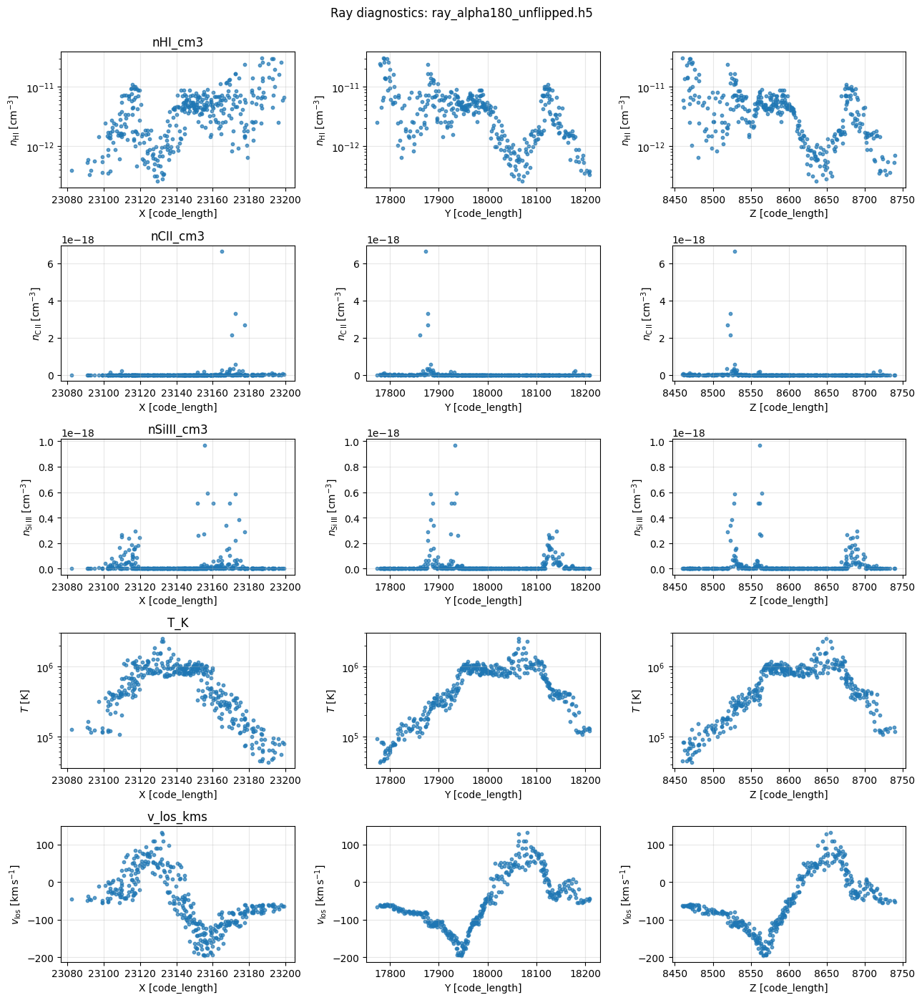

In [10]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import yt
import numpy as np
import matplotlib.pyplot as plt

# ─── Load your ray ───────────────────────────────────────────────
# ray_path = "/scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/ray/ray_alpha200_unflipped.h5"

ray_path = "/Users/tsingh65/github_repos/COS-GASS/tests/56372_sightlines/results_563732/ray/ray_alpha180_unflipped.h5"
ray = yt.load(ray_path)
ad = ray.all_data()

def get_field(ad, key, unit=None):
    try:
        arr = ad[key]
        if unit: arr = arr.to(unit)
        return np.asarray(arr)
    except Exception:
        return np.full(1, np.nan)

# ─── Extract useful data ─────────────────────────────────────────
data = {}
data["x_code"] = get_field(ad, ("gas","x"), "code_length")
data["y_code"] = get_field(ad, ("gas","y"), "code_length")
data["z_code"] = get_field(ad, ("gas","z"), "code_length")
data["dl_cm"]  = get_field(ad, ("gas","dl"), "cm")

for f, key, unit in [
    (("gas","H_p0_number_density"), "nHI_cm3", "cm**-3"),
    (("gas","C_p1_number_density"), "nCII_cm3","cm**-3"),
    (("gas","Si_p2_number_density"),"nSiIII_cm3","cm**-3"),
    (("gas","temperature"), "T_K", "K"),
    (("gas","velocity_los"), "v_los_kms", "km/s")
]:
    data[key] = get_field(ad, f, unit)

# Optional integrated columns
for nkey, Nkey in [("nHI_cm3","NHI_cm2"),("nCII_cm3","NCII_cm2"),("nSiIII_cm3","NSiIII_cm2")]:
    if data.get(nkey) is not None and data.get("dl_cm") is not None:
        data[Nkey] = data[nkey] * data["dl_cm"]

# ─── Plot settings ───────────────────────────────────────────────
labels = {
    "nHI_cm3": r"$n_{\rm HI}\ [{\rm cm^{-3}}]$",
    "nCII_cm3": r"$n_{\rm C\,II}\ [{\rm cm^{-3}}]$",
    "nSiIII_cm3": r"$n_{\rm Si\,III}\ [{\rm cm^{-3}}]$",
    "T_K": r"$T\ [{\rm K}]$",
    "v_los_kms": r"$v_{\rm los}\ [{\rm km\,s^{-1}}]$",
    "NHI_cm2": r"$N_{\rm HI}\ [{\rm cm^{-2}}]$",
    "NCII_cm2": r"$N_{\rm C\,II}\ [{\rm cm^{-2}}]$",
    "NSiIII_cm2": r"$N_{\rm Si\,III}\ [{\rm cm^{-2}}]$",
}

fields_to_plot = ["nHI_cm3","nCII_cm3","nSiIII_cm3","T_K","v_los_kms"]

# ─── Make scatter grid ───────────────────────────────────────────
fig, axes = plt.subplots(len(fields_to_plot), 3, figsize=(13, 2.8*len(fields_to_plot)), squeeze=False)

for i, fkey in enumerate(fields_to_plot):
    for j, coord in enumerate(["x_code","y_code","z_code"]):
        ax = axes[i,j]
        if fkey in data and coord in data:
            x = data[coord]
            y = data[fkey]
            m = np.isfinite(x) & np.isfinite(y)
            ax.scatter(x[m], y[m], s=10, alpha=0.7)
            if np.all(y[m] > 0):
                ax.set_yscale("log")
            ax.set_xlabel(f"{coord.replace('_code','').upper()} [code_length]")
            ax.set_ylabel(labels.get(fkey, fkey))
            ax.grid(alpha=0.3)
        if j == 0:
            ax.set_title(fkey)

fig.suptitle(f"Ray diagnostics: {ray_path.split('/')[-1]}", y=0.995)
fig.tight_layout()
plt.show()

In [4]:
# %% [markdown]
# Sightline → Ray → Spectrum (yt + Trident) for TNG cutout
# - Endpoints are ckpc/h absolute, wrapped to box
# - Trident ray + Spectrum; lines passed via make_spectrum(..., lines=...)
# - Projection: LOS-only helper function; annotates star + "Sightline"; no deprecated plot_args
# - RUN ACROSS MULTIPLE ANGLES (0→360 in 30° steps), saving per-angle outputs

# %% Imports & paths
import os, time, json, math, re
from pathlib import Path

import numpy as np
import pandas as pd
import h5py
import yt
import trident
import matplotlib.pyplot as plt

# --- Paths (edit if needed) ---
DATA_DIR   = "/scratch/tsingh65/TNG50-1_snap99"
 = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
ENDPOINTS  = f"{DATA_DIR}/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
OUT_ROOT   = f"{DATA_DIR}/56372_sightlines/results_563732"

# --- Config ---
SUB_ID      = 563732
ANGLES_DEG  = np.arange(0, 361, 30)  # <— run 0..360 inclusive in 30° steps
LINES       = ["H I 1216", "C II 1335", "Si III 1206"]
INSTR       = "COS-G130M"
ZOOM_HALF   = 3.0
RANDOM_SEED = 42

# %% Helpers
def ensure_dir(p): Path(p).mkdir(parents=True, exist_ok=True)

def tprint(msg, fh=None):
    ts = time.strftime("%Y-%m-%d %H:%M:%S")
    line = f"[{ts}] {msg}"
    print(line)
    if fh: fh.write(line + "\n"); fh.flush()

def read_cutout_center_ckpch(h5_path):
    with h5py.File(h5_path, "r") as f:
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            sel = json.loads(f["CutoutInfo"].attrs["Selection"])
            if "center_ckpc_h" in sel:
                return np.array(sel["center_ckpc_h"], float)
    return None

def load_first_endpoint_alpha0(csv_path, alpha=0, prefer_suffix="noflip"):
    df = pd.read_csv(csv_path)
    cols = list(df.columns)
    cols_l = {c.lower(): c for c in cols}

    alpha_col = None
    for cand in ["alpha_deg", "alpha", "angle_deg", "angle", "rot", "theta"]:
        if cand in cols_l:
            alpha_col = cols_l[cand]
            break
    sel = df
    if alpha_col is not None:
        a_vals = pd.to_numeric(df[alpha_col], errors="coerce")
        take = sel[np.isclose(a_vals, alpha, equal_nan=False)]
        if not take.empty:
            sel = take

    have_noflip = any(re.search(r"_noflip$", c) for c in cols)
    have_flip   = any(re.search(r"_flip$",   c) for c in cols)
    prefer_suffix = (prefer_suffix or "").lower()
    if prefer_suffix not in {"noflip","flip"}:
        prefer_suffix = "noflip"
    if prefer_suffix == "noflip" and not have_noflip and have_flip:
        chosen = "flip"
    elif prefer_suffix == "flip" and not have_flip and have_noflip:
        chosen = "noflip"
    elif (prefer_suffix == "noflip" and have_noflip) or (prefer_suffix == "flip" and have_flip):
        chosen = prefer_suffix
    else:
        chosen = None

    if sel.empty:
        sel = df
    row = sel.iloc[0]

    def _vec_from_xyz(r, X, Y, Z):
        if (X in r.index) and (Y in r.index) and (Z in r.index):
            return np.array([float(r[X]), float(r[Y]), float(r[Z])], float)
        return None

    p0 = p1 = None
    if chosen is not None:
        p0 = _vec_from_xyz(row, f"p0_X_ckpch_abs_{chosen}", f"p0_Y_ckpch_abs_{chosen}", f"p0_Z_ckpch_abs_{chosen}")
        p1 = _vec_from_xyz(row, f"p1_X_ckpch_abs_{chosen}", f"p1_Y_ckpch_abs_{chosen}", f"p1_Z_ckpch_abs_{chosen}")
        if p0 is None or p1 is None:
            p0 = p0 or _vec_from_xyz(row, f"p0_x_kpc_{chosen}", f"p0_y_kpc_{chosen}", f"p0_z_kpc_{chosen}")
            p1 = p1 or _vec_from_xyz(row, f"p1_x_kpc_{chosen}", f"p1_y_kpc_{chosen}", f"p1_z_kpc_{chosen}")
    else:
        p0 = _vec_from_xyz(row, "p0_X_ckpch_abs", "p0_Y_ckpch_abs", "p0_Z_ckpch_abs")
        p1 = _vec_from_xyz(row, "p1_X_ckpch_abs", "p1_Y_ckpch_abs", "p1_Z_ckpch_abs")

    if p0 is None or p1 is None:
        raise RuntimeError(f"Could not find start/end vectors. Columns: {cols}")

    flip_label = {"noflip":"unflipped","flip":"flipped"}.get(chosen, "unknown")

    def _get_float(name, default=np.nan):
        c = cols_l.get(name)
        try: return float(row[c]) if (c and c in row.index and pd.notna(row[c])) else default
        except: return default

    meta = dict(
        alpha_deg = _get_float("alpha_deg", _get_float("alpha", np.nan)),
        inc_deg   = _get_float("inc_deg", np.nan),
        rho_kpc   = _get_float("rho_kpc", np.nan),
        phi_deg   = _get_float("phi_deg", np.nan),
        Rvir_kpc  = _get_float("rvir_kpc", np.nan),
        flip      = flip_label,
        span      = str(row.get("span", "na")),
        subhalo   = int(_get_float("subhaloid", SUB_ID)),
        suffix    = chosen or "",
    )
    return p0, p1, meta

def coerce_endpoints_to_code_length_and_wrap(p0, p1, ds, assume_units="auto"):
    LE = ds.domain_left_edge.to_ndarray()
    RE = ds.domain_right_edge.to_ndarray()
    boxL = RE - LE
    h = float(ds.parameters.get("hubble_constant", 0.6774))

    p0c = np.array(p0, float)
    p1c = np.array(p1, float)

    if assume_units == "auto":
        if (p0c.max() > RE.max()) or (p1c.max() > RE.max()) or (p0c.min() < LE.min()) or (p1c.min() < LE.min()):
            p0c *= h
            p1c *= h
    elif assume_units == "ckpc":
        p0c *= h; p1c *= h

    p0c = ((p0c - LE) % boxL) + LE
    p1c = ((p1c - LE) % boxL) + LE
    return p0c, p1c

def make_ray(ds, sp_ckpch, ep_ckpch, out_h5):
    trident.add_ion_fields(ds, ions=["H I", "C II", "Si III"])
    trident.make_simple_ray(
        ds,
        start_position=ds.arr(sp_ckpch, "code_length"),
        end_position=ds.arr(ep_ckpch, "code_length"),
        data_filename=out_h5,
        ftype="gas",
        fields=[('gas','temperature'), ('gas','metallicity')],
        lines=LINES
    )
    return yt.load(out_h5)

def spectrum_dict(ray, instr=INSTR, lines=LINES, seed=RANDOM_SEED):
    sg = trident.SpectrumGenerator(instr)
    np.random.seed(seed)
    sg.make_spectrum(ray, lines=lines, output_absorbers_file=None)
    lam = np.array(sg.lambda_field)
    flux_lsf = np.array(sg.flux_field)
    tau_raw  = np.array(sg.tau_field)
    return {
        "raw": {"lambda_A": lam, "flux": np.ones_like(lam), "tau": tau_raw},
        "lsf": {"lambda_A": lam, "flux": flux_lsf,         "tau": tau_raw},
    }

def annotate_sightline_on_plot(pw, sp, ep, color="deeppink", lw=2.0):
    # New-style kwargs (no deprecated plot_args)
    pw.annotate_line(sp, ep, coord_system='data', color=color, linewidth=lw)

def proj_width_from_box(ds, frac=0.5, unit="kpc"):
    return (frac * float(ds.domain_width.to(unit).min()), unit)

# ---- LOS projection helper (ions, LOS only, 4*Rvir, centered on subhalo) ----
ION_FIELDS = {
    "HI"   : ('gas', 'H_p0_number_density'),
    "CII"  : ('gas', 'C_p1_number_density'),
    "SiIII": ('gas', 'Si_p2_number_density'),
}

def los_projections(
    ds,
    p0_ckpch,
    p1_ckpch,
    center_ckpch=None,
    Rvir_kpc=np.nan,
    ions=ION_FIELDS,
    out_dir=None,
    tag="alphaLOS",
    logger=None
):
    """
    LOS OffAxisProjectionPlot for requested ions.
    - center: subhalo center (ckpc/h). If None, ds.domain_center.
    - width=depth=4*Rvir kpc if available; else fallback to half the smallest box side.
    - Annotates LOS line, a star at midpoint, and 'Sightline'.
    Returns {ion_name: output_png}.
    """
    if out_dir is None:
        out_dir = os.path.join(OUT_ROOT, "proj")
    ensure_dir(out_dir)

    center = ds.domain_center if center_ckpch is None else ds.arr(center_ckpch, "code_length")

    if np.isfinite(Rvir_kpc) and (Rvir_kpc > 0):
        box_kpc = 4.0 * float(Rvir_kpc)
    else:
        box_kpc = float(ds.domain_width.to("kpc").min()) * 0.5
    width = (box_kpc, "kpc")
    depth = (box_kpc, "kpc")

    vlos = np.array(p1_ckpch, float) - np.array(p0_ckpch, float)
    nrm = np.linalg.norm(vlos)
    if not np.isfinite(nrm) or nrm == 0.0:
        raise ValueError("LOS vector has zero length; p0 and p1 are identical.")
    nvec = vlos / nrm

    sp = ds.arr(p0_ckpch, "code_length")
    ep = ds.arr(p1_ckpch, "code_length")
    mp = ds.arr(0.5 * (np.array(p0_ckpch) + np.array(p1_ckpch)), "code_length")

    saved = {}
    for ion_name, pfield in ions.items():
        try:
            pw = yt.OffAxisProjectionPlot(
                ds, nvec, pfield,
                center=center, width=width, depth=depth, weight_field=None
            )
            pw.set_cmap(pfield, "viridis")

            # LOS and markers (kwargs; not plot_args)
            pw.annotate_line(sp, ep, coord_system="data", color="deeppink", linewidth=2.0)
            pw.annotate_marker(mp, coord_system="data", marker="*", s=160, color="yellow")
            pw.annotate_text(
                mp, "Sightline",
                coord_system="data",
                text_args={"color": "yellow", "fontsize": 12}
            )

            out_png = os.path.join(out_dir, f"proj_{ion_name}_{tag}_LOS_4Rvir.png")
            pw.save(out_png)
            if logger: tprint(f"[proj] saved {out_png}", logger)
            saved[ion_name] = out_png
        except Exception as e:
            if logger: tprint(f"[proj:{ion_name}:LOS] FAILED: {e}", logger)
    return saved

# =========================
# ==== MAIN: MULTI-α  =====
# =========================
ensure_dir(OUT_ROOT)

# Load dataset once
master_log_path = os.path.join(OUT_ROOT, "logs_all_angles.txt")
logf = open(master_log_path, "a")
t0 = time.perf_counter()
tprint(f"Loading cutout: {CUTOUT_H5}", logf)
ds = yt.load(CUTOUT_H5)
tprint(f"Loaded ds: {ds}", logf)
tprint(f"Domain left/right edge (code_length): {ds.domain_left_edge}, {ds.domain_right_edge}", logf)
tprint(f"Domain width (kpc): {ds.domain_width.to('kpc')}", logf)
cut_center_ckpch = read_cutout_center_ckpch(CUTOUT_H5)
if cut_center_ckpch is not None:
    tprint(f"cutout center (ckpc/h): {cut_center_ckpch}", logf)
t1 = time.perf_counter()
tprint(f"yt.load() took {t1-t0:.2f} s", logf)

# Add ion fields once
t2 = time.perf_counter()
tprint("Adding ion fields (Trident)…", logf)
trident.add_ion_fields(ds, ions=["H I","C II","Si III"])
t3 = time.perf_counter()
tprint(f"add_ion_fields() took {t3-t2:.2f} s", logf)

# Precompute box edges for wrapping
LE = ds.domain_left_edge.to_ndarray()
RE = ds.domain_right_edge.to_ndarray()
boxL = RE - LE
def _wrap(p):
    p = np.array(p, float)
    return ((p - LE) % boxL) + LE

# Loop over requested angles
for alpha in ANGLES_DEG:
    angle_tag = f"alpha_{int(alpha):03d}"
    OUT_ALPHA   = os.path.join(OUT_ROOT, angle_tag)
    OUT_RAY     = os.path.join(OUT_ALPHA, "ray")
    OUT_PROJ    = os.path.join(OUT_ALPHA, "proj")
    OUT_DEBUG   = os.path.join(OUT_ALPHA, "debug")
    for d in (OUT_ALPHA, OUT_RAY, OUT_PROJ, OUT_DEBUG): ensure_dir(d)

    # Separate per-angle log
    log_path = os.path.join(OUT_ALPHA, "logs.txt")
    with open(log_path, "a") as lf:
        tprint(f"\n=== Running angle α = {alpha}° ===", lf)

        # --- Read endpoints for this angle (prefer unflipped if present) ---
        p0_raw, p1_raw, meta = load_first_endpoint_alpha0(ENDPOINTS, alpha, prefer_suffix="noflip")
        tprint(f"Endpoints (as read, ckpc/h): p0={p0_raw}, p1={p1_raw}", lf)

        # Wrap into box (already ckpc/h absolute)
        p0_ckpch = _wrap(p0_raw)
        p1_ckpch = _wrap(p1_raw)
        tprint(f"Endpoints (code_length, wrapped): p0={p0_ckpch}, p1={p1_ckpch}", lf)

        inside0 = np.all((p0_ckpch >= LE) & (p0_ckpch <= RE))
        inside1 = np.all((p1_ckpch >= LE) & (p1_ckpch <= RE))
        tprint(f"Endpoints inside domain? p0={inside0}, p1={inside1}", lf)

        # ---- Make the ray
        ray_h5 = os.path.join(OUT_RAY, f"ray_{angle_tag}_{meta.get('flip','unflipped')}.h5")
        try:
            t4 = time.perf_counter()
            tprint("Making ray with trident.make_simple_ray()", lf)
            ray_ds = make_ray(ds, p0_ckpch, p1_ckpch, ray_h5)
            t5 = time.perf_counter()
            tprint(f"Ray build took {t5-t4:.2f} s → {ray_h5}", lf)
            ad = ray_ds.all_data()
            n_cells = ad[('gas','dl')].size
            tprint(f"[ray] N_cells = {n_cells}", lf)
        except Exception as e:
            tprint(f"[ray:{angle_tag}] FAILED: {e}", lf)
            continue  # skip to next angle

        # ---- Spectrum
        try:
            t6 = time.perf_counter()
            tprint(f"Making spectrum ({INSTR}) for {LINES}", lf)
            spec = spectrum_dict(ray_ds, instr=INSTR, lines=LINES)
            t7 = time.perf_counter()
            tprint(f"Spectrum took {t7-t6:.2f} s", lf)

            def transmission(flux, tau):
                return np.exp(-tau) if np.allclose(flux, 1.0) else flux

            lam_raw = spec["raw"]["lambda_A"];  tau_raw  = spec["raw"]["tau"];  flux_raw = spec["raw"]["flux"]
            lam_lsf = spec["lsf"]["lambda_A"];  tau_lsf  = spec["lsf"]["tau"];  flux_lsf = spec["lsf"]["flux"]
            T_raw = transmission(flux_raw, tau_raw)
            T_lsf = transmission(flux_lsf, tau_lsf)

            # Full spectrum plot
            fig = plt.figure(figsize=(11, 4))
            ax = fig.add_subplot(111)
            ax.plot(lam_raw, T_raw, lw=0.9, label="raw τ→exp(-τ)")
            ax.plot(lam_lsf, T_lsf, lw=1.0, alpha=0.9, label=f"{INSTR} LSF")
            ax.set_ylim(-0.05, 1.05)
            ax.set_xlabel("Wavelength [Å]"); ax.set_ylabel("Transmission")
            ax.set_title(f"Spectrum {angle_tag} ({meta.get('flip','unflipped')}) — Subhalo {SUB_ID}")
            ax.legend(frameon=False); ax.grid(alpha=0.2)
            plt.tight_layout()
            png_spec = os.path.join(OUT_RAY, f"spectrum_full_{angle_tag}_{meta.get('flip','unflipped')}.png")
            plt.savefig(png_spec, dpi=160); plt.close(fig)
            tprint(f"[saved] {png_spec}", lf)

            # Zoom panels
            zoom_centers = {"Lyα 1215.67":1215.67, "Si III 1206.50":1206.50, "C II 1334.53":1334.53}
            fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharey=True)
            for ax, (name, lam0) in zip(axes, zoom_centers.items()):
                m  = (lam_raw >= lam0 - ZOOM_HALF) & (lam_raw <= lam0 + ZOOM_HALF)
                ml = (lam_lsf >= lam0 - ZOOM_HALF) & (lam_lsf <= lam0 + ZOOM_HALF)
                ax.plot(lam_raw[m], T_raw[m], lw=0.9)
                ax.plot(lam_lsf[ml], T_lsf[ml], lw=1.0, alpha=0.9)
                ax.axvline(lam0, ls="--", lw=0.8, alpha=0.6)
                ax.set_xlim(lam0 - ZOOM_HALF, lam0 + ZOOM_HALF)
                ax.set_title(name); ax.set_xlabel("λ [Å]")
            axes[0].set_ylabel("Transmission")
            fig.suptitle(f"Zoomed lines ({angle_tag} {meta.get('flip','unflipped')})", y=1.04)
            plt.tight_layout()
            png_zoom = os.path.join(OUT_RAY, f"spectrum_zooms_{angle_tag}_{meta.get('flip','unflipped')}.png")
            plt.savefig(png_zoom, dpi=160); plt.close(fig)
            tprint(f"[saved] {png_zoom}", lf)
        except Exception as e:
            tprint(f"[spectrum:{angle_tag}] FAILED: {e}", lf)

        # ---- LOS-only projections (reusable)
        try:
            center_ckpch = cut_center_ckpch if cut_center_ckpch is not None else None
            _ = los_projections(
                ds,
                p0_ckpch=p0_ckpch,
                p1_ckpch=p1_ckpch,
                center_ckpch=center_ckpch,
                Rvir_kpc=float(meta.get("Rvir_kpc", np.nan)),
                ions=ION_FIELDS,
                out_dir=OUT_PROJ,
                tag=f"{angle_tag}_{meta.get('flip','unflipped')}",
                logger=lf
            )
        except Exception as e:
            tprint(f"[proj:{angle_tag}] FAILED: {e}", lf)

        # ---- Debug: 3D preview of endpoints
        try:
            fig = plt.figure(figsize=(5.5,5))
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter([p0_ckpch[0], p1_ckpch[0]],
                       [p0_ckpch[1], p1_ckpch[1]],
                       [p0_ckpch[2], p1_ckpch[2]], s=20, c=["lime","crimson"])
            ax.plot([p0_ckpch[0], p1_ckpch[0]],
                    [p0_ckpch[1], p1_ckpch[1]],
                    [p0_ckpch[2], p1_ckpch[2]], c="yellow", lw=2)
            ax.set_title("Endpoints preview (code_length = ckpc/h)")
            ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
            plt.tight_layout()
            dbg_png = os.path.join(OUT_DEBUG, f"endpoints_preview_{angle_tag}.png")
            plt.savefig(dbg_png, dpi=140); plt.close(fig)
            tprint(f"[debug] {dbg_png}", lf)
        except Exception as e:
            tprint(f"[debug:{angle_tag}] FAILED: {e}", lf)

tprint("All done (all angles).", logf)
logf.close()

yt : [INFO     ] 2025-10-08 15:20:30,567 Calculating time from 1.000e+00 to be 4.356e+17 seconds


[2025-10-08 15:20:30] Loading cutout: /scratch/tsingh65/TNG50-1_snap99/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5


yt : [INFO     ] 2025-10-08 15:20:30,621 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:20:30,622 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:20:30,623 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-10-08 15:20:30,623 Parameters: domain_right_edge         = [35000. 35000. 35000.]
yt : [INFO     ] 2025-10-08 15:20:30,623 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:20:30,624 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:20:30,624 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:20:30,625 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:20:30,625 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-10-08 15:20:30,625 Parameters: hubble_constant           = 0.6774
yt : [INFO     ] 2025-10-08 15:20:30,823 Allocating for 5.54e+06 particl

[2025-10-08 15:20:30] Loaded ds: cutout_ALLFIELDS_sphere_2p1Rvir_sub563732
[2025-10-08 15:20:30] Domain left/right edge (code_length): [0. 0. 0.] code_length, [35000. 35000. 35000.] code_length
[2025-10-08 15:20:30] Domain width (kpc): [51668.1499159 51668.1499159 51668.1499159] kpc
[2025-10-08 15:20:30] cutout center (ckpc/h): [23253.   17960.3   8687.82]
[2025-10-08 15:20:30] yt.load() took 0.27 s
[2025-10-08 15:20:30] Adding ion fields (Trident)…


Loading particle index: 100%|██████████| 13/13 [00:00<00:00, 6099.78it/s]
yt : [WARNING  ] 2025-10-08 15:20:31,618 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,619 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,697 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,698 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,698 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,699 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,699 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,700 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:31,700 Field ('gas', 'C_p1_density') alr

[2025-10-08 15:20:31] add_ion_fields() took 0.99 s
[2025-10-08 15:20:31] 
=== Running angle α = 0° ===
[2025-10-08 15:20:31] Endpoints (as read, ckpc/h): p0=[23409.1455571  18152.1981869   8540.20628304], p1=[23314.04106114 17910.33855334  8964.88558419]
[2025-10-08 15:20:31] Endpoints (code_length, wrapped): p0=[23409.1455571  18152.1981869   8540.20628304], p1=[23314.04106114 17910.33855334  8964.88558419]
[2025-10-08 15:20:31] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:20:31] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:20:39,393 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/ray/ray_alpha_000_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:20:39,449 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:20:39,450 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:20:39,450 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:20:39,451 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:20:39,451 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:20:39,452 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:20:39,452 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:20:39,452 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:20:39,453

[2025-10-08 15:20:39] Ray build took 7.87 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/ray/ray_alpha_000_unflipped.h5
[2025-10-08 15:20:39] [ray] N_cells = 404
[2025-10-08 15:20:39] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 404/404 [00:00<00:00, 10413.78it/s]
yt : [INFO     ] 2025-10-08 15:20:39,904 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:20:39] Spectrum took 0.20 s
[2025-10-08 15:20:40] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/ray/spectrum_full_alpha_000_unflipped.png


yt : [INFO     ] 2025-10-08 15:20:40,561 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:40,561 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:40,562 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:40,563 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:20:40] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/ray/spectrum_zooms_alpha_000_unflipped.png


yt : [INFO     ] 2025-10-08 15:20:44,292 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/proj/proj_HI_alpha_000_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:20:44,666 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:44,667 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:44,667 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:44,668 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:20:44] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/proj/proj_HI_alpha_000_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:20:48,991 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/proj/proj_CII_alpha_000_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:20:49,415 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:49,416 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:49,416 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:20:49,417 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:20:49] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/proj/proj_CII_alpha_000_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:20:53,850 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/proj/proj_SiIII_alpha_000_unflipped_LOS_4Rvir.png


[2025-10-08 15:20:54] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/proj/proj_SiIII_alpha_000_unflipped_LOS_4Rvir.png
[2025-10-08 15:20:54] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_000/debug/endpoints_preview_alpha_000.png


yt : [WARNING  ] 2025-10-08 15:20:54,589 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,590 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,590 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,590 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,591 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,591 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,591 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,592 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,592 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:20:54,593 Field ('

[2025-10-08 15:20:54] 
=== Running angle α = 30° ===
[2025-10-08 15:20:54] Endpoints (as read, ckpc/h): p0=[23436.76500746 18174.12188091  8628.59732639], p1=[23177.41943013 17909.39841325  8961.09516625]
[2025-10-08 15:20:54] Endpoints (code_length, wrapped): p0=[23436.76500746 18174.12188091  8628.59732639], p1=[23177.41943013 17909.39841325  8961.09516625]
[2025-10-08 15:20:54] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:20:54] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:20:59,452 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/ray/ray_alpha_030_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:20:59,490 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:20:59,491 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:20:59,491 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:20:59,491 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:20:59,492 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:20:59,492 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:20:59,492 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:20:59,493 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:20:59,493

[2025-10-08 15:20:59] Ray build took 4.99 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/ray/ray_alpha_030_unflipped.h5
[2025-10-08 15:20:59] [ray] N_cells = 412
[2025-10-08 15:20:59] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 412/412 [00:00<00:00, 8662.75it/s]
yt : [INFO     ] 2025-10-08 15:20:59,999 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:20:59] Spectrum took 0.24 s
[2025-10-08 15:21:00] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/ray/spectrum_full_alpha_030_unflipped.png


yt : [INFO     ] 2025-10-08 15:21:00,694 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:00,694 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:00,695 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:00,695 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:21:00] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/ray/spectrum_zooms_alpha_030_unflipped.png


yt : [INFO     ] 2025-10-08 15:21:04,486 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/proj/proj_HI_alpha_030_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:21:04,831 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:04,832 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:04,832 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:04,833 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:21:04] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/proj/proj_HI_alpha_030_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:21:09,438 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/proj/proj_CII_alpha_030_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:21:09,891 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:09,891 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:09,892 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:09,893 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:21:09] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/proj/proj_CII_alpha_030_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:21:15,324 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/proj/proj_SiIII_alpha_030_unflipped_LOS_4Rvir.png


[2025-10-08 15:21:15] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/proj/proj_SiIII_alpha_030_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:21:16,132 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,132 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,132 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,133 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,133 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,133 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,134 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,134 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,134 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:16,135 Field ('

[2025-10-08 15:21:16] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_030/debug/endpoints_preview_alpha_030.png
[2025-10-08 15:21:16] 
=== Running angle α = 60° ===
[2025-10-08 15:21:16] Endpoints (as read, ckpc/h): p0=[23415.14948253 18196.43285867  8718.54980438], p1=[23061.05426182 17892.13933676  8891.51073498]
[2025-10-08 15:21:16] Endpoints (code_length, wrapped): p0=[23415.14948253 18196.43285867  8718.54980438], p1=[23061.05426182 17892.13933676  8891.51073498]
[2025-10-08 15:21:16] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:21:16] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:21:21,350 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/ray/ray_alpha_060_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:21:21,438 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:21:21,439 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:21:21,439 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:21:21,440 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:21:21,440 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:21:21,440 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:21:21,441 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:21:21,441 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:21:21,441

[2025-10-08 15:21:21] Ray build took 5.48 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/ray/ray_alpha_060_unflipped.h5
[2025-10-08 15:21:21] [ray] N_cells = 400
[2025-10-08 15:21:21] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 400/400 [00:00<00:00, 8314.77it/s]
yt : [INFO     ] 2025-10-08 15:21:22,045 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:21:22] Spectrum took 0.24 s
[2025-10-08 15:21:22] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/ray/spectrum_full_alpha_060_unflipped.png


yt : [INFO     ] 2025-10-08 15:21:22,750 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:22,751 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:22,751 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:22,752 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:21:22] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/ray/spectrum_zooms_alpha_060_unflipped.png


yt : [INFO     ] 2025-10-08 15:21:26,491 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/proj/proj_HI_alpha_060_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:21:26,796 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:26,797 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:26,797 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:26,798 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:21:26] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/proj/proj_HI_alpha_060_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:21:32,324 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/proj/proj_CII_alpha_060_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:21:32,788 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:32,789 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:32,789 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:32,790 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:21:32] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/proj/proj_CII_alpha_060_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:21:38,548 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/proj/proj_SiIII_alpha_060_unflipped_LOS_4Rvir.png


[2025-10-08 15:21:39] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/proj/proj_SiIII_alpha_060_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:21:39,402 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,403 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,403 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,403 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,404 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,404 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,404 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,405 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,405 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:21:39,405 Field ('

[2025-10-08 15:21:39] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_060/debug/endpoints_preview_alpha_060.png
[2025-10-08 15:21:39] 
=== Running angle α = 90° ===
[2025-10-08 15:21:39] Endpoints (as read, ckpc/h): p0=[23350.09084474 18213.15291171  8785.96102316], p1=[22996.12550909 17863.18587946  8774.77738254]
[2025-10-08 15:21:39] Endpoints (code_length, wrapped): p0=[23350.09084474 18213.15291171  8785.96102316], p1=[22996.12550909 17863.18587946  8774.77738254]
[2025-10-08 15:21:39] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:21:39] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:21:44,411 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/ray/ray_alpha_090_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:21:44,453 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:21:44,454 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:21:44,454 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:21:44,455 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:21:44,455 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:21:44,455 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:21:44,456 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:21:44,456 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:21:44,456

[2025-10-08 15:21:44] Ray build took 5.27 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/ray/ray_alpha_090_unflipped.h5
[2025-10-08 15:21:44] [ray] N_cells = 379
[2025-10-08 15:21:44] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 379/379 [00:00<00:00, 9594.13it/s]
yt : [INFO     ] 2025-10-08 15:21:45,049 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:21:45] Spectrum took 0.21 s
[2025-10-08 15:21:45] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/ray/spectrum_full_alpha_090_unflipped.png


yt : [INFO     ] 2025-10-08 15:21:45,748 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:45,749 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:45,749 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:45,750 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:21:45] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/ray/spectrum_zooms_alpha_090_unflipped.png


yt : [INFO     ] 2025-10-08 15:21:50,143 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/proj/proj_HI_alpha_090_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:21:50,471 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:50,472 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:50,472 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:50,473 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:21:50] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/proj/proj_HI_alpha_090_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:21:55,362 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/proj/proj_CII_alpha_090_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:21:55,764 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:55,765 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:55,765 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:21:55,766 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:21:55] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/proj/proj_CII_alpha_090_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:22:00,683 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/proj/proj_SiIII_alpha_090_unflipped_LOS_4Rvir.png


[2025-10-08 15:22:01] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/proj/proj_SiIII_alpha_090_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:22:01,464 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,464 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,464 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,465 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,465 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,465 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,466 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,466 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,466 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:01,466 Field ('

[2025-10-08 15:22:01] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_090/debug/endpoints_preview_alpha_090.png
[2025-10-08 15:22:01] 
=== Running angle α = 120° ===
[2025-10-08 15:22:01] Endpoints (as read, ckpc/h): p0=[23259.02150355 18219.80191532  8812.7682011 ], p1=[23000.0307788  17830.29609685  8642.17371645]
[2025-10-08 15:22:01] Endpoints (code_length, wrapped): p0=[23259.02150355 18219.80191532  8812.7682011 ], p1=[23000.0307788  17830.29609685  8642.17371645]
[2025-10-08 15:22:01] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:22:01] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:22:06,657 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/ray/ray_alpha_120_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:22:06,713 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:22:06,714 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:22:06,714 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:22:06,714 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:22:06,715 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:22:06,715 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:22:06,715 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:22:06,715 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:22:06,716

[2025-10-08 15:22:06] Ray build took 5.36 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/ray/ray_alpha_120_unflipped.h5
[2025-10-08 15:22:06] [ray] N_cells = 348
[2025-10-08 15:22:06] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 348/348 [00:00<00:00, 12612.60it/s]
yt : [INFO     ] 2025-10-08 15:22:07,129 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:22:07] Spectrum took 0.14 s
[2025-10-08 15:22:07] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/ray/spectrum_full_alpha_120_unflipped.png


yt : [INFO     ] 2025-10-08 15:22:07,804 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:07,805 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:07,805 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:07,806 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:22:07] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/ray/spectrum_zooms_alpha_120_unflipped.png


yt : [INFO     ] 2025-10-08 15:22:11,728 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/proj/proj_HI_alpha_120_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:22:12,022 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:12,023 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:12,023 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:12,024 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:22:12] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/proj/proj_HI_alpha_120_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:22:17,225 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/proj/proj_CII_alpha_120_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:22:17,727 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:17,728 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:17,728 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:17,729 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:22:17] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/proj/proj_CII_alpha_120_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:22:23,195 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/proj/proj_SiIII_alpha_120_unflipped_LOS_4Rvir.png


[2025-10-08 15:22:23] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/proj/proj_SiIII_alpha_120_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:22:23,985 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,986 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,987 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,987 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,987 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,988 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,988 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,988 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,989 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:23,989 Field ('

[2025-10-08 15:22:23] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_120/debug/endpoints_preview_alpha_120.png
[2025-10-08 15:22:23] 
=== Running angle α = 150° ===
[2025-10-08 15:22:23] Endpoints (as read, ckpc/h): p0=[23166.3434154  18214.59827436  8791.78837653], p1=[23071.72365709 17802.28277964  8529.23078194]
[2025-10-08 15:22:23] Endpoints (code_length, wrapped): p0=[23166.3434154  18214.59827436  8791.78837653], p1=[23071.72365709 17802.28277964  8529.23078194]
[2025-10-08 15:22:23] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:22:23] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:22:28,724 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/ray/ray_alpha_150_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:22:28,777 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:22:28,778 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:22:28,778 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:22:28,779 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:22:28,779 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:22:28,780 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:22:28,780 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:22:28,780 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:22:28,781

[2025-10-08 15:22:28] Ray build took 4.96 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/ray/ray_alpha_150_unflipped.h5
[2025-10-08 15:22:29] [ray] N_cells = 378


yt : [INFO     ] 2025-10-08 15:22:29,202 Setting instrument to COS-G130M
yt : [INFO     ] 2025-10-08 15:22:29,210 Creating spectrum


[2025-10-08 15:22:29] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 378/378 [00:00<00:00, 14110.67it/s]
yt : [INFO     ] 2025-10-08 15:22:29,396 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:22:29] Spectrum took 0.20 s
[2025-10-08 15:22:29] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/ray/spectrum_full_alpha_150_unflipped.png


yt : [INFO     ] 2025-10-08 15:22:30,031 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:30,032 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:30,032 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:30,033 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:22:30] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/ray/spectrum_zooms_alpha_150_unflipped.png


yt : [INFO     ] 2025-10-08 15:22:34,993 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/proj/proj_HI_alpha_150_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:22:35,334 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:35,334 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:35,335 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:35,335 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:22:35] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/proj/proj_HI_alpha_150_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:22:41,261 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/proj/proj_CII_alpha_150_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:22:41,743 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:41,743 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:41,744 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:41,745 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:22:41] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/proj/proj_CII_alpha_150_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:22:46,551 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/proj/proj_SiIII_alpha_150_unflipped_LOS_4Rvir.png


[2025-10-08 15:22:46] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/proj/proj_SiIII_alpha_150_unflipped_LOS_4Rvir.png
[2025-10-08 15:22:47] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_150/debug/endpoints_preview_alpha_150.png
[2025-10-08 15:22:47] 
=== Running angle α = 180° ===


yt : [WARNING  ] 2025-10-08 15:22:47,484 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,484 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,485 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,485 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,486 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,486 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,486 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,487 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,487 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:22:47,487 Field ('

[2025-10-08 15:22:47] Endpoints (as read, ckpc/h): p0=[23096.88959915 18198.93630021  8728.64307649], p1=[23191.99409511 17786.65207354  8466.21154712]
[2025-10-08 15:22:47] Endpoints (code_length, wrapped): p0=[23096.88959915 18198.93630021  8728.64307649], p1=[23191.99409511 17786.65207354  8466.21154712]
[2025-10-08 15:22:47] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:22:47] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:22:51,476 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/ray/ray_alpha_180_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:22:51,533 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:22:51,533 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:22:51,534 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:22:51,534 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:22:51,535 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:22:51,535 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:22:51,535 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:22:51,535 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:22:51,536

[2025-10-08 15:22:51] Ray build took 4.18 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/ray/ray_alpha_180_unflipped.h5
[2025-10-08 15:22:51] [ray] N_cells = 358
[2025-10-08 15:22:51] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 358/358 [00:00<00:00, 16323.97it/s]
yt : [INFO     ] 2025-10-08 15:22:51,996 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:22:51] Spectrum took 0.16 s
[2025-10-08 15:22:52] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/ray/spectrum_full_alpha_180_unflipped.png


yt : [INFO     ] 2025-10-08 15:22:53,029 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:53,030 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:53,030 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:53,031 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:22:53] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/ray/spectrum_zooms_alpha_180_unflipped.png


yt : [INFO     ] 2025-10-08 15:22:57,031 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/proj/proj_HI_alpha_180_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:22:57,326 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:57,327 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:57,327 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:22:57,328 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:22:57] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/proj/proj_HI_alpha_180_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:23:02,263 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/proj/proj_CII_alpha_180_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:23:02,775 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:02,776 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:02,776 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:02,777 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:23:02] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/proj/proj_CII_alpha_180_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:23:07,903 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/proj/proj_SiIII_alpha_180_unflipped_LOS_4Rvir.png


[2025-10-08 15:23:08] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/proj/proj_SiIII_alpha_180_unflipped_LOS_4Rvir.png
[2025-10-08 15:23:08] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_180/debug/endpoints_preview_alpha_180.png


yt : [WARNING  ] 2025-10-08 15:23:08,670 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,671 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,671 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,671 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,672 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,672 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,672 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,673 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,673 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:08,674 Field ('

[2025-10-08 15:23:08] 
=== Running angle α = 210° ===
[2025-10-08 15:23:08] Endpoints (as read, ckpc/h): p0=[23069.27014879 18177.0126062   8640.25203314], p1=[23328.61572612 17787.59221362  8470.00196506]
[2025-10-08 15:23:08] Endpoints (code_length, wrapped): p0=[23069.27014879 18177.0126062   8640.25203314], p1=[23328.61572612 17787.59221362  8470.00196506]
[2025-10-08 15:23:08] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:23:08] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:23:12,816 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/ray/ray_alpha_210_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:23:12,886 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:23:12,887 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:23:12,887 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:23:12,888 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:23:12,888 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:23:12,888 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:23:12,889 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:23:12,889 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:23:12,890

[2025-10-08 15:23:13] Ray build took 4.46 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/ray/ray_alpha_210_unflipped.h5
[2025-10-08 15:23:13] [ray] N_cells = 472
[2025-10-08 15:23:13] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 472/472 [00:00<00:00, 9677.90it/s]
yt : [INFO     ] 2025-10-08 15:23:13,593 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:23:13] Spectrum took 0.28 s
[2025-10-08 15:23:13] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/ray/spectrum_full_alpha_210_unflipped.png


yt : [INFO     ] 2025-10-08 15:23:14,283 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:14,283 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:14,284 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:14,284 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:23:14] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/ray/spectrum_zooms_alpha_210_unflipped.png


yt : [INFO     ] 2025-10-08 15:23:17,952 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/proj/proj_HI_alpha_210_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:23:18,288 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:18,288 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:18,288 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:18,289 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:23:18] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/proj/proj_HI_alpha_210_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:23:22,840 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/proj/proj_CII_alpha_210_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:23:23,320 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:23,321 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:23,321 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:23,322 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:23:23] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/proj/proj_CII_alpha_210_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:23:28,641 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/proj/proj_SiIII_alpha_210_unflipped_LOS_4Rvir.png


[2025-10-08 15:23:29] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/proj/proj_SiIII_alpha_210_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:23:29,405 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,405 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,405 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,406 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,406 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,407 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,407 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,407 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,407 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:29,408 Field ('

[2025-10-08 15:23:29] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_210/debug/endpoints_preview_alpha_210.png
[2025-10-08 15:23:29] 
=== Running angle α = 240° ===
[2025-10-08 15:23:29] Endpoints (as read, ckpc/h): p0=[23090.88567372 18154.70162844  8550.29955516], p1=[23444.98089443 17804.85129012  8539.58639633]
[2025-10-08 15:23:29] Endpoints (code_length, wrapped): p0=[23090.88567372 18154.70162844  8550.29955516], p1=[23444.98089443 17804.85129012  8539.58639633]
[2025-10-08 15:23:29] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:23:29] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:23:38,326 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/ray/ray_alpha_240_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:23:38,396 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:23:38,397 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:23:38,397 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:23:38,398 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:23:38,398 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:23:38,398 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:23:38,399 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:23:38,399 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:23:38,399

[2025-10-08 15:23:38] Ray build took 9.08 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/ray/ray_alpha_240_unflipped.h5
[2025-10-08 15:23:38] [ray] N_cells = 421
[2025-10-08 15:23:38] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 421/421 [00:00<00:00, 9310.90it/s]
yt : [INFO     ] 2025-10-08 15:23:38,839 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:23:38] Spectrum took 0.20 s
[2025-10-08 15:23:39] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/ray/spectrum_full_alpha_240_unflipped.png


yt : [INFO     ] 2025-10-08 15:23:39,531 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:39,531 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:39,531 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:39,532 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:23:39] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/ray/spectrum_zooms_alpha_240_unflipped.png


yt : [INFO     ] 2025-10-08 15:23:43,650 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/proj/proj_HI_alpha_240_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:23:43,963 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:43,964 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:43,964 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:43,965 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:23:43] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/proj/proj_HI_alpha_240_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:23:49,014 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/proj/proj_CII_alpha_240_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:23:49,746 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:49,746 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:49,747 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:23:49,748 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:23:49] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/proj/proj_CII_alpha_240_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:23:54,355 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/proj/proj_SiIII_alpha_240_unflipped_LOS_4Rvir.png


[2025-10-08 15:23:54] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/proj/proj_SiIII_alpha_240_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:23:55,125 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,126 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,126 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,126 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,126 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,127 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,127 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,127 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,128 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:23:55,128 Field ('

[2025-10-08 15:23:55] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_240/debug/endpoints_preview_alpha_240.png
[2025-10-08 15:23:55] 
=== Running angle α = 270° ===
[2025-10-08 15:23:55] Endpoints (as read, ckpc/h): p0=[23155.94431151 18137.9815754   8482.88833638], p1=[23509.90964716 17833.80474742  8656.31974877]
[2025-10-08 15:23:55] Endpoints (code_length, wrapped): p0=[23155.94431151 18137.9815754   8482.88833638], p1=[23509.90964716 17833.80474742  8656.31974877]
[2025-10-08 15:23:55] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:23:55] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:24:00,099 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/ray/ray_alpha_270_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:24:00,136 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:24:00,137 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:24:00,137 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:24:00,138 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:24:00,138 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:24:00,138 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:24:00,139 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:24:00,139 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:24:00,139

[2025-10-08 15:24:00] Ray build took 5.16 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/ray/ray_alpha_270_unflipped.h5
[2025-10-08 15:24:00] [ray] N_cells = 405
[2025-10-08 15:24:00] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 405/405 [00:00<00:00, 9875.26it/s]
yt : [INFO     ] 2025-10-08 15:24:00,643 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:24:00] Spectrum took 0.20 s
[2025-10-08 15:24:00] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/ray/spectrum_full_alpha_270_unflipped.png


yt : [INFO     ] 2025-10-08 15:24:01,288 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:01,288 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:01,288 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:01,289 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:24:01] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/ray/spectrum_zooms_alpha_270_unflipped.png


yt : [INFO     ] 2025-10-08 15:24:05,460 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/proj/proj_HI_alpha_270_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:24:06,263 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:06,264 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:06,265 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:06,265 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:24:06] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/proj/proj_HI_alpha_270_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:24:11,403 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/proj/proj_CII_alpha_270_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:24:11,898 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:11,898 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:11,899 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:11,900 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:24:11] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/proj/proj_CII_alpha_270_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:24:17,254 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/proj/proj_SiIII_alpha_270_unflipped_LOS_4Rvir.png


[2025-10-08 15:24:17] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/proj/proj_SiIII_alpha_270_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:24:18,201 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,201 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,202 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,202 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,202 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,203 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,203 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,203 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,204 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:18,204 Field ('

[2025-10-08 15:24:18] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_270/debug/endpoints_preview_alpha_270.png
[2025-10-08 15:24:18] 
=== Running angle α = 300° ===
[2025-10-08 15:24:18] Endpoints (as read, ckpc/h): p0=[23247.0136527  18131.33257179  8456.08115843], p1=[23506.00437745 17866.69453002  8788.92341486]
[2025-10-08 15:24:18] Endpoints (code_length, wrapped): p0=[23247.0136527  18131.33257179  8456.08115843], p1=[23506.00437745 17866.69453002  8788.92341486]
[2025-10-08 15:24:18] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:24:18] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:24:23,240 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/ray/ray_alpha_300_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:24:23,281 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:24:23,282 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:24:23,283 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:24:23,283 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:24:23,283 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:24:23,284 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:24:23,284 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:24:23,284 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:24:23,284

[2025-10-08 15:24:23] Ray build took 5.17 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/ray/ray_alpha_300_unflipped.h5
[2025-10-08 15:24:23] [ray] N_cells = 373
[2025-10-08 15:24:23] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 373/373 [00:00<00:00, 9938.79it/s]
yt : [INFO     ] 2025-10-08 15:24:23,699 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:24:23] Spectrum took 0.17 s
[2025-10-08 15:24:24] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/ray/spectrum_full_alpha_300_unflipped.png


yt : [INFO     ] 2025-10-08 15:24:24,778 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:24,779 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:24,779 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:24,780 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:24:24] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/ray/spectrum_zooms_alpha_300_unflipped.png


yt : [INFO     ] 2025-10-08 15:24:28,831 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/proj/proj_HI_alpha_300_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:24:29,188 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:29,189 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:29,189 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:29,190 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:24:29] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/proj/proj_HI_alpha_300_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:24:34,395 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/proj/proj_CII_alpha_300_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:24:34,881 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:34,881 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:34,882 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:34,883 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:24:34] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/proj/proj_CII_alpha_300_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:24:40,704 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/proj/proj_SiIII_alpha_300_unflipped_LOS_4Rvir.png


[2025-10-08 15:24:41] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/proj/proj_SiIII_alpha_300_unflipped_LOS_4Rvir.png


yt : [WARNING  ] 2025-10-08 15:24:41,707 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,707 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,708 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,708 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,708 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,709 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,709 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,709 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,710 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:24:41,710 Field ('

[2025-10-08 15:24:41] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_300/debug/endpoints_preview_alpha_300.png
[2025-10-08 15:24:41] 
=== Running angle α = 330° ===
[2025-10-08 15:24:41] Endpoints (as read, ckpc/h): p0=[23339.69174085 18136.53621275  8477.060983  ], p1=[23434.31149916 17894.70784723  8901.86634936]
[2025-10-08 15:24:41] Endpoints (code_length, wrapped): p0=[23339.69174085 18136.53621275  8477.060983  ], p1=[23434.31149916 17894.70784723  8901.86634936]
[2025-10-08 15:24:41] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:24:41] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:24:46,005 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/ray/ray_alpha_330_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:24:46,052 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:24:46,053 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:24:46,053 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:24:46,054 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:24:46,054 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:24:46,055 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:24:46,055 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:24:46,055 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:24:46,055

[2025-10-08 15:24:46] Ray build took 4.53 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/ray/ray_alpha_330_unflipped.h5
[2025-10-08 15:24:46] [ray] N_cells = 416
[2025-10-08 15:24:46] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 416/416 [00:00<00:00, 9516.34it/s]
yt : [INFO     ] 2025-10-08 15:24:46,662 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:24:46] Spectrum took 0.25 s
[2025-10-08 15:24:47] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/ray/spectrum_full_alpha_330_unflipped.png


yt : [INFO     ] 2025-10-08 15:24:47,474 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:47,475 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:47,475 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:47,476 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:24:47] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/ray/spectrum_zooms_alpha_330_unflipped.png


yt : [INFO     ] 2025-10-08 15:24:51,582 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/proj/proj_HI_alpha_330_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:24:51,921 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:51,922 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:51,922 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:51,923 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:24:51] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/proj/proj_HI_alpha_330_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:24:56,834 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/proj/proj_CII_alpha_330_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:24:57,236 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:57,236 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:57,236 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:24:57,237 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:24:57] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/proj/proj_CII_alpha_330_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:25:02,720 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/proj/proj_SiIII_alpha_330_unflipped_LOS_4Rvir.png


[2025-10-08 15:25:03] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/proj/proj_SiIII_alpha_330_unflipped_LOS_4Rvir.png
[2025-10-08 15:25:03] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_330/debug/endpoints_preview_alpha_330.png


yt : [WARNING  ] 2025-10-08 15:25:03,409 Field ('gas', 'H_p0_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,410 Field ('gas', 'H_p0_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,410 Field ('gas', 'H_p0_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,411 Field ('gas', 'H_p0_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,411 Field ('gas', 'C_p1_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,411 Field ('gas', 'C_p1_number_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,412 Field ('gas', 'C_p1_density') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,412 Field ('gas', 'C_p1_mass') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,412 Field ('gas', 'Si_p2_ion_fraction') already exists. Not clobbering.
yt : [WARNING  ] 2025-10-08 15:25:03,413 Field ('

[2025-10-08 15:25:03] 
=== Running angle α = 360° ===
[2025-10-08 15:25:03] Endpoints (as read, ckpc/h): p0=[23409.1455571  18152.1981869   8540.20628304], p1=[23314.04106114 17910.33855334  8964.88558419]
[2025-10-08 15:25:03] Endpoints (code_length, wrapped): p0=[23409.1455571  18152.1981869   8540.20628304], p1=[23314.04106114 17910.33855334  8964.88558419]
[2025-10-08 15:25:03] Endpoints inside domain? p0=True, p1=True
[2025-10-08 15:25:03] Making ray with trident.make_simple_ray()


yt : [INFO     ] 2025-10-08 15:25:09,410 Saving field data to yt dataset: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/ray/ray_alpha_360_unflipped.h5.
yt : [INFO     ] 2025-10-08 15:25:09,488 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-08 15:25:09,488 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-08 15:25:09,489 Parameters: domain_left_edge          = [0. 0. 0.] code_length
yt : [INFO     ] 2025-10-08 15:25:09,489 Parameters: domain_right_edge         = [35000. 35000. 35000.] code_length
yt : [INFO     ] 2025-10-08 15:25:09,489 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-08 15:25:09,490 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-08 15:25:09,490 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-08 15:25:09,490 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-08 15:25:09,491

[2025-10-08 15:25:09] Ray build took 6.24 s → /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/ray/ray_alpha_360_unflipped.h5
[2025-10-08 15:25:09] [ray] N_cells = 404
[2025-10-08 15:25:09] Making spectrum (COS-G130M) for ['H I 1216', 'C II 1335', 'Si III 1206']


Adding line - Si III 1206 [1206.500000 A]: 100%|██████████| 404/404 [00:00<00:00, 10040.17it/s]
yt : [INFO     ] 2025-10-08 15:25:10,039 Not adding continuum Ly C: insufficient column density or out of range


[2025-10-08 15:25:10] Spectrum took 0.21 s
[2025-10-08 15:25:10] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/ray/spectrum_full_alpha_360_unflipped.png


yt : [INFO     ] 2025-10-08 15:25:10,725 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:10,726 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:10,726 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:10,727 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[2025-10-08 15:25:10] [saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/ray/spectrum_zooms_alpha_360_unflipped.png


yt : [INFO     ] 2025-10-08 15:25:14,818 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/proj/proj_HI_alpha_360_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:25:15,170 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:15,171 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:15,171 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:15,172 Making a fixed resolution buffer of (('gas', 'C_p1_number_density')) 800 by 800


[2025-10-08 15:25:15] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/proj/proj_HI_alpha_360_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:25:19,849 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/proj/proj_CII_alpha_360_unflipped_LOS_4Rvir.png
yt : [INFO     ] 2025-10-08 15:25:20,286 xlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:20,287 ylim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:20,287 zlim = -331.925955 331.925955
yt : [INFO     ] 2025-10-08 15:25:20,288 Making a fixed resolution buffer of (('gas', 'Si_p2_number_density')) 800 by 800


[2025-10-08 15:25:20] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/proj/proj_CII_alpha_360_unflipped_LOS_4Rvir.png


yt : [INFO     ] 2025-10-08 15:25:25,991 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/proj/proj_SiIII_alpha_360_unflipped_LOS_4Rvir.png


[2025-10-08 15:25:26] [proj] saved /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/proj/proj_SiIII_alpha_360_unflipped_LOS_4Rvir.png
[2025-10-08 15:25:26] [debug] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/results_563732/alpha_360/debug/endpoints_preview_alpha_360.png
[2025-10-08 15:25:26] All done (all angles).


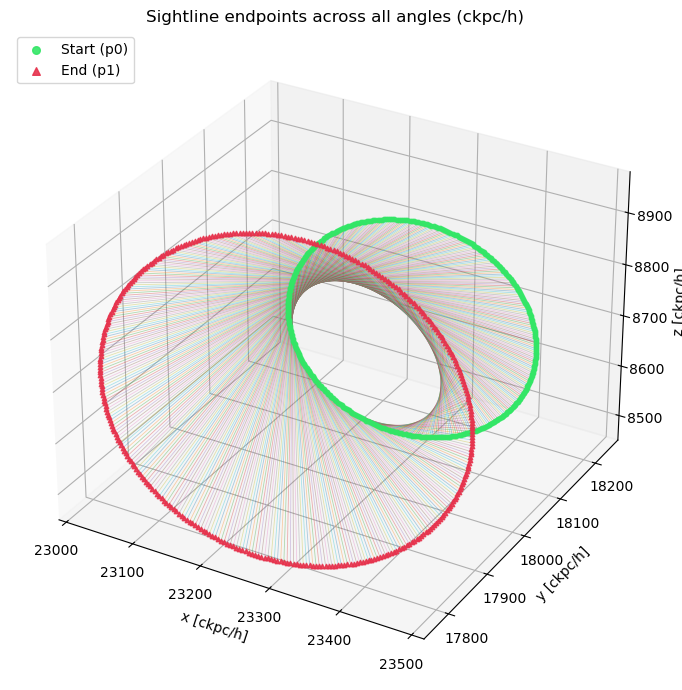

[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/all_angles_endpoints_3d.png


In [5]:
# 3D scatter of all sightline endpoints (start/end) for every angle in the CSV

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

ENDPOINTS_CSV = "/scratch/tsingh65/TNG50-1_snap99/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
PREFER_SUFFIX = "noflip"   # "noflip" | "flip" (will fall back if missing)
SAVE_PNG      = "/scratch/tsingh65/TNG50-1_snap99/56372_sightlines/all_angles_endpoints_3d.png"

df   = pd.read_csv(ENDPOINTS_CSV)
cols = {c.lower(): c for c in df.columns}

# Find angle column
angle_col = None
for cand in ["alpha_deg", "alpha", "angle_deg", "angle", "rot", "theta"]:
    if cand in cols:
        angle_col = cols[cand]
        break
if angle_col is None:
    raise RuntimeError("Could not find an angle column (alpha/angle/theta).")

# Determine which naming scheme the CSV uses for endpoints
def has_cols(suffix, pfx):
    need = [f"{pfx}_x_ckpch_abs_{suffix}", f"{pfx}_y_ckpch_abs_{suffix}", f"{pfx}_z_ckpch_abs_{suffix}"]
    return all(c in cols for c in map(str.lower, need))

def pick_suffix():
    have_noflip = any(re.search(r"_noflip$", c) for c in df.columns)
    have_flip   = any(re.search(r"_flip$",   c) for c in df.columns)
    wanted = (PREFER_SUFFIX or "").lower()
    if wanted not in {"noflip","flip"}: wanted = "noflip"
    if wanted == "noflip" and not have_noflip and have_flip: return "flip"
    if wanted == "flip"   and not have_flip   and have_noflip: return "noflip"
    if (wanted == "noflip" and have_noflip) or (wanted == "flip" and have_flip): return wanted
    return None

suffix = pick_suffix()

def get_vec(row, pfx):
    """Return (x,y,z) for p0/p1 in ckpc/h absolute coords."""
    if suffix is not None:
        X = cols.get(f"{pfx}_x_ckpch_abs_{suffix}")
        Y = cols.get(f"{pfx}_y_ckpch_abs_{suffix}")
        Z = cols.get(f"{pfx}_z_ckpch_abs_{suffix}")
        if X and Y and Z:
            return np.array([row[X], row[Y], row[Z]], dtype=float)
        # fallback to native kpc if needed (rare)
        X = cols.get(f"{pfx}_x_kpc_{suffix}")
        Y = cols.get(f"{pfx}_y_kpc_{suffix}")
        Z = cols.get(f"{pfx}_z_kpc_{suffix}")
        if X and Y and Z:
            return np.array([row[X], row[Y], row[Z]], dtype=float)  # note: this would be kpc
    # unsuffixed legacy layout
    X = cols.get(f"{pfx}_x_ckpch_abs"); Y = cols.get(f"{pfx}_y_ckpch_abs"); Z = cols.get(f"{pfx}_z_ckpch_abs")
    if X and Y and Z:
        return np.array([row[X], row[Y], row[Z]], dtype=float)
    raise RuntimeError(f"Could not find columns for {pfx} (got suffix={suffix}).")

# Sort by angle for a nice gradient along angles (optional)
df_sorted = df.copy()
df_sorted["_angle"] = pd.to_numeric(df_sorted[angle_col], errors="coerce")
df_sorted = df_sorted.sort_values("_angle")

# Prepare color map across angles
angles = df_sorted["_angle"].to_numpy()
valid  = np.isfinite(angles)
angles = angles[valid]
rows   = df_sorted[valid]

# Normalize angles 0..360 for color mapping (start/end get distinct base colors)
cmap = plt.get_cmap("viridis")
norm = plt.Normalize(vmin=np.nanmin(angles), vmax=np.nanmax(angles))

fig = plt.figure(figsize=(7,7))
ax  = fig.add_subplot(111, projection="3d")

# Collect extents for equal-aspect cube
all_pts = []

for _, row in rows.iterrows():
    try:
        p0 = get_vec(row, "p0")
        p1 = get_vec(row, "p1")
    except Exception:
        continue
    all_pts.append(p0); all_pts.append(p1)

    # draw line segment (light gray)
    ax.plot([p0[0], p1[0]], [p0[1], p1[1]], [p0[2], p1[2]], lw=0.6, alpha=0.35)

    # color by angle, but use two palettes for clarity
    c = cmap(norm(row["_angle"]))
    ax.scatter(p0[0], p0[1], p0[2], s=10, c=[(0.2,0.9,0.4,0.9)], marker="o")   # starts: lime-ish
    ax.scatter(p1[0], p1[1], p1[2], s=10, c=[(0.9,0.2,0.3,0.9)], marker="^")   # ends: crimson-ish

# Make axes equal
if all_pts:
    all_pts = np.vstack(all_pts)
    mins = np.min(all_pts, axis=0); maxs = np.max(all_pts, axis=0)
    ctr  = 0.5*(mins+maxs); span = (maxs-mins).max()
    lims = np.array([ctr - span/2, ctr + span/2])
    ax.set_xlim(lims[0,0], lims[1,0])
    ax.set_ylim(lims[0,1], lims[1,1])
    ax.set_zlim(lims[0,2], lims[1,2])

ax.set_title("Sightline endpoints across all angles (ckpc/h)")
ax.set_xlabel("x [ckpc/h]"); ax.set_ylabel("y [ckpc/h]"); ax.set_zlabel("z [ckpc/h]")

# Legend handles
start_proxy = ax.scatter([], [], [], s=30, c=[(0.2,0.9,0.4,0.9)], marker="o", label="Start (p0)")
end_proxy   = ax.scatter([], [], [], s=30, c=[(0.9,0.2,0.3,0.9)], marker="^", label="End (p1)")
ax.legend(handles=[start_proxy, end_proxy], loc="upper left")

plt.tight_layout()
# plt.savefig(SAVE_PNG, dpi=160)
plt.show()
print(f"[saved] {SAVE_PNG}")

In [13]:
# Interactive 3D Plotly map: gas particles + sightline endpoints + connecting lines
# - Reads TNG cutout (h5py) and endpoints CSV
# - Recenters on subhalo center stored in CutoutInfo/Selection.center_ckpc_h
# - Subsamples gas particles for performance
# - Colors gas points by gas density if present; otherwise by mass
# - Produces an interactive plotly figure (rotatable, zoomable)
#
# Requirements: h5py, numpy, pandas, plotly
# %pip install plotly pandas h5py --quiet

import os, re, json, h5py
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ----------------- Paths (edit) -----------------
DATA_DIR   = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5  = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
ENDPOINTS  = f"{DATA_DIR}/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
SAVE_HTML  = f"{DATA_DIR}/56372_sightlines/galaxy_3D_plotly.html"   # optional: set to None to not save

# ----------------- Config -----------------
MAX_GAS_POINTS = 200_000   # subsample cap for performance (browser + WebGL)
RANDOM_SEED    = 42
GAS_GROUP      = "PartType0"  # TNG gas

# ----------------- Helpers -----------------
def read_cutout_center_ckpch(h5_path):
    """Return cutout center (ckpc/h) from CutoutInfo.Selection.center_ckpc_h if present."""
    with h5py.File(h5_path, "r") as f:
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            try:
                sel = json.loads(f["CutoutInfo"].attrs["Selection"])
                if "center_ckpc_h" in sel:
                    return np.array(sel["center_ckpc_h"], float)
            except Exception:
                pass
    return None

def parse_endpoints(csv_path, prefer_suffix="noflip"):
    """
    Read all sightline endpoints from CSV.
    Supports *_noflip / *_flip columns or unsuffixed *ckpch_abs columns.
    Returns arrays p0, p1 with shape (N, 3) in ckpc/h absolute coords.
    """
    df = pd.read_csv(csv_path)
    cols = {c.lower(): c for c in df.columns}

    have_noflip = any(re.search(r"_noflip$", c) for c in df.columns)
    have_flip   = any(re.search(r"_flip$",   c) for c in df.columns)
    s = (prefer_suffix or "noflip").lower()
    if s not in {"noflip","flip"}: s = "noflip"
    if s=="noflip" and (not have_noflip) and have_flip: s="flip"
    if s=="flip"   and (not have_flip)   and have_noflip: s="noflip"
    if not (have_noflip or have_flip): s=None

    def get_vec(row, pfx):
        # try lower/upper cases with or without suffix
        for X,Y,Z in ( (f"{pfx}_x_ckpch_abs", f"{pfx}_y_ckpch_abs", f"{pfx}_z_ckpch_abs"),
                       (f"{pfx}_X_ckpch_abs", f"{pfx}_Y_ckpch_abs", f"{pfx}_Z_ckpch_abs") ):
            if s is not None:
                Xs, Ys, Zs = f"{X}_{s}", f"{Y}_{s}", f"{Z}_{s}"
                Xc, Yc, Zc = cols.get(Xs.lower()), cols.get(Ys.lower()), cols.get(Zs.lower())
                if Xc and Yc and Zc:
                    return np.array([row[Xc], row[Yc], row[Zc]], float)
            Xc, Yc, Zc = cols.get(X.lower()), cols.get(Y.lower()), cols.get(Z.lower())
            if Xc and Yc and Zc:
                return np.array([row[Xc], row[Yc], row[Zc]], float)
        raise RuntimeError(f"Missing endpoint columns for '{pfx}' in {csv_path}")

    p0s, p1s = [], []
    for _, r in df.iterrows():
        p0s.append(get_vec(r, "p0"))
        p1s.append(get_vec(r, "p1"))
    return np.asarray(p0s), np.asarray(p1s)

def load_gas_particles(h5_path, group="PartType0", max_points=200_000, seed=42):
    """
    Load gas particle coordinates (ckpc/h) and an optional color scalar (density or mass).
    Returns: coords (N,3), color (N,), info dict
    """
    with h5py.File(h5_path, "r") as f:
        if group not in f:
            raise RuntimeError(f"Group '{group}' not found in {h5_path}")

        g = f[group]
        # TNG stores in (ckpc/h) for Coordinates typically; use as-is
        coords = np.array(g["Coordinates"], dtype=float)   # shape (N, 3)
        N = coords.shape[0]

        # color scalar: prefer smoothed density if present, else particle density, else mass
        color = None
        for cand in ["Density", "Masses"]:
            if cand in g:
                color = np.array(g[cand], dtype=float).reshape(-1)
                break
        if color is None:
            color = np.zeros(N, dtype=float)

        # random subsample if very large
        if (max_points is not None) and (N > max_points):
            rng = np.random.default_rng(seed)
            idx = rng.choice(N, size=max_points, replace=False)
            coords = coords[idx]
            color  = color[idx]

        return coords, color, {"N_total": N, "N_used": coords.shape[0]}

# ----------------- Load everything -----------------
center_ckpch = read_cutout_center_ckpch(CUTOUT_H5)
if center_ckpch is None:
    raise RuntimeError("Could not find cutout center in CutoutInfo/Selection.center_ckpc_h")

gas_xyz, gas_color, gas_info = load_gas_particles(CUTOUT_H5, GAS_GROUP, MAX_GAS_POINTS, RANDOM_SEED)
p0_all, p1_all = parse_endpoints(ENDPOINTS, prefer_suffix="noflip")

# recentre on subhalo center for nicer viewing
gas_xyz_rel = gas_xyz - center_ckpch
p0_rel = p0_all - center_ckpch
p1_rel = p1_all - center_ckpch

# ----------------- Build Plotly figure -----------------
fig = go.Figure()

# Gas scatter (WebGL)
# Normalize color to 1–99.5 percentile to avoid a few extreme points dominating
c_lo, c_hi = np.percentile(gas_color, [1.0, 99.5])
if c_hi <= c_lo:
    c_lo, c_hi = gas_color.min(), gas_color.max() + 1e-12

fig.add_trace(go.Scatter3d(
    x=gas_xyz_rel[:,0], y=gas_xyz_rel[:,1], z=gas_xyz_rel[:,2],
    mode="markers",
    name=f"Gas (N={gas_info['N_used']:,}/{gas_info['N_total']:,})",
    marker=dict(
        size=1.5,
        opacity=0.45,
        color=np.clip((gas_color - c_lo)/(c_hi - c_lo), 0, 1),
        colorscale="Viridis",
        showscale=True,
        colorbar=dict(title="Density/Mass (scaled)")
    )
))

# Start points (p0): green
fig.add_trace(go.Scatter3d(
    x=p0_rel[:,0], y=p0_rel[:,1], z=p0_rel[:,2],
    mode="markers",
    name="Start points (p0)",
    marker=dict(size=4.5, color="limegreen", opacity=0.95, symbol="circle")
))

# End points (p1): red
fig.add_trace(go.Scatter3d(
    x=p1_rel[:,0], y=p1_rel[:,1], z=p1_rel[:,2],
    mode="markers",
    name="End points (p1)",
    marker=dict(size=4.5, color="crimson", opacity=0.95, symbol="circle")
))

# Connecting lines between each (p0_i -> p1_i) — pack with None-separators
lines_x = np.empty(p0_rel.shape[0]*3); lines_x[::3] = p0_rel[:,0]; lines_x[1::3] = p1_rel[:,0]; lines_x[2::3] = np.nan
lines_y = np.empty(p0_rel.shape[0]*3); lines_y[::3] = p0_rel[:,1]; lines_y[1::3] = p1_rel[:,1]; lines_y[2::3] = np.nan
lines_z = np.empty(p0_rel.shape[0]*3); lines_z[::3] = p0_rel[:,2]; lines_z[1::3] = p1_rel[:,2]; lines_z[2::3] = np.nan

fig.add_trace(go.Scatter3d(
    x=lines_x, y=lines_y, z=lines_z,
    mode="lines",
    name="Sightlines",
    line=dict(width=1.2, color="gold")
))

# Layout
fig.update_layout(
    title="Interactive 3D Gas Map (centered on subhalo) + Sightlines",
    scene=dict(
        xaxis_title="x (ckpc/h, centered)",
        yaxis_title="y (ckpc/h, centered)",
        zaxis_title="z (ckpc/h, centered)",
        aspectmode="data",
        xaxis=dict(showspikes=False),
        yaxis=dict(showspikes=False),
        zaxis=dict(showspikes=False),
    ),
    legend=dict(itemsizing="constant"),
    margin=dict(l=0, r=0, t=40, b=0),
)

# Nice initial camera
fig.update_scenes(camera=dict(
    eye=dict(x=1.6, y=1.2, z=1.0)  # tweak to taste
))

fig.show()

# Optional: write to a standalone HTML file you can open later
if SAVE_HTML:
    import plotly.io as pio
    pio.write_html(fig, SAVE_HTML, include_plotlyjs="cdn", auto_open=False)
    print(f"[saved] {SAVE_HTML}")

[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/galaxy_3D_plotly.html


In [15]:
import os, re, json, h5py
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# --- Paths / settings ---
DATA_DIR   = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5  = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
ENDPOINTS  = f"{DATA_DIR}/56372_sightlines/endpoints_sightlines_both_sid563732.csv"

MAX_GAS_POINTS = 100_000
MAX_RAY_SEGMENTS = 200  # how finely to sample each sightline for segment coloring

# --- Helpers (reuse from before) ---
def read_cutout_center_ckpch(h5_path):
    with h5py.File(h5_path, "r") as f:
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            sel = json.loads(f["CutoutInfo"].attrs["Selection"])
            if "center_ckpc_h" in sel:
                return np.array(sel["center_ckpc_h"], float)
    return None

def parse_endpoints(csv_path, prefer_suffix="noflip"):
    df = pd.read_csv(csv_path)
    cols = {c.lower(): c for c in df.columns}
    have_noflip = any(re.search(r"_noflip$", c) for c in df.columns)
    have_flip   = any(re.search(r"_flip$",   c) for c in df.columns)
    s = (prefer_suffix or "noflip").lower()
    if s not in {"noflip","flip"}:
        s = "noflip"
    if s == "noflip" and (not have_noflip) and have_flip:
        s = "flip"
    if s == "flip" and (not have_flip) and have_noflip:
        s = "noflip"
    if not (have_noflip or have_flip):
        s = None

    def get_vec(row, pfx):
        for X, Y, Z in [(f"{pfx}_x_ckpch_abs", f"{pfx}_y_ckpch_abs", f"{pfx}_z_ckpch_abs"),
                        (f"{pfx}_X_ckpch_abs", f"{pfx}_Y_ckpch_abs", f"{pfx}_Z_ckpch_abs")]:
            if s is not None:
                Xs, Ys, Zs = f"{X}_{s}", f"{Y}_{s}", f"{Z}_{s}"
                Xc, Yc, Zc = cols.get(Xs.lower()), cols.get(Ys.lower()), cols.get(Zs.lower())
                if Xc and Yc and Zc:
                    return np.array([row[Xc], row[Yc], row[Zc]], float)
            Xc, Yc, Zc = cols.get(X.lower()), cols.get(Y.lower()), cols.get(Z.lower())
            if Xc and Yc and Zc:
                return np.array([row[Xc], row[Yc], row[Zc]], float)
        raise RuntimeError(f"Missing endpoint columns {pfx}")
    p0s, p1s = [], []
    for _, r in df.iterrows():
        p0s.append(get_vec(r, "p0"))
        p1s.append(get_vec(r, "p1"))
    return np.asarray(p0s), np.asarray(p1s)

def load_gas_particles(h5_path, max_points=100_000):
    with h5py.File(h5_path, "r") as f:
        # assuming “PartType0/Coordinates” exists
        coords = np.array(f["PartType0"]["Coordinates"], float)
        N = coords.shape[0]
        # try density
        color = None
        if "PartType0" in f and "Density" in f["PartType0"]:
            color = np.array(f["PartType0"]["Density"], float)
        elif "Gas" in f and "Density" in f["Gas"]:
            color = np.array(f["Gas"]["Density"], float)
        else:
            color = np.zeros(N)
    if N > max_points:
        rng = np.random.default_rng(0)
        sel = rng.choice(N, size=max_points, replace=False)
        coords = coords[sel]
        color = color[sel]
    return coords, color

def sample_along_ray(p0, p1, nseg):
    """Make nseg samples between p0 -> p1 inclusive, returns shape (nseg, 3)"""
    t = np.linspace(0, 1, nseg)
    return p0[None,:] * (1 - t[:,None]) + p1[None,:] * t[:,None]

# --- Load data ---
center = read_cutout_center_ckpch(CUTOUT_H5)
if center is None:
    raise RuntimeError("No subhalo center found in cutout metadata.")

gas_xyz, gas_color = load_gas_particles(CUTOUT_H5, MAX_GAS_POINTS)
p0_all, p1_all = parse_endpoints(ENDPOINTS, prefer_suffix="noflip")

# recentre
gas_xyz_rel = gas_xyz - center
p0_rel = p0_all - center
p1_rel = p1_all - center

# --- Build Plotly figure ---
fig = go.Figure()

# scatter gas
c_lo, c_hi = np.percentile(gas_color, [2, 98])
c_hi = max(c_hi, c_lo + 1e-6)
col_norm = (gas_color - c_lo) / (c_hi - c_lo)
col_norm = np.clip(col_norm, 0, 1)

fig.add_trace(go.Scatter3d(
    x=gas_xyz_rel[:,0], y=gas_xyz_rel[:,1], z=gas_xyz_rel[:,2],
    mode="markers",
    marker=dict(
        size=1.5,
        opacity=0.4,
        color=col_norm,
        colorscale="Viridis",
        showscale=True,
        colorbar=dict(title="density norm")
    ),
    name="Gas"
))

# rays as color-coded segments
for i in range(p0_rel.shape[0]):
    a = p0_rel[i]
    b = p1_rel[i]
    pts = sample_along_ray(a, b, MAX_RAY_SEGMENTS)  # shape (nseg,3)
    # optionally compute a property along ray for color; here distance fraction
    frac = np.linspace(0, 1, pts.shape[0])
    # color each segment point by frac (or by local density if you have it)
    fig.add_trace(go.Scatter3d(
        x=pts[:,0], y=pts[:,1], z=pts[:,2],
        mode="lines",
        line=dict(
            color=frac,  # color varies along ray
            colorscale="Rainbow",
            width=1.2
        ),
        showlegend=False
    ))

# endpoints markers
fig.add_trace(go.Scatter3d(
    x=p0_rel[:,0], y=p0_rel[:,1], z=p0_rel[:,2],
    mode="markers",
    marker=dict(size=4, color="lime", opacity=0.9),
    name="p0"
))
fig.add_trace(go.Scatter3d(
    x=p1_rel[:,0], y=p1_rel[:,1], z=p1_rel[:,2],
    mode="markers",
    marker=dict(size=4, color="red", opacity=0.9),
    name="p1"
))

fig.update_layout(
    title="3D Gas + Sightlines (colored along path)",
    scene=dict(aspectmode="data"),
    margin=dict(l=0, r=0, t=40, b=0)
)

fig.show()

import plotly.io as pio

# save to HTML file (open later in any browser)
SAVE_PATH = "/scratch/tsingh65/TNG50-1_snap99/56372_sightlines/galaxy_3D_plotly_nnew.html"
pio.write_html(fig, SAVE_PATH, include_plotlyjs="cdn", auto_open=False)

print(f"[saved interactive HTML] {SAVE_PATH}")

[saved interactive HTML] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/galaxy_3D_plotly_nnew.html


In [4]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
SOL-side off-axis H I projections that exactly match your velocity-map orientation.

- Uses precomputed orientation: R_base_noflip and v3_hat_native (from TNG-side JSON)
- Reads endpoints (absolute ckpc/h, wrapped) from your CSV
- Projects H I number density for α = 0, 30, 60, …, 360
- Keeps the sightline pixel fixed across angles by choosing:
    normal      = ẑ_obs @ (R_base @ S_alpha)^T      (in native coords)
    north_vector= ŷ_obs @ (R_base @ S_alpha)^T      (in native coords)
- Annotates the sightline line, midpoint star, and label
- Shows plots inline (set SAVE=True to save PNGs)

Tested with yt 4.x; avoids deprecated `plot_args`.
"""

import os, json, re, h5py
import numpy as np
import pandas as pd
import yt
import trident

# ─────────────────────────────────────────────────────────
# Paths (EDIT if needed)
# ─────────────────────────────────────────────────────────
DATA_DIR       = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5      = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
ENDPOINTS_CSV  = f"{DATA_DIR}/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
ORIENT_JSON    = f"{DATA_DIR}/56372_sightlines/orient_header_sid563732.json"  # Copied from TNG side

# ─────────────────────────────────────────────────────────
# Config
# ─────────────────────────────────────────────────────────
FIELD_HI     = ('gas', 'H_p0_number_density')
WIDTH_KPC    = 600.0
TARGET_ALPHAS= list(range(0, 361, 30))  # 0,30,60,...,360
ATOL         = 1e-6
SAVE         = True                    # set True to save PNGs
OUT_DIR      = os.path.join(DATA_DIR, "56372_sightlines/proj_hi_fixedview")

# ─────────────────────────────────────────────────────────
# Small helpers
# ─────────────────────────────────────────────────────────
def read_cutout_center_ckpch(h5_path):
    with h5py.File(h5_path, "r") as f:
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            sel = json.loads(f["CutoutInfo"].attrs["Selection"])
            if "center_ckpc_h" in sel:
                return np.array(sel["center_ckpc_h"], float)
    return None

def wrap_into_box(p, ds):
    le = ds.domain_left_edge.to_ndarray()
    re = ds.domain_right_edge.to_ndarray()
    L  = re - le
    p  = np.array(p, float)
    return ((p - le) % L) + le

def get_p0_p1_from_row(row, prefer_suffix="noflip"):
    """Return p0, p1 (absolute ckpc/h) from a CSV row, preferring *_noflip if present."""
    cols = {c.lower(): c for c in row.index}
    have_noflip = any(c.endswith("_noflip") for c in row.index)
    have_flip   = any(c.endswith("_flip")   for c in row.index)
    s = (prefer_suffix or "noflip").lower()
    if s not in {"noflip","flip"}: s = "noflip"
    if s == "noflip" and (not have_noflip) and have_flip: s = "flip"
    if s == "flip"   and (not have_flip)   and have_noflip: s = "noflip"
    if not (have_noflip or have_flip): s = None  # unsuffixed legacy

    def vec(pfx):
        if s is not None:
            X = cols.get(f"{pfx}_x_ckpch_abs_{s}")
            Y = cols.get(f"{pfx}_y_ckpch_abs_{s}")
            Z = cols.get(f"{pfx}_z_ckpch_abs_{s}")
            if X and Y and Z:
                return np.array([float(row[X]), float(row[Y]), float(row[Z])], float)
        # fallbacks (case-insensitive)
        for X,Y,Z in [
            (f"{pfx}_x_ckpch_abs", f"{pfx}_y_ckpch_abs", f"{pfx}_z_ckpch_abs"),
            (f"{pfx}_X_ckpch_abs", f"{pfx}_Y_ckpch_abs", f"{pfx}_Z_ckpch_abs"),
        ]:
            Xc, Yc, Zc = cols.get(X.lower()), cols.get(Y.lower()), cols.get(Z.lower())
            if Xc and Yc and Zc:
                return np.array([float(row[Xc]), float(row[Yc]), float(row[Zc])], float)
        raise RuntimeError(f"Missing endpoint columns for {pfx}")
    return vec("p0"), vec("p1")

def rodrigues_axis_angle(axis, theta_rad):
    a = np.asarray(axis, float)
    n = np.linalg.norm(a)
    if n == 0: return np.eye(3)
    ax, ay, az = a / n
    c, s, C = np.cos(theta_rad), np.sin(theta_rad), 1.0 - np.cos(theta_rad)
    return np.array([
        [c+ax*ax*C,   ax*ay*C-az*s, ax*az*C+ay*s],
        [ay*ax*C+az*s, c+ay*ay*C,   ay*az*C-ax*s],
        [az*ax*C-ay*s, az*ay*C+ax*s, c+az*az*C  ]
    ], float)

# ─────────────────────────────────────────────────────────
# Load dataset, ion fields, center
# ─────────────────────────────────────────────────────────
ds = yt.load(CUTOUT_H5)
trident.add_ion_fields(ds, ions=["H I"])

cut_center = read_cutout_center_ckpch(CUTOUT_H5)
center = ds.domain_center if cut_center is None else ds.arr(cut_center, "code_length")

# ─────────────────────────────────────────────────────────
# Load orientation (from TNG-side export)
# ─────────────────────────────────────────────────────────
with open(ORIENT_JSON, "r") as fh:
    orient = json.load(fh)

R_base = np.array(orient["R_base_noflip"], dtype=float)      # 3x3
v3_hat_native = np.array(orient["v3_hat_native"], dtype=float)
INC_DEG = float(orient.get("inc_deg", 76.07))
RHO_KPC = float(orient.get("rho_kpc", 214.0))
PHI_DEG = float(orient.get("phi_deg", 45.0))
RVIR_KPC= float(orient.get("Rvir_kpc", 245.0))

# Unit observer axes in OBS frame (column vectors); we need them in native coords:
ez_obs = np.array([0.0, 0.0, 1.0])
ey_obs = np.array([0.0, 1.0, 0.0])
# (ex_obs would be [1,0,0] if ever needed)

# ─────────────────────────────────────────────────────────
# Load endpoints CSV & select alphas
# ─────────────────────────────────────────────────────────
df = pd.read_csv(ENDPOINTS_CSV)

alpha_col = None
for cand in ["alpha_deg","alpha","angle_deg","angle","rot","theta"]:
    for cc in df.columns:
        if cc.lower() == cand:
            alpha_col = cc
            break
    if alpha_col: break
if alpha_col is None:
    raise RuntimeError("No alpha/angle column found in CSV.")

aval = pd.to_numeric(df[alpha_col], errors="coerce").values
keep = np.zeros(len(df), dtype=bool)
for t in TARGET_ALPHAS:
    keep |= np.isclose(aval, t, atol=ATOL)

rows = df.loc[keep].copy()
if rows.empty:
    raise RuntimeError("No rows matching requested angles in CSV.")

rows = rows.sort_values(alpha_col)

# ─────────────────────────────────────────────────────────
# Plot loop
# ─────────────────────────────────────────────────────────
width = (WIDTH_KPC, "kpc")
depth = (WIDTH_KPC, "kpc")

if SAVE:
    os.makedirs(OUT_DIR, exist_ok=True)

for _, row in rows.iterrows():
    a = float(row[alpha_col])

    # endpoints from CSV (absolute ckpc/h) → wrap into domain
    p0, p1 = get_p0_p1_from_row(row, prefer_suffix="noflip")
    p0 = wrap_into_box(p0, ds)
    p1 = wrap_into_box(p1, ds)

    # LOS direction (native coords), from endpoints (robust to tiny rounding)
    v = p1 - p0
    L = np.linalg.norm(v)
    if not np.isfinite(L) or L == 0.0:
        print(f"[skip] alpha={a:.0f}: zero-length LOS")
        continue
    nvec_from_csv = v / L

    # Build galaxy orientation for this alpha, but KEEP the on-screen basis fixed:
    #   R_cur = R_base @ S_alpha  (rotating the galaxy around its disk normal)
    S_alpha = rodrigues_axis_angle(v3_hat_native, np.radians(a))
    R_cur   = R_base @ S_alpha

    # Camera vectors in native coords that enforce the same *screen* axes:
    #   normal      = ẑ_obs @ R_cur^T
    #   north_vec   = ŷ_obs @ R_cur^T    (points "up" in the image)
    normal_nat    = ez_obs @ R_cur.T
    north_nat     = ey_obs @ R_cur.T

    # Sanity: the LOS from endpoints should match 'normal_nat' up to a sign
    # If flipped, invert normal & north to ensure we look along p0→p1
    if np.dot(nvec_from_csv, normal_nat) < 0:
        normal_nat = -normal_nat
        north_nat  = -north_nat

    # yt arrays for annotations
    sp = ds.arr(p0, "code_length")
    ep = ds.arr(p1, "code_length")
    mp = ds.arr(0.5*(p0+p1), "code_length")

    # Projection
    pw = yt.OffAxisProjectionPlot(
        ds,
        normal_nat,
        FIELD_HI,
        center=center,
        width=width,
        depth=depth,
        weight_field=None,
        north_vector=north_nat,
    )
    pw.set_cmap(FIELD_HI, "viridis")

    # Annotate sightline (kwargs, no deprecated plot_args)
    pw.annotate_line(sp, ep, coord_system="data", color="deeppink", linewidth=2.0)
    pw.annotate_marker(mp, coord_system="data", marker="*", s=160, color="yellow")
    pw.annotate_text(
        mp, f"Sightline (α={int(round(a)):03d}°)",
        coord_system="data",
        text_args={"color": "yellow", "fontsize": 12}
    )

    # Title
    pw.annotate_title(
        f"H I number density — Off-axis projection\n"
        f"α={int(round(a)):03d}°, width=depth={int(WIDTH_KPC)} kpc | "
        f"inc={INC_DEG:.2f}°, ρ={RHO_KPC:.1f} kpc, φ={PHI_DEG:.1f}°"
    )

    if SAVE:
        out_png = os.path.join(OUT_DIR, f"proj_HI_alpha{int(round(a)):03d}.png")
        pw.save(out_png)
        print("[saved]", out_png)
    else:
        pw.show()

print("Done.")

yt : [INFO     ] 2025-10-09 13:58:42,221 Calculating time from 1.000e+00 to be 4.356e+17 seconds
yt : [INFO     ] 2025-10-09 13:58:42,260 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-09 13:58:42,260 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-09 13:58:42,261 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-10-09 13:58:42,261 Parameters: domain_right_edge         = [35000. 35000. 35000.]
yt : [INFO     ] 2025-10-09 13:58:42,262 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-09 13:58:42,262 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-09 13:58:42,263 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-09 13:58:42,263 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-09 13:58:42,263 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-10-09 13:58:42,263 Parameters: hubble_con

[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha000.png


yt : [INFO     ] 2025-10-09 13:58:53,055 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha030.png
yt : [INFO     ] 2025-10-09 13:58:54,263 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:58:54,264 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:58:54,264 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:58:54,265 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha030.png


yt : [INFO     ] 2025-10-09 13:58:58,002 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha060.png
yt : [INFO     ] 2025-10-09 13:58:58,541 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:58:58,541 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:58:58,542 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:58:58,542 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha060.png


yt : [INFO     ] 2025-10-09 13:59:02,437 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha090.png
yt : [INFO     ] 2025-10-09 13:59:02,945 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:02,945 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:02,946 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:02,946 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha090.png


yt : [INFO     ] 2025-10-09 13:59:06,764 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha120.png
yt : [INFO     ] 2025-10-09 13:59:08,840 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:08,841 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:08,841 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:08,842 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha120.png


yt : [INFO     ] 2025-10-09 13:59:12,360 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha150.png
yt : [INFO     ] 2025-10-09 13:59:13,040 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:13,040 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:13,040 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:13,041 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha150.png


yt : [INFO     ] 2025-10-09 13:59:16,358 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha180.png
yt : [INFO     ] 2025-10-09 13:59:16,781 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:16,781 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:16,782 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:16,782 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha180.png


yt : [INFO     ] 2025-10-09 13:59:20,392 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha210.png
yt : [INFO     ] 2025-10-09 13:59:21,789 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:21,789 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:21,789 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:21,790 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha210.png


yt : [INFO     ] 2025-10-09 13:59:25,261 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha240.png
yt : [INFO     ] 2025-10-09 13:59:25,727 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:25,728 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:25,728 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:25,728 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha240.png


yt : [INFO     ] 2025-10-09 13:59:29,447 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha270.png
yt : [INFO     ] 2025-10-09 13:59:29,940 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:29,940 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:29,940 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:29,941 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha270.png


yt : [INFO     ] 2025-10-09 13:59:33,684 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha300.png
yt : [INFO     ] 2025-10-09 13:59:34,173 xlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:34,174 ylim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:34,174 zlim = -203.219972 203.219972
yt : [INFO     ] 2025-10-09 13:59:34,175 Making a fixed resolution buffer of (('gas', 'H_p0_number_density')) 800 by 800


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha300.png


yt : [INFO     ] 2025-10-09 13:59:37,558 Saving plot /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha330.png


[saved] /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/proj_hi_fixedview/proj_HI_alpha330.png
Done.


yt : [INFO     ] 2025-10-09 14:08:05,707 Calculating time from 1.000e+00 to be 4.356e+17 seconds
yt : [INFO     ] 2025-10-09 14:08:05,744 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2025-10-09 14:08:05,744 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-10-09 14:08:05,745 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-10-09 14:08:05,745 Parameters: domain_right_edge         = [35000. 35000. 35000.]
yt : [INFO     ] 2025-10-09 14:08:05,746 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-10-09 14:08:05,746 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2025-10-09 14:08:05,746 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2025-10-09 14:08:05,746 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2025-10-09 14:08:05,747 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-10-09 14:08:05,747 Parameters: hubble_con

[INFO] |v3_TNG -/+ v3_SOL| angles (deg): 44.55215427681826 135.44784572318176
[OK] wrote: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines/sol_consistency/orientation_offsets.csv


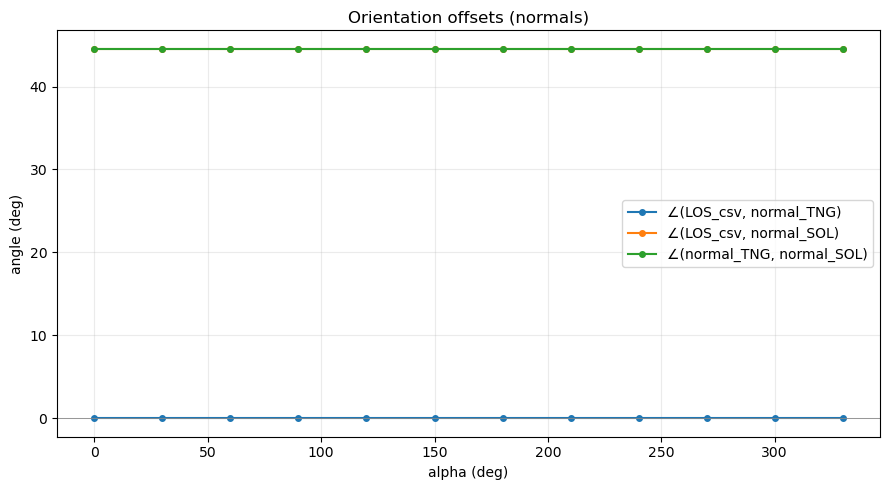

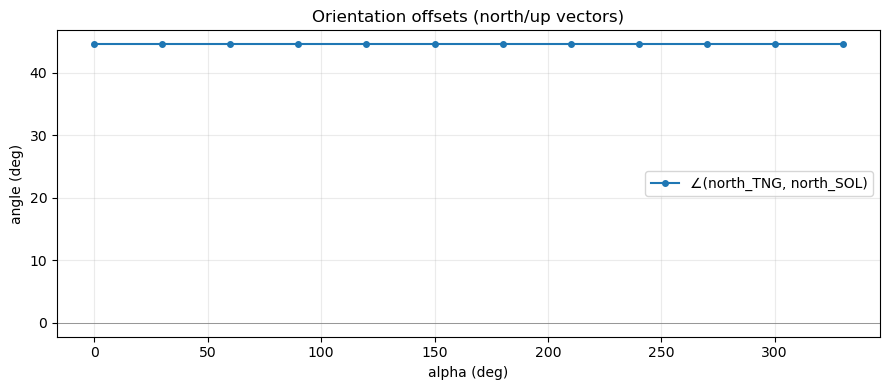


Summary (degrees):
         ang(v_csv, n_TNG)_deg: median= 0.000  max= 0.000
         ang(v_csv, n_SOL)_deg: median=44.552  max=44.552
         ang(n_TNG, n_SOL)_deg: median=44.552  max=44.552
       ang(up_TNG, up_SOL)_deg: median=44.548  max=44.548


In [5]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os, json, h5py, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yt

# ─────────────────────────────────────────
# Paths (edit if needed)
# ─────────────────────────────────────────
DATA_DIR      = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5     = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"
ENDPOINTS_CSV = f"{DATA_DIR}/56372_sightlines/endpoints_sightlines_both_sid563732.csv"
ORIENT_JSON   = f"{DATA_DIR}/56372_sightlines/orient_header_sid563732.json"
OUTDIR        = f"{DATA_DIR}/56372_sightlines/sol_consistency"
os.makedirs(OUTDIR, exist_ok=True)

# Angles to compare
TARGET_ALPHAS = list(range(0, 361, 30))  # 0,30,60,...,360
ATOL_DEG = 1e-6

# ─────────────────────────────────────────
# Small helpers
# ─────────────────────────────────────────
def unit(v):
    v = np.asarray(v, float)
    n = np.linalg.norm(v)
    return v / n if n > 0 else v

def rodrigues_axis_angle(axis, theta_rad):
    a = unit(axis)
    ax, ay, az = a
    c, s, C = np.cos(theta_rad), np.sin(theta_rad), 1.0 - np.cos(theta_rad)
    return np.array([
        [c+ax*ax*C,   ax*ay*C-az*s, ax*az*C+ay*s],
        [ay*ax*C+az*s, c+ay*ay*C,   ay*az*C-ax*s],
        [az*ax*C-ay*s, az*ay*C+ax*s, c+az*az*C  ]
    ], float)

def R_from_u_to_v(u, v):
    u, v = unit(u), unit(v)
    c = float(np.clip(np.dot(u, v), -1.0, 1.0))
    if c > 1-1e-12: return np.eye(3)
    if c < -1+1e-12:
        # 180°: rotate around any axis ⟂ u
        a = unit(np.cross(u, [1,0,0]) if abs(u[0]) < 0.9 else np.cross(u, [0,1,0]))
        return rodrigues_axis_angle(a, math.pi)
    axis = unit(np.cross(u, v))
    return rodrigues_axis_angle(axis, math.acos(c))

def pca3_weighted(X, w):
    X = np.asarray(X, float); w = np.asarray(w, float)
    wsum = np.sum(w)
    xc = np.sum(X * w[:,None], axis=0) / max(wsum, 1e-30)
    X0 = X - xc
    C  = (X0 * w[:,None]).T @ X0 / max(wsum, 1e-30)
    evals, evecs = np.linalg.eigh(C)
    idx = np.argsort(evals)[::-1]
    return evecs[:, idx]  # columns 0,1,2 are major→minor

def read_cutout_center_ckpch(h5_path):
    with h5py.File(h5_path, "r") as f:
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            try:
                sel = json.loads(f["CutoutInfo"].attrs["Selection"])
                if "center_ckpc_h" in sel:
                    return np.array(sel["center_ckpc_h"], float)
            except Exception:
                pass
    return None

def get_p0_p1_from_row(row, prefer_suffix="noflip"):
    cols = {c.lower(): c for c in row.index}
    have_nf = any(c.endswith("_noflip") for c in row.index)
    have_fl = any(c.endswith("_flip")   for c in row.index)
    s = (prefer_suffix or "noflip").lower()
    if s not in {"noflip","flip"}: s = "noflip"
    if s == "noflip" and (not have_nf) and have_fl: s = "flip"
    if s == "flip"   and (not have_fl) and have_nf: s = "noflip"
    if not (have_nf or have_fl): s = None
    def vec(pfx):
        if s is not None:
            X = cols.get(f"{pfx}_x_ckpch_abs_{s}")
            Y = cols.get(f"{pfx}_y_ckpch_abs_{s}")
            Z = cols.get(f"{pfx}_z_ckpch_abs_{s}")
            if X and Y and Z:
                return np.array([row[X], row[Y], row[Z]], float)
        for X,Y,Z in [
            (f"{pfx}_x_ckpch_abs", f"{pfx}_y_ckpch_abs", f"{pfx}_z_ckpch_abs"),
            (f"{pfx}_X_ckpch_abs", f"{pfx}_Y_ckpch_abs", f"{pfx}_Z_ckpch_abs"),
        ]:
            Xc, Yc, Zc = cols.get(X.lower()), cols.get(Y.lower()), cols.get(Z.lower())
            if Xc and Yc and Zc:
                return np.array([row[Xc], row[Yc], row[Zc]], float)
        raise RuntimeError(f"Missing endpoint columns for {pfx}")
    return vec("p0"), vec("p1")

def ang_deg(a, b, signed=False):
    a = unit(a); b = unit(b)
    # Unsigned angle
    th = np.degrees(np.arccos(np.clip(np.dot(a, b), -1.0, 1.0)))
    if not signed:
        return th
    # Signed angle around their cross? (rarely needed)
    s = np.linalg.norm(np.cross(a, b))
    return np.degrees(np.arctan2(s, np.dot(a, b)))

# ─────────────────────────────────────────
# Load data & TNG-side orientation
# ─────────────────────────────────────────
ds = yt.load(CUTOUT_H5)
cut_center_ckpch = read_cutout_center_ckpch(CUTOUT_H5)
center = ds.domain_center if cut_center_ckpch is None else ds.arr(cut_center_ckpch, "code_length")
center_ckpch = center.to("code_length").value

# Try to read h from the dataset (falls back to 0.6774 if missing)
h = None
try:
    h = float(ds.parameters.get("hubble_constant", ds.parameters.get("CosmologyHubbleConstantNow", 0.6774)))
except Exception:
    h = 0.6774

with open(ORIENT_JSON, "r") as fh:
    orient = json.load(fh)

R_base_TNG   = np.array(orient["R_base_noflip"], dtype=float)
v3_hat_TNG   = np.array(orient["v3_hat_native"], dtype=float)
INC_DEG      = float(orient.get("inc_deg", 76.07))
RHO_KPC      = float(orient.get("rho_kpc", 214.0))
PHI_DEG      = float(orient.get("phi_deg", 45.0))
RVIR_KPC     = float(orient.get("Rvir_kpc", 245.0))

# ─────────────────────────────────────────
# Recompute base from SOL cutout stars
# ─────────────────────────────────────────
# Gadget field names: star particles are PartType4
stars = ds.r[("PartType4", "Coordinates")].to("code_length").value  # ckpc/h
try:
    mstars = ds.r[("PartType4", "Masses")].to_value()               # usually 1e10 Msun/h scaled
except Exception:
    # If field missing, fall back to uniform weights
    mstars = np.ones(stars.shape[0], float)

# Recentre around the known cutout center (PBC not needed in small cutout)
X_rel_ckpch = stars - center_ckpch[None, :]
X_rel_kpc   = X_rel_ckpch / h

# PCA (mass weighted)
evecs = pca3_weighted(X_rel_kpc, mstars)  # columns are principal directions
v3_hat_SOL = unit(evecs[:, 2])            # disk normal in native coords

# Build SOL base: face-on map then tilt by INC about +x_obs
def rot_x_deg(theta_deg):
    t = np.radians(theta_deg); c, s = np.cos(t), np.sin(t)
    return np.array([[1,0,0],[0,c,-s],[0,s,c]], float)

R_face_SOL = R_from_u_to_v(v3_hat_SOL, np.array([0,0,1.0]))
R_base_SOL = rot_x_deg(INC_DEG) @ R_face_SOL

# Quick report
print("[INFO] |v3_TNG -/+ v3_SOL| angles (deg):",
      ang_deg(v3_hat_TNG, v3_hat_SOL),
      ang_deg(v3_hat_TNG, -v3_hat_SOL))

# ─────────────────────────────────────────
# Load endpoints & select requested alphas
# ─────────────────────────────────────────
df = pd.read_csv(ENDPOINTS_CSV)
# locate alpha column
alpha_col = None
for cand in ["alpha_deg","alpha","angle_deg","angle","rot","theta"]:
    for cc in df.columns:
        if cc.lower() == cand:
            alpha_col = cc
            break
    if alpha_col: break
if alpha_col is None:
    raise RuntimeError("No alpha/angle column found in CSV.")

aval = pd.to_numeric(df[alpha_col], errors="coerce").values
keep = np.zeros(len(df), dtype=bool)
for t in TARGET_ALPHAS:
    keep |= np.isclose(aval, t, atol=ATOL_DEG)
rows = df.loc[keep].copy().sort_values(alpha_col)
if rows.empty:
    raise RuntimeError("No rows matching requested angles in CSV.")

# Observer basis in screen space (what your maps use)
ez_obs = np.array([0,0,1.0], float)  # “viewing” direction in OBS
ey_obs = np.array([0,1,0.0], float)  # “up” in OBS

# ─────────────────────────────────────────
# Compare per-alpha orientations & LOS from endpoints
# ─────────────────────────────────────────
records = []
for _, rr in rows.iterrows():
    a = float(rr[alpha_col])

    # Endpoints LOS (native coords, from CSV absolute ckpc/h)
    p0, p1 = get_p0_p1_from_row(rr, prefer_suffix="noflip")
    v_csv  = unit(p1 - p0)

    # Predicted normals from TNG and SOL bases for this alpha:
    S_a       = rodrigues_axis_angle(v3_hat_TNG, np.radians(a))
    R_cur_TNG = R_base_TNG @ S_a
    S_a_sol       = rodrigues_axis_angle(v3_hat_SOL, np.radians(a))
    R_cur_SOL     = R_base_SOL @ S_a_sol

    n_TNG   = ez_obs @ R_cur_TNG.T
    up_TNG  = ey_obs @ R_cur_TNG.T
    n_SOL   = ez_obs @ R_cur_SOL.T
    up_SOL  = ey_obs @ R_cur_SOL.T

    # Make normals point in the same half-space as v_csv for fair comparison
    if np.dot(n_TNG, v_csv) < 0: n_TNG = -n_TNG; up_TNG = -up_TNG
    if np.dot(n_SOL, v_csv) < 0: n_SOL = -n_SOL; up_SOL = -up_SOL

    # Angles (deg)
    d_csv_TNG = ang_deg(v_csv, n_TNG)
    d_csv_SOL = ang_deg(v_csv, n_SOL)
    d_TNG_SOL = ang_deg(n_TNG, n_SOL)
    d_up      = ang_deg(up_TNG, up_SOL)

    records.append({
        "alpha_deg": int(round(a)),
        "ang(v_csv, n_TNG)_deg": d_csv_TNG,
        "ang(v_csv, n_SOL)_deg": d_csv_SOL,
        "ang(n_TNG, n_SOL)_deg": d_TNG_SOL,
        "ang(up_TNG, up_SOL)_deg": d_up,
    })

offs = pd.DataFrame.from_records(records).sort_values("alpha_deg")
offs_path = os.path.join(OUTDIR, "orientation_offsets.csv")
offs.to_csv(offs_path, index=False)
print("[OK] wrote:", offs_path)

# ─────────────────────────────────────────
# Plots: offsets vs alpha
# ─────────────────────────────────────────
plt.figure(figsize=(9,5))
plt.plot(offs["alpha_deg"], offs["ang(v_csv, n_TNG)_deg"],  "-o", ms=4, label="∠(LOS_csv, normal_TNG)")
plt.plot(offs["alpha_deg"], offs["ang(v_csv, n_SOL)_deg"],  "-o", ms=4, label="∠(LOS_csv, normal_SOL)")
plt.plot(offs["alpha_deg"], offs["ang(n_TNG, n_SOL)_deg"],  "-o", ms=4, label="∠(normal_TNG, normal_SOL)")
plt.axhline(0, color="#888", lw=0.6)
plt.xlabel("alpha (deg)")
plt.ylabel("angle (deg)")
plt.title("Orientation offsets (normals)")
plt.legend()
plt.grid(alpha=0.25)
plt.tight_layout()
plt.savefig(os.path.join(OUTDIR, "offsets_normals_vs_alpha.png"), dpi=160)
plt.show()

plt.figure(figsize=(9,4))
plt.plot(offs["alpha_deg"], offs["ang(up_TNG, up_SOL)_deg"], "-o", ms=4, label="∠(north_TNG, north_SOL)")
plt.axhline(0, color="#888", lw=0.6)
plt.xlabel("alpha (deg)")
plt.ylabel("angle (deg)")
plt.title("Orientation offsets (north/up vectors)")
plt.legend()
plt.grid(alpha=0.25)
plt.tight_layout()
plt.savefig(os.path.join(OUTDIR, "offsets_north_vs_alpha.png"), dpi=160)
plt.show()

# Summary on console
print("\nSummary (degrees):")
for col in ["ang(v_csv, n_TNG)_deg", "ang(v_csv, n_SOL)_deg", "ang(n_TNG, n_SOL)_deg", "ang(up_TNG, up_SOL)_deg"]:
    vals = offs[col].values
    print(f"  {col:>28s}: median={np.nanmedian(vals):6.3f}  max={np.nanmax(vals):6.3f}")

In [7]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Build velocity-map-compatible orientations and sightline endpoints
**using only the SOL cutout** (no groupcats). Also make debug plots.

Outputs (under OUTROOT):
  - endpoints_sightlines_both_sid<SID>.csv
  - orient_peralpha_sid<SID>.csv
  - orient_header_sid<SID>.json
  - debug/*.png  (per-angle gas mass maps + contact sheet)
"""

import os, sys, math, json, traceback
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import h5py

# =========================
# USER CONFIG
# =========================
DATA_DIR   = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5  = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"

# IDs / constants (purely for filenames/meta)
SNAP       = 99
SID        = 563732

# Observed geometry (same as TNG-side)
INC_DEG    = 76.07
RHO_KPC    = 214.0
PHI_DEG    = 45.0
R_VIR_KPC  = 245.0

# Sweep (we still compute full 0..359 for products; debug plots sparse)
ALPHAS_DEG   = list(range(0, 360, 1))
DEBUG_ALPHAS = list(range(0, 360, 30))   # 0,30,60,...

# LOS length = 3 Rvir ⇒ endpoints at ±1.5 Rvir
RAY_HALF_LENGTH_KPC = 1.5 * R_VIR_KPC

# Output dirs
OUTROOT  = os.path.join(DATA_DIR, f"56372_sightlines_SOL_from_cutout_sid{SID}_snap{SNAP}")
DBG_DIR  = os.path.join(OUTROOT, "debug")
os.makedirs(OUTROOT, exist_ok=True)
os.makedirs(DBG_DIR, exist_ok=True)

# Debug plot settings
FOV_KPC = 300.0     # field of view half-size for debug maps (±FOV_KPC)
NBIN    = 700       # histogram bins per axis
DEBUG_USE_GAS_FOR_IMAGES = True  # images from gas; disk normal from stars (matches “use gas for debug plots” request)

mpl.rcParams.update({
    "figure.dpi": 140, "savefig.dpi": 240,
    "figure.facecolor": "#0f111a", "axes.facecolor": "#0f111a", "savefig.facecolor": "#0f111a",
    "axes.edgecolor": "#eaeaea", "axes.labelcolor": "#eaeaea",
    "xtick.color": "#eaeaea", "ytick.color": "#eaeaea",
    "text.color": "#eaeaea", "axes.grid": False, "font.size": 11,
})

# ===== math helpers =====
def unit(v):
    v = np.asarray(v, float); n = np.linalg.norm(v)
    return v / n if n > 0 else v

def rodrigues_axis_angle(axis, theta):
    a = unit(axis); ax, ay, az = a
    c, s = math.cos(theta), math.sin(theta); C = 1 - c
    return np.array([
        [c+ax*ax*C,   ax*ay*C-az*s, ax*az*C+ay*s],
        [ay*ax*C+az*s, c+ay*ay*C,   ay*az*C-ax*s],
        [az*ax*C-ay*s, az*ay*C+ax*s, c+az*az*C  ]
    ], float)

def R_from_u_to_v(u, v):
    u, v = unit(u), unit(v)
    c = float(np.clip(np.dot(u, v), -1.0, 1.0))
    if c > 1 - 1e-12: return np.eye(3)
    if c < -1 + 1e-12:
        a = unit(np.cross(u, [1,0,0]) if abs(u[0]) < 0.9 else np.cross(u, [0,1,0]))
        return rodrigues_axis_angle(a, math.pi)
    axis = unit(np.cross(u, v))
    return rodrigues_axis_angle(axis, math.acos(c))

def rot_x(theta_deg):
    t = np.radians(theta_deg); c, s = np.cos(t), np.sin(t)
    return np.array([[1,0,0],[0,c,-s],[0,s,c]], float)

# ===== PBC helpers =====
def minimal_image_delta(dpos, box): return (dpos + 0.5*box) % box - 0.5*box
def recenter_positions(x, cen, box): return minimal_image_delta(x - cen[None,:], box)

# ===== PCA =====
def pca3_weighted(X, w):
    X = np.asarray(X, float); w = np.asarray(w, float)
    wsum = np.sum(w); xc = np.sum(X*w[:,None], axis=0) / max(wsum, 1e-30)
    X0 = X - xc
    C = (X0*w[:,None]).T @ X0 / max(wsum, 1e-30)
    evals, evecs = np.linalg.eigh(C)
    idx = np.argsort(evals)[::-1]
    return evals[idx], evecs[:, idx], xc

def build_R_bases_and_normal(Xs_ckpch_rel, Ms_1e10Msun_h, h, inc_deg):
    """
    Stars-based disk normal v3_hat; bases for noflip/flip;
    return also stars in kpc and masses in Msun for plotting weights.
    """
    Xs_kpc = Xs_ckpch_rel / h
    Ms_msun = Ms_1e10Msun_h * 1e10 / h  # TNG mass units: 1e10 Msun/h
    _, evecs3, _ = pca3_weighted(Xs_kpc, Ms_msun)
    v3_hat = unit(evecs3[:,2])

    R_face_noflip = R_from_u_to_v(v3_hat, np.array([0,0,1.0]))
    R_base_noflip = rot_x(inc_deg) @ R_face_noflip

    R_face_flip = R_from_u_to_v(-v3_hat, np.array([0,0,1.0]))
    R_base_flip = rot_x(inc_deg) @ R_face_flip

    return R_base_noflip, R_base_flip, v3_hat, -v3_hat, Xs_kpc, Ms_msun

# ===== LOS endpoints in native coords =====
def sightline_endpoints_native(center_kpc, R_cur, rho_kpc, phi_deg, half_len_kpc):
    x = rho_kpc * math.cos(math.radians(phi_deg))
    y = rho_kpc * math.sin(math.radians(phi_deg))
    r_obs = np.array([x, y, 0.0], float)
    zhat  = np.array([0.0, 0.0, 1.0], float)
    r_nat = r_obs @ R_cur.T
    L_nat = unit(zhat @ R_cur.T)
    p0_kpc = center_kpc + r_nat - half_len_kpc * L_nat
    p1_kpc = center_kpc + r_nat + half_len_kpc * L_nat
    return p0_kpc, p1_kpc, r_nat, L_nat

def to_code_length_and_wrap(p_kpc, h, box):
    p_ckpch = (p_kpc * h) % box
    return p_ckpch

# ===== Debug plotting =====
def make_mass_map(X_kpc_obs, M_msun, fov_kpc=FOV_KPC, nbin=NBIN):
    R = float(fov_kpc)
    H, xedges, yedges = np.histogram2d(
        X_kpc_obs[:,0], X_kpc_obs[:,1], bins=nbin,
        range=[[-R,R],[-R,R]], weights=M_msun
    )
    extent = [-R, R, -R, R]
    return np.log10(H.T + 1e-12), extent

def draw_debug_panel(ax, img, extent, *, title, inc_deg, rho_kpc, phi_deg,
                     rhalf_star_kpc, normal_xy):
    ax.imshow(img, origin="lower", extent=extent, cmap="magma", vmin=2.0, vmax=8.0)
    ax.set_aspect("equal")
    ax.set_xlabel("x_obs [kpc]"); ax.set_ylabel("y_obs [kpc]")
    ax.set_title(title)

    R = extent[1]
    ax.plot([-R, R],[0,0], color="#99999955", lw=0.8, ls="--")
    ax.plot([0,0],[-R, R], color="#99999955", lw=0.8, ls="--")

    a = 3.0 * rhalf_star_kpc
    b = a * math.cos(math.radians(inc_deg))
    ax.add_patch(Ellipse((0,0), 2*a, 2*b, edgecolor="#00d1b2", facecolor="none", lw=2.0, zorder=6))

    n_xy = np.array(normal_xy[:2], float)
    if np.linalg.norm(n_xy) > 0:
        n_xy_hat = n_xy / np.linalg.norm(n_xy)
        L = a * math.sin(math.radians(inc_deg))
        ax.arrow(0,0, L*n_xy_hat[0], L*n_xy_hat[1], color="#ffb000", lw=2.2,
                 head_width=0.05*a, head_length=0.08*a, zorder=7)
        ax.text(L*n_xy_hat[0]*1.05, L*n_xy_hat[1]*1.05, "normal", color="#ffb000", fontsize=9)

    x_sl = rho_kpc * math.cos(math.radians(phi_deg))
    y_sl = rho_kpc * math.sin(math.radians(phi_deg))
    ax.scatter(x_sl, y_sl, s=150, marker="*", c="#00e5ff", edgecolor="#ff3d57",
               linewidths=0.9, zorder=8)
    ax.text(x_sl+8, y_sl+8, "sightline", color="#ff5f78", fontsize=9)

    ax.set_xlim(extent[0], extent[1]); ax.set_ylim(extent[2], extent[3])

# ===== HDF5 readers (cutout) =====
def read_header_and_center(h5_path):
    with h5py.File(h5_path, "r") as f:
        hdr = f["Header"].attrs
        h        = float(hdr["HubbleParam"])
        box_ckph = float(hdr["BoxSize"])     # ckpc/h
        # expansion factor (Time)
        a        = float(hdr.get("Time", 1.0))
        # cutout center (ckpc/h) if present
        center = None
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            try:
                sel = json.loads(f["CutoutInfo"].attrs["Selection"])
                if "center_ckpc_h" in sel:
                    center = np.array(sel["center_ckpc_h"], float)
            except Exception:
                pass
    return h, box_ckph, a, center

def read_pt_data(f, ptype, fields):
    grp = f.get(f"/{ptype}")
    if grp is None:
        return {fld: None for fld in fields}
    out = {}
    for fld in fields:
        ds = grp.get(fld)
        out[fld] = None if ds is None else np.asarray(ds[...], dtype=np.float64)
    return out

def load_particles_from_cutout(h5_path):
    with h5py.File(h5_path, "r") as f:
        stars = read_pt_data(f, "PartType4", ["Coordinates","Masses"])
        gas   = read_pt_data(f, "PartType0", ["Coordinates","Masses"])
    return stars, gas

# =========================
# Main
# =========================
def main():
    print(f"[INFO] Reading cutout: {CUTOUT_H5}")
    h, box_ckpch, a, center_ckpch_attr = read_header_and_center(CUTOUT_H5)
    print(f"[OK] h={h:.6f}  BoxSize={box_ckpch:.1f} ckpc/h  a={a:.6f}")

    stars, gas = load_particles_from_cutout(CUTOUT_H5)
    if stars["Coordinates"] is None or stars["Masses"] is None:
        raise RuntimeError("Cutout missing stars (PartType4) coords/masses.")
    if gas["Coordinates"] is None or gas["Masses"] is None:
        print("[WARN] Cutout missing gas fields; debug maps will use stars.")

    # center from cutout metadata or fallback to star CoM (PBC-aware)
    if center_ckpch_attr is None:
        print("[WARN] No center_ckpc_h in cutout; estimating from stellar CoM (PBC-aware).")
        # naive unwrapping fallback for CoM (OK for small cutouts)
        center_ckpch = np.mean(stars["Coordinates"], axis=0)
    else:
        center_ckpch = center_ckpch_attr

    center_kpc = center_ckpch / h

    # recenter stars (for PCA)
    Xs_ckpch = np.asarray(stars["Coordinates"], float)
    Ms_1e10  = np.asarray(stars["Masses"], float)
    Xs_rel_ckpch = recenter_positions(Xs_ckpch, center_ckpch, box_ckpch)

    # Build observer bases from **stars** (to match velocity-map convention)
    (R_base_noflip, R_base_flip,
     v3_hat, v3_hat_flip,
     Xs_kpc, Ms_msun) = build_R_bases_and_normal(Xs_rel_ckpch, Ms_1e10, h, INC_DEG)

    # (optional) load gas for debug images
    if DEBUG_USE_GAS_FOR_IMAGES and gas["Coordinates"] is not None and gas["Masses"] is not None:
        Xg_ckpch = np.asarray(gas["Coordinates"], float)
        Mg_1e10  = np.asarray(gas["Masses"], float)
        Xg_rel_ckpch = recenter_positions(Xg_ckpch, center_ckpch, box_ckpch)
        Ximg_kpc = Xg_rel_ckpch / h
        Wimg_msun= Mg_1e10 * 1e10 / h
        debug_label = "Gas"
    else:
        Ximg_kpc = Xs_kpc
        Wimg_msun= Ms_msun
        debug_label = "Stars"

    # Stellar half-mass radius: approximate from projected percentiles
    # (we don’t have Subfind halfmass in the cutout; simple proxy)
    rhalf_star_kpc = np.sqrt(np.median(np.sum((Xs_kpc - np.mean(Xs_kpc,0))**2, axis=1))) * 0.5

    rows = []
    rows_orient = []
    debug_paths = []

    yhat_obs = np.array([0.0, 1.0, 0.0])
    zhat_obs = np.array([0.0, 0.0, 1.0])

    for alpha in ALPHAS_DEG:
        S_nf = rodrigues_axis_angle(v3_hat,      math.radians(alpha))
        S_fl = rodrigues_axis_angle(v3_hat_flip, math.radians(alpha))

        R_nf = R_base_noflip @ S_nf
        R_fl = R_base_flip   @ S_fl

        # Endpoints (native->absolute, in kpc)
        p0_nf_kpc, p1_nf_kpc, _, L_nf = sightline_endpoints_native(
            center_kpc, R_nf, RHO_KPC, PHI_DEG, RAY_HALF_LENGTH_KPC
        )
        p0_fl_kpc, p1_fl_kpc, _, L_fl = sightline_endpoints_native(
            center_kpc, R_fl, RHO_KPC, PHI_DEG, RAY_HALF_LENGTH_KPC
        )

        # to code_length (ckpc/h) + wrap to [0, BoxSize)
        p0_nf = to_code_length_and_wrap(p0_nf_kpc, h, box_ckpch)
        p1_nf = to_code_length_and_wrap(p1_nf_kpc, h, box_ckpch)
        p0_fl = to_code_length_and_wrap(p0_fl_kpc, h, box_ckpch)
        p1_fl = to_code_length_and_wrap(p1_fl_kpc, h, box_ckpch)

        rows.append({
            "SubhaloID": SID,
            "alpha_deg": alpha,
            "inc_deg": INC_DEG,
            "rho_kpc": RHO_KPC,
            "phi_deg": PHI_DEG,
            "Rvir_kpc": R_VIR_KPC,

            "p0_X_ckpch_abs_noflip": p0_nf[0],
            "p0_Y_ckpch_abs_noflip": p0_nf[1],
            "p0_Z_ckpch_abs_noflip": p0_nf[2],
            "p1_X_ckpch_abs_noflip": p1_nf[0],
            "p1_Y_ckpch_abs_noflip": p1_nf[1],
            "p1_Z_ckpch_abs_noflip": p1_nf[2],
            "los_dir_x_noflip": L_nf[0], "los_dir_y_noflip": L_nf[1], "los_dir_z_noflip": L_nf[2],

            "p0_X_ckpch_abs_flip": p0_fl[0],
            "p0_Y_ckpch_abs_flip": p0_fl[1],
            "p0_Z_ckpch_abs_flip": p0_fl[2],
            "p1_X_ckpch_abs_flip": p1_fl[0],
            "p1_Y_ckpch_abs_flip": p1_fl[1],
            "p1_Z_ckpch_abs_flip": p1_fl[2],
            "los_dir_x_flip": L_fl[0], "los_dir_y_flip": L_fl[1], "los_dir_z_flip": L_fl[2],
        })

        # Observer-frame basis mapped back to native (for yt off-axis)
        native_LOS_nf   = unit(zhat_obs @ R_nf.T)
        native_north_nf = unit(yhat_obs @ R_nf.T)
        native_LOS_fl   = unit(zhat_obs @ R_fl.T)
        native_north_fl = unit(yhat_obs @ R_fl.T)

        rows_orient.append({
            "alpha_deg": alpha,
            "los_x_noflip":   native_LOS_nf[0],
            "los_y_noflip":   native_LOS_nf[1],
            "los_z_noflip":   native_LOS_nf[2],
            "north_x_noflip": native_north_nf[0],
            "north_y_noflip": native_north_nf[1],
            "north_z_noflip": native_north_nf[2],
            "los_x_flip":     native_LOS_fl[0],
            "los_y_flip":     native_LOS_fl[1],
            "los_z_flip":     native_LOS_fl[2],
            "north_x_flip":   native_north_fl[0],
            "north_y_flip":   native_north_fl[1],
            "north_z_flip":   native_north_fl[2],
        })

        # ---- Debug image for selected alphas (use gas (preferred) or stars) ----
        if alpha in DEBUG_ALPHAS:
            X_obs = (Ximg_kpc @ R_nf.T)
            img, extent = make_mass_map(X_obs, Wimg_msun, fov_kpc=FOV_KPC, nbin=NBIN)
            n_obs = v3_hat @ R_nf.T
            fig = plt.figure(figsize=(6.4, 6.0))
            ax  = fig.add_subplot(111)
            draw_debug_panel(
                ax, img, extent,
                title=f"Debug {debug_label} (unflipped)  α={alpha:03d}°",
                inc_deg=INC_DEG, rho_kpc=RHO_KPC, phi_deg=PHI_DEG,
                rhalf_star_kpc=rhalf_star_kpc, normal_xy=n_obs
            )
            dbg_path = os.path.join(DBG_DIR, f"dbg_unflipped_alpha{alpha:03d}.png")
            plt.savefig(dbg_path, bbox_inches="tight")
            plt.close(fig)
            debug_paths.append(dbg_path)

        if alpha % 45 == 0:
            print(f"[ROW] alpha={alpha:03d} added")

    # === Save endpoints CSV ===
    csv_path = os.path.join(OUTROOT, f"endpoints_sightlines_both_sid{SID}.csv")
    pd.DataFrame(rows).to_csv(csv_path, index=False)
    print(f"[OK] wrote CSV: {csv_path}")

    # === Save orientations per alpha ===
    orient_csv = os.path.join(OUTROOT, f"orient_peralpha_sid{SID}.csv")
    pd.DataFrame(rows_orient).to_csv(orient_csv, index=False)
    print(f"[OK] wrote per-alpha orientation CSV: {orient_csv}")

    # === Save header JSON (matrices & constants) ===
    header_json = os.path.join(OUTROOT, f"orient_header_sid{SID}.json")
    header = {
        "SID": SID, "SNAP": SNAP,
        "inc_deg": INC_DEG, "rho_kpc": RHO_KPC, "phi_deg": PHI_DEG, "Rvir_kpc": R_VIR_KPC,
        "R_base_noflip": R_base_noflip.tolist(),
        "R_base_flip":   R_base_flip.tolist(),
        "v3_hat_native": v3_hat.tolist(),
        "v3_hat_native_flip": v3_hat_flip.tolist(),
        "center_ckpc_h": center_ckpch.tolist(),
        "BoxSize_ckpc_h": box_ckpch,
        "a": a, "h": h
    }
    with open(header_json, "w") as f:
        json.dump(header, f, indent=2)
    print(f"[OK] wrote orientation header JSON: {header_json}")

    # === Contact sheet for debug panels ===
    if len(DEBUG_ALPHAS) > 0:
        figs = [os.path.join(DBG_DIR, f"dbg_unflipped_alpha{a:03d}.png") for a in DEBUG_ALPHAS]
        ncol = 6
        nrow = int(np.ceil(len(figs) / ncol))
        fig, axes = plt.subplots(nrow, ncol, figsize=(1.9*ncol, 1.9*nrow), squeeze=False)
        for i, ap in enumerate(figs):
            r, c = divmod(i, ncol)
            ax = axes[r, c]
            if os.path.exists(ap):
                img = plt.imread(ap); ax.imshow(img)
            ax.axis("off")
        for j in range(len(figs), nrow*ncol):
            r, c = divmod(j, ncol); axes[r, c].axis("off")
        sheet = os.path.join(DBG_DIR, "debug_contact_sheet.png")
        plt.tight_layout(pad=0.05)
        plt.savefig(sheet, dpi=180)
        plt.close(fig)
        print(f"[OK] contact sheet: {sheet}")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print("[FATAL]", e)
        traceback.print_exc()
        sys.exit(1)

[INFO] Reading cutout: /scratch/tsingh65/TNG50-1_snap99/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5
[OK] h=0.677400  BoxSize=35000.0 ckpc/h  a=1.000000
[ROW] alpha=000 added
[ROW] alpha=045 added
[ROW] alpha=090 added
[ROW] alpha=135 added
[ROW] alpha=180 added
[ROW] alpha=225 added
[ROW] alpha=270 added
[ROW] alpha=315 added
[OK] wrote CSV: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines_SOL_from_cutout_sid563732_snap99/endpoints_sightlines_both_sid563732.csv
[OK] wrote per-alpha orientation CSV: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines_SOL_from_cutout_sid563732_snap99/orient_peralpha_sid563732.csv
[OK] wrote orientation header JSON: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines_SOL_from_cutout_sid563732_snap99/orient_header_sid563732.json
[OK] contact sheet: /scratch/tsingh65/TNG50-1_snap99/56372_sightlines_SOL_from_cutout_sid563732_snap99/debug/debug_contact_sheet.png


[INFO] Reading cutout: /scratch/tsingh65/TNG50-1_snap99/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5
[OK] h=0.677400  BoxSize=35000.0 ckpc/h  a=1.000000
[INFO] Aperture cut: rhalf*10.0 = 36.3 ckpc/h
[INFO] sid=563732 | N*=635900 | N_gas=169358
  Stellar spin J* = [ -455.56965745  1166.6124322  -1326.22587223]  | inc_*=43.36°, PA_*=21.33°
  ∠(J_*, v3_PCA)  = 174.75°
  PCA 2D major angle (XY) = 17.25°


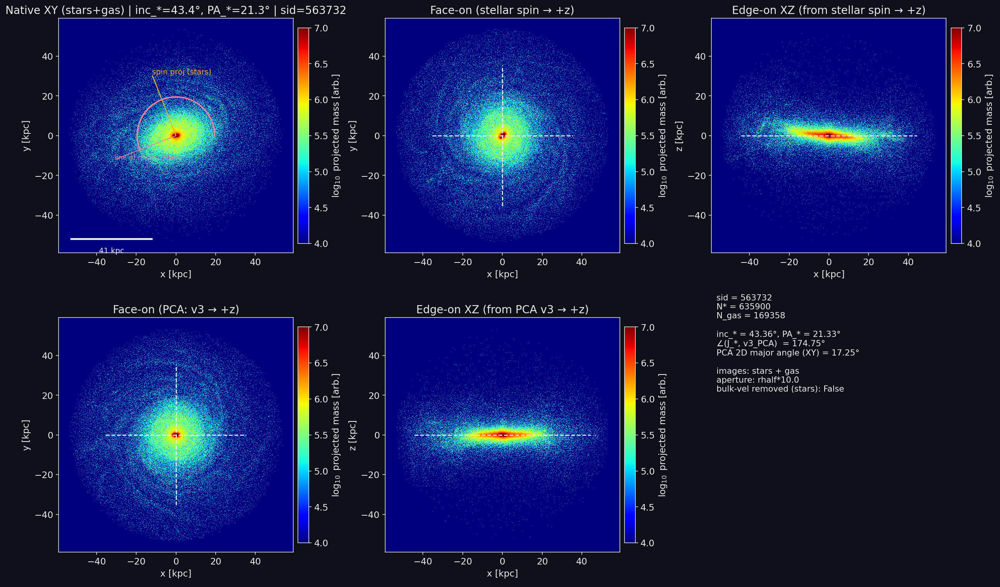

[SAVED] tng_orientation_checks_debug/debug_from_cutout_sid563732_snap99.png


In [9]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

"""
SOL debug: orientations from STARS only; images from STARS+GAS (combined).

- Reads a single TNG cutout HDF5 (no illustris_python needed).
- Orientation estimators (stars only):
    * Stellar spin J_star
    * PCA 3D minor axis v3  (disk normal)
- Aperture based on stellar half-mass radius (optional); applied to both stars and gas.
- All maps (native, face-on, edge-on) are built from the COMBINED particle set (stars + gas).
- Layout: 2 rows × 3 cols -> [Native XY | Face-on (J*) | Edge-on XZ (J*)]
                                   [Face-on (v3) | Edge-on XZ (v3) | Diagnostics]
"""

import os, json, math, h5py
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# =========================
# USER CONFIG
# =========================
DATA_DIR  = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5 = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"

snap      = 99
sid       = 563732

# aperture cut relative to stellar half-mass radius (computed from cutout)
use_rhalf_aperture = True
rhalf_multiplier   = 10.0

# set True to subtract stellar bulk velocity before spin calc
REMOVE_BULK_VEL = False

# field-of-view width (kpc/h); converted to kpc using h
extent_kpc_h = 80.0
nbin         = 1200

# figure / style
dpi_out        = 120
cmap_name      = "jet"           # match your reference
bg_color       = "#0f111a"
fg_color       = "#eaeaea"
spin_star_color= "#ffb000"       # orange (stellar spin)
nodes_color    = "#f37ea1"       # magenta (line of nodes / PA arc)
axes_guide     = "#eaeaea"
scalebar_color = "#eaeaea"
VMIN = 4.0
VMAX = 7.0

mpl.rcParams.update({
    "figure.facecolor": bg_color, "axes.facecolor": bg_color, "savefig.facecolor": bg_color,
    "axes.edgecolor": fg_color, "axes.labelcolor": fg_color, "xtick.color": fg_color,
    "ytick.color": fg_color, "text.color": fg_color, "font.family": "DejaVu Sans", "font.size": 12,
})

# =========================
# Helpers
# =========================
def unit(v):
    v = np.asarray(v, float)
    n = np.linalg.norm(v)
    return v / n if n > 0 else v

def minimal_image_delta(dpos, box): 
    return (dpos + 0.5*box) % box - 0.5*box

def recenter_positions(x, center, box): 
    return minimal_image_delta(x - center[None,:], box)

def rodrigues_u_to_v(u, v):
    """Active rotation mapping u -> v; returns R so that R @ u == v."""
    u = unit(u); v = unit(v)
    c = float(np.clip(np.dot(u, v), -1.0, 1.0))
    if c > 1 - 1e-12:
        return np.eye(3)
    if c < -1 + 1e-12:
        a = unit(np.cross(u, [1,0,0]) if abs(u[0]) < 0.9 else np.cross(u, [0,1,0]))
        K = np.array([[0,-a[2],a[1]],[a[2],0,-a[0]],[-a[1],a[0],0]])
        return np.eye(3) + 2*(K @ K)    # π-rotation
    a = np.cross(u, v); s = float(np.linalg.norm(a))
    a = a / s
    K = np.array([[0,-a[2],a[1]],[a[2],0,-a[0]],[-a[1],a[0],0]])
    return np.eye(3) + K*s + (K @ K)*(1 - c)

def inc_PA_from_vector(J):
    """
    inc (deg): inclination wrt +z (0 face-on, 90 edge-on), uses |cos|.
    PA  (deg): position angle of line of nodes (z × J) in [0,180), from +x.
    """
    J = np.asarray(J, float); Jn = np.linalg.norm(J)
    if Jn == 0: return np.nan, np.nan
    Jhat = J / Jn
    inc = np.degrees(np.arccos(np.clip(abs(Jhat[2]), 0, 1)))
    n = np.cross([0,0,1.0], Jhat)
    PA = 0.0 if np.hypot(n[0], n[1]) < 1e-14 else (np.degrees(np.arctan2(n[1], n[0])) % 180.0)
    return inc, PA

def pca3_weighted(X, w):
    """Mass-weighted 3D PCA. Return eigvals(desc), eigvecs(cols), and COM."""
    X = np.asarray(X, float); w = np.asarray(w, float)
    wsum = np.sum(w); xc = np.sum(X*w[:,None], axis=0) / max(wsum, 1e-30)
    X0 = X - xc
    C = (X0*w[:,None]).T @ X0 / max(wsum, 1e-30)
    evals, evecs = np.linalg.eigh(C)
    idx = np.argsort(evals)[::-1]
    return evals[idx], evecs[:, idx], xc

def pca2_weighted(XY, w):
    """Mass-weighted 2D PCA on projected coords; return major-axis unit vector and angle (deg)."""
    XY = np.asarray(XY, float); w = np.asarray(w, float)
    wsum = np.sum(w); xc = np.sum(XY*w[:,None], axis=0) / max(wsum, 1e-30)
    X0 = XY - xc
    C = (X0*w[:,None]).T @ X0 / max(wsum, 1e-30)
    evals, evecs = np.linalg.eigh(C)
    maj = unit(evecs[:, np.argmax(evals)])
    ang = (np.degrees(np.arctan2(maj[1], maj[0])) % 180.0)
    return maj, ang

def mass_map_arbitrary(M_weights, XY_kpc, half_width_kpc, nbin):
    """Projected-mass map in ARBITRARY units (sum of weights per pixel)."""
    L = half_width_kpc
    x = np.clip(XY_kpc[:,0], -L, L); y = np.clip(XY_kpc[:,1], -L, L)
    H, xe, ye = np.histogram2d(x, y, bins=nbin, range=[[-L,L],[-L,L]], weights=M_weights)
    return H.T, xe, ye, (2*L)/nbin

def rms_z(arr_xz):
    z = arr_xz[:,2]
    return float(np.sqrt(np.mean((z - np.mean(z))**2)))

# =========================
# Load from cutout
# =========================
def read_header_and_center(h5_path):
    with h5py.File(h5_path, "r") as f:
        hdr = f["Header"].attrs
        h        = float(hdr["HubbleParam"])
        box_ckph = float(hdr["BoxSize"])
        a        = float(hdr.get("Time", 1.0))
        center = None
        if "CutoutInfo" in f and "Selection" in f["CutoutInfo"].attrs:
            try:
                sel = json.loads(f["CutoutInfo"].attrs["Selection"])
                if "center_ckpc_h" in sel:
                    center = np.array(sel["center_ckpc_h"], float)
            except Exception:
                pass
    return h, box_ckph, a, center

def read_pt_data(f, ptype, fields):
    grp = f.get(f"/{ptype}")
    if grp is None:
        return {fld: None for fld in fields}
    out = {}
    for fld in fields:
        ds = grp.get(fld)
        out[fld] = None if ds is None else np.asarray(ds[...], dtype=np.float64)
    return out

def load_particles_from_cutout(h5_path):
    with h5py.File(h5_path, "r") as f:
        stars = read_pt_data(f, "PartType4", ["Coordinates","Masses","Velocities"])
        gas   = read_pt_data(f, "PartType0", ["Coordinates","Masses"])  # velocities not needed for images
    return stars, gas

# =========================
# Main
# =========================
def main():
    print(f"[INFO] Reading cutout: {CUTOUT_H5}")
    h, box_ckpch, a, center_ckpch_attr = read_header_and_center(CUTOUT_H5)
    print(f"[OK] h={h:.6f}  BoxSize={box_ckpch:.1f} ckpc/h  a={a:.6f}")

    stars, gas = load_particles_from_cutout(CUTOUT_H5)
    if stars["Coordinates"] is None or stars["Masses"] is None or stars["Velocities"] is None:
        raise RuntimeError("Cutout missing stars (PartType4) coords/masses/velocities.")

    # center: prefer cutout metadata; else fallback to stellar mean (approx).
    if center_ckpch_attr is None:
        print("[WARN] No center_ckpc_h in cutout; estimating from stellar mean (approx).")
        center_ckpch = np.mean(stars["Coordinates"], axis=0)
    else:
        center_ckpch = center_ckpch_attr

    # --- stars (for orientation + maps) ---
    Xs_ckpch = np.asarray(stars["Coordinates"], float)
    Ms_1e10  = np.asarray(stars["Masses"], float)
    Vs_kms   = np.asarray(stars["Velocities"], float)   # orientation only

    Xs_rel_ckpch = recenter_positions(Xs_ckpch, center_ckpch, box_ckpch)

    if REMOVE_BULK_VEL:
        vcm_star = (np.sum(Vs_kms * Ms_1e10[:,None], axis=0) / np.sum(Ms_1e10))
        Vs_rel = Vs_kms - vcm_star[None,:]
    else:
        Vs_rel = Vs_kms

    J_star = np.sum(np.cross(Xs_rel_ckpch, Vs_rel) * Ms_1e10[:,None], axis=0)

    # --- gas (for maps only; combine with stars) ---
    have_gas = gas["Coordinates"] is not None and gas["Masses"] is not None
    if have_gas:
        Xg_ckpch = np.asarray(gas["Coordinates"], float)
        Mg_1e10  = np.asarray(gas["Masses"], float)
        Xg_rel_ckpch = recenter_positions(Xg_ckpch, center_ckpch, box_ckpch)
    else:
        Xg_rel_ckpch = np.empty((0,3), float)
        Mg_1e10      = np.empty((0,), float)

    # --- aperture using stellar half-mass radius (from cutout) ---
    Rs = np.linalg.norm(Xs_rel_ckpch, axis=1)
    order = np.argsort(Rs)
    cumM  = np.cumsum(Ms_1e10[order])
    rhalf_star_ckpch = Rs[order][np.searchsorted(cumM, 0.5*cumM[-1])]
    if use_rhalf_aperture and rhalf_star_ckpch > 0:
        Rcut = rhalf_multiplier * rhalf_star_ckpch
        selS = (Rs <= Rcut)
        Xs_rel_ckpch, Ms_1e10, Vs_rel = Xs_rel_ckpch[selS], Ms_1e10[selS], Vs_rel[selS]

        if have_gas:
            Rg = np.linalg.norm(Xg_rel_ckpch, axis=1)
            selG = (Rg <= Rcut)
            Xg_rel_ckpch, Mg_1e10 = Xg_rel_ckpch[selG], Mg_1e10[selG]
        print(f"[INFO] Aperture cut: rhalf*{rhalf_multiplier:.1f} = {Rcut:.1f} ckpc/h")

    # stars-only units (for orientation printouts)
    Xs_kpc = Xs_rel_ckpch / h
    Ms_msun= Ms_1e10 * 1e10 / h

    # COMBINED coords + weights for all images
    Ximg_kpc = np.vstack([Xs_rel_ckpch / h, Xg_rel_ckpch / h]) if have_gas else (Xs_rel_ckpch / h)
    Wimg_msun= np.concatenate([Ms_msun, (Mg_1e10 * 1e10 / h)]) if have_gas else Ms_msun
    N_star   = len(Ms_msun)
    N_gas    = 0 if not have_gas else len(Mg_1e10)

    # PCA v3 from stars
    evals3, evecs3, _ = pca3_weighted(Xs_kpc, Ms_msun)
    v3_hat = unit(evecs3[:,2])

    # Angles & PA diagnostics (stars only)
    def ang(a,b): a=unit(a); b=unit(b); return np.degrees(np.arccos(np.clip(np.dot(a,b), -1, 1)))
    inc_s, PA_s = inc_PA_from_vector(J_star)
    maj2_xy, ang2_xy = pca2_weighted(Xs_kpc[:,[0,1]], Ms_msun)

    print(f"[INFO] sid={sid} | N*={N_star} | N_gas={N_gas}")
    print(f"  Stellar spin J* = {J_star}  | inc_*={inc_s:.2f}°, PA_*={PA_s:.2f}°")
    print(f"  ∠(J_*, v3_PCA)  = {ang(J_star, v3_hat):.2f}°")
    print(f"  PCA 2D major angle (XY) = {ang2_xy:.2f}°")

    # =========================
    # Build maps (native, face-on, edge-on) from COMBINED particles
    # =========================
    L_kpc = (extent_kpc_h / 2.0) / h

    # Native XY (no rotation)
    H_native, _, _, pix_native = mass_map_arbitrary(Wimg_msun, Ximg_kpc[:,[0,1]], L_kpc, nbin)

    # Rotations to face-on for each estimator (ESTIMATORS FROM STARS ONLY)
    R_face_star = rodrigues_u_to_v(unit(J_star), np.array([0,0,1.0]))
    X_face_star = (Ximg_kpc @ R_face_star.T)
    H_face_star, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_star[:,[0,1]], L_kpc, nbin)
    H_edge_star, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_star[:,[0,2]], L_kpc, nbin)

    R_face_pca  = rodrigues_u_to_v(v3_hat, np.array([0,0,1.0]))
    X_face_pca  = (Ximg_kpc @ R_face_pca.T)
    H_face_pca, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_pca[:,[0,1]], L_kpc, nbin)
    H_edge_pca, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_pca[:,[0,2]], L_kpc, nbin)

    # =========================
    # Annotations in native panel (stars-only)
    # =========================
    J_s_hat = unit(J_star)
    Jstar_xy = unit([J_s_hat[0], J_s_hat[1]])

    n_str = np.cross([0,0,1.0], J_s_hat)  # line of nodes (stellar)
    n_str_xy = unit([n_str[0], n_str[1]]) if np.linalg.norm(n_str[:2])>0 else np.array([1.0,0.0])
    PA_draw_str = (np.degrees(np.arctan2(n_str_xy[1], n_str_xy[0])) % 360.0)

    # =========================
    # Plot (2 rows x 3 cols)
    # =========================
    fig, axs = plt.subplots(2, 3, figsize=(18, 11), constrained_layout=True)

    def show_map(ax, H, title, xlabel="x [kpc]", ylabel="y [kpc]"):
        im = ax.imshow(np.log10(H + 1e-12), origin="lower",
                       extent=[-L_kpc, L_kpc, -L_kpc, L_kpc],
                       interpolation="nearest", cmap=cmap_name,
                       vmin=VMIN, vmax=VMAX)
        ax.set_xlabel(xlabel); ax.set_ylabel(ylabel); ax.set_title(title)
        for sp in ax.spines.values(): sp.set_edgecolor(fg_color)
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
        cbar.set_label(r"$\log_{10}$ projected mass [arb.]")
        return im

    # --- Native XY (combined image) + stellar-only annotations ---
    title0 = f"Native XY (stars+gas) | inc_*={inc_s:.1f}°, PA_*={PA_s:.1f}° | sid={sid}"
    ax0 = axs[0,0]; show_map(ax0, H_native, title0)

    r = 0.55*L_kpc
    # stellar spin projection
    ax0.arrow(0,0, r*Jstar_xy[0], r*Jstar_xy[1], color=spin_star_color,
              head_width=0.9*pix_native, head_length=1.6*pix_native, length_includes_head=True)
    ax0.text(r*Jstar_xy[0]*1.02, r*Jstar_xy[1]*1.02, "spin proj (stars)", color=spin_star_color, fontsize=10)

    # line of nodes (stellar)
    ax0.arrow(0,0, r*n_str_xy[0], r*n_str_xy[1], color=nodes_color,
              head_width=0.9*pix_native, head_length=1.6*pix_native, length_includes_head=True, alpha=0.85)
    ax0.text(r*n_str_xy[0]*1.02, r*n_str_xy[1]*1.02, "line of nodes (stars)", color=nodes_color, fontsize=9, alpha=0.9)

    # PA arc
    def draw_angle_arc(ax, radius, theta1_deg, theta2_deg, color="w", lw=2.0, nseg=100):
        t1 = np.radians(theta1_deg); t2 = np.radians(theta2_deg)
        ts = np.linspace(t1, t2, nseg)
        ax.plot(radius*np.cos(ts), radius*np.sin(ts), color=color, lw=lw)
    draw_angle_arc(ax0, 0.33*L_kpc, 0.0, PA_draw_str, color=nodes_color, lw=2.0)

    # scale bar
    def draw_scale_bar(ax, half_width_kpc, frac=0.35, ypad_frac=0.06, color="w", lw=2.5):
        L = half_width_kpc; full = 2*L; bar_len = frac * full
        x0 = -L + 0.05*full; x1 = x0 + bar_len; y = -L + ypad_frac*full
        ax.plot([x0, x1], [y, y], color=color, lw=lw, solid_capstyle="butt")
        ax.text((x0+x1)/2, y - 0.035*full, f"{bar_len:.0f} kpc", color=color, ha="center", va="top", fontsize=10)
    draw_scale_bar(ax0, L_kpc, frac=0.35, color=scalebar_color)

    # --- Face-on and Edge-on from STELLAR SPIN ---
    show_map(axs[0,1], H_face_star, "Face-on (stellar spin → +z)")
    axs[0,1].plot([-0.6*L_kpc, 0.6*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')
    axs[0,1].plot([0,0], [-0.6*L_kpc, 0.6*L_kpc], color=axes_guide, lw=1.4, ls='--')

    show_map(axs[0,2], H_edge_star, "Edge-on XZ (from stellar spin → +z)", xlabel="x [kpc]", ylabel="z [kpc]")
    axs[0,2].plot([-0.75*L_kpc, 0.75*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')

    # --- Face-on and Edge-on from PCA v3 ---
    show_map(axs[1,0], H_face_pca, "Face-on (PCA: v3 → +z)")
    axs[1,0].plot([-0.6*L_kpc, 0.6*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')
    axs[1,0].plot([0,0], [-0.6*L_kpc, 0.6*L_kpc], color=axes_guide, lw=1.4, ls='--')

    show_map(axs[1,1], H_edge_pca, "Edge-on XZ (from PCA v3 → +z)", xlabel="x [kpc]", ylabel="z [kpc]")
    axs[1,1].plot([-0.75*L_kpc, 0.75*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')

    # --- Text panel with diagnostics ---
    axs[1,2].axis("off")
    lines = [
        f"sid = {sid}",
        f"N* = {N_star}",
        f"N_gas = {N_gas}",
        "",
        f"inc_* = {inc_s:.2f}°, PA_* = {PA_s:.2f}°",
        f"∠(J_*, v3_PCA)  = {ang(J_star, v3_hat):.2f}°",
        f"PCA 2D major angle (XY) = {ang2_xy:.2f}°",
        "",
        f"images: stars + gas",
        f"aperture: {'rhalf*'+str(rhalf_multiplier) if use_rhalf_aperture else 'none'}",
        f"bulk-vel removed (stars): {REMOVE_BULK_VEL}",
    ]
    axs[1,2].text(0.02, 0.98, "\n".join(lines), transform=axs[1,2].transAxes,
                  va="top", ha="left", fontsize=11, color=fg_color)

    # save
    outdir = "tng_orientation_checks_debug"
    os.makedirs(outdir, exist_ok=True)
    outfile = os.path.join(outdir, f"debug_from_cutout_sid{sid}_snap{snap}.png")
    plt.savefig(outfile, dpi=dpi_out)
    plt.show()
    print(f"[SAVED] {outfile}")

if __name__ == "__main__":
    main()

[INFO] Reading cutout: /scratch/tsingh65/TNG50-1_snap99/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5
[OK] h=0.677400  BoxSize=35000.0 ckpc/h  a=1.000000
[INFO] Aperture cut: rhalf*10.0 = 36.6 ckpc/h
[INFO] sid=563732 | N*=636047 | N_gas=170054
  Stellar spin J* = [  354.82035643 -1253.8574383   1228.08271748]  | inc_*=46.70°, PA_*=15.80°
  ∠(J_*, v3_PCA)  = 0.21°
  PCA 2D major angle (XY) = 17.57°


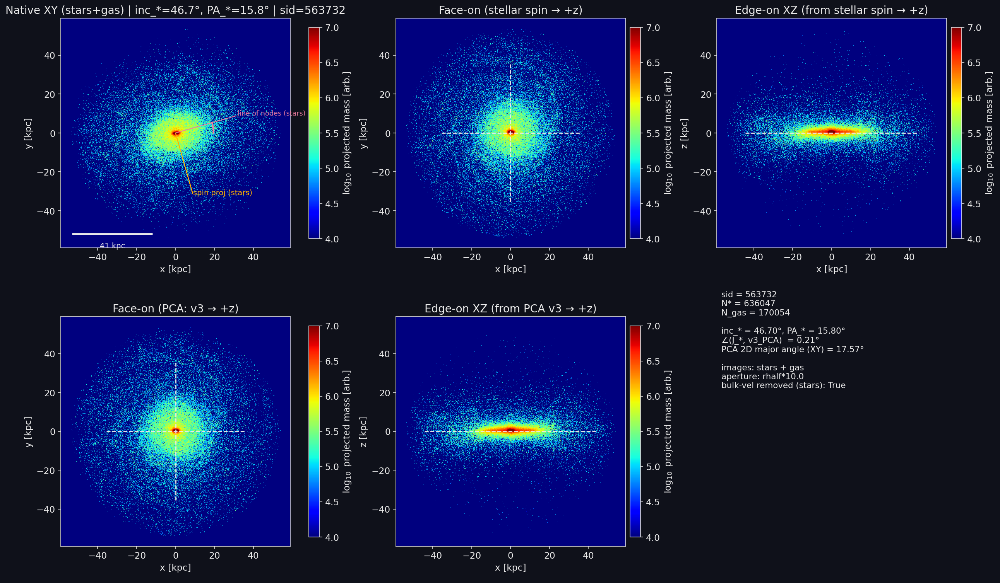

[SAVED] tng_orientation_checks_debug/debug_from_cutout_sid563732_snap99.png


In [10]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

"""
SOL debug: orientations from STARS only; images from STARS+GAS (combined).

- Works on a single TNG cutout HDF5 (no illustris_python).
- Recenter to STELLAR mass COM; subtract stellar bulk velocity.
- Orientation estimators (stars only):
    * Stellar spin J_star
    * PCA 3D minor axis v3  (disk normal)
- Enforce sign consistency: if dot(J_star, v3) < 0, flip J_star.
- Aperture based on stellar half-mass radius (optional); applied to both stars and gas.
- All maps (native, face-on, edge-on) are built from the COMBINED particle set (stars + gas).
- Layout: 2 rows × 3 cols -> [Native XY | Face-on (J*) | Edge-on XZ (J*)]
                                   [Face-on (v3) | Edge-on XZ (v3) | Diagnostics]
"""

import os, json, math, h5py
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# =========================
# USER CONFIG
# =========================
DATA_DIR  = "/scratch/tsingh65/TNG50-1_snap99"
CUTOUT_H5 = f"{DATA_DIR}/cutout_ALLFIELDS_sphere_2p1Rvir_sub563732.hdf5"

snap      = 99
sid       = 563732

# aperture cut relative to stellar half-mass radius (computed from cutout)
use_rhalf_aperture = True
rhalf_multiplier   = 10.0

# field-of-view width (kpc/h); converted to kpc using h
extent_kpc_h = 80.0
nbin         = 1200

# figure / style
dpi_out        = 120
cmap_name      = "jet"           # match your reference
bg_color       = "#0f111a"
fg_color       = "#eaeaea"
spin_star_color= "#ffb000"       # orange (stellar spin)
nodes_color    = "#f37ea1"       # magenta (line of nodes / PA arc)
axes_guide     = "#eaeaea"
scalebar_color = "#eaeaea"
VMIN = 4.0
VMAX = 7.0

mpl.rcParams.update({
    "figure.facecolor": bg_color, "axes.facecolor": bg_color, "savefig.facecolor": bg_color,
    "axes.edgecolor": fg_color, "axes.labelcolor": fg_color, "xtick.color": fg_color,
    "ytick.color": fg_color, "text.color": fg_color, "font.family": "DejaVu Sans", "font.size": 12,
})

# =========================
# Helpers
# =========================
def unit(v):
    v = np.asarray(v, float)
    n = np.linalg.norm(v)
    return v / n if n > 0 else v

def rodrigues_u_to_v(u, v):
    """Active rotation mapping u -> v; returns R so that R @ u == v."""
    u = unit(u); v = unit(v)
    c = float(np.clip(np.dot(u, v), -1.0, 1.0))
    if c > 1 - 1e-12:
        return np.eye(3)
    if c < -1 + 1e-12:
        a = unit(np.cross(u, [1,0,0]) if abs(u[0]) < 0.9 else np.cross(u, [0,1,0]))
        K = np.array([[0,-a[2],a[1]],[a[2],0,-a[0]],[-a[1],a[0],0]])
        return np.eye(3) + 2*(K @ K)    # π-rotation
    a = np.cross(u, v); s = float(np.linalg.norm(a))
    a = a / s
    K = np.array([[0,-a[2],a[1]],[a[2],0,-a[0]],[-a[1],a[0],0]])
    return np.eye(3) + K*s + (K @ K)*(1 - c)

def inc_PA_from_vector(J):
    """
    inc (deg): inclination wrt +z (0 face-on, 90 edge-on), uses |cos|.
    PA  (deg): position angle of line of nodes (z × J) in [0,180), from +x.
    """
    J = np.asarray(J, float); Jn = np.linalg.norm(J)
    if Jn == 0: return np.nan, np.nan
    Jhat = J / Jn
    inc = np.degrees(np.arccos(np.clip(abs(Jhat[2]), 0, 1)))
    n = np.cross([0,0,1.0], Jhat)
    PA = 0.0 if np.hypot(n[0], n[1]) < 1e-14 else (np.degrees(np.arctan2(n[1], n[0])) % 180.0)
    return inc, PA

def pca3_weighted(X, w):
    """Mass-weighted 3D PCA. Return eigvals(desc), eigvecs(cols), and COM."""
    X = np.asarray(X, float); w = np.asarray(w, float)
    wsum = np.sum(w); xc = np.sum(X*w[:,None], axis=0) / max(wsum, 1e-30)
    X0 = X - xc
    C = (X0*w[:,None]).T @ X0 / max(wsum, 1e-30)
    evals, evecs = np.linalg.eigh(C)
    idx = np.argsort(evals)[::-1]
    return evals[idx], evecs[:, idx], xc

def pca2_weighted(XY, w):
    """Mass-weighted 2D PCA on projected coords; return major-axis unit vector and angle (deg)."""
    XY = np.asarray(XY, float); w = np.asarray(w, float)
    wsum = np.sum(w); xc = np.sum(XY*w[:,None], axis=0) / max(wsum, 1e-30)
    X0 = XY - xc
    C = (X0*w[:,None]).T @ X0 / max(wsum, 1e-30)
    evals, evecs = np.linalg.eigh(C)
    maj = unit(evecs[:, np.argmax(evals)])
    ang = (np.degrees(np.arctan2(maj[1], maj[0])) % 180.0)
    return maj, ang

def mass_map_arbitrary(M_weights, XY_kpc, half_width_kpc, nbin):
    """Projected-mass map in ARBITRARY units (sum of weights per pixel)."""
    L = half_width_kpc
    x = np.clip(XY_kpc[:,0], -L, L); y = np.clip(XY_kpc[:,1], -L, L)
    H, xe, ye = np.histogram2d(x, y, bins=nbin, range=[[-L,L],[-L,L]], weights=M_weights)
    return H.T, xe, ye, (2*L)/nbin

def rms_z(arr_xz):
    z = arr_xz[:,2]
    return float(np.sqrt(np.mean((z - np.mean(z))**2)))

# =========================
# Cutout I/O
# =========================
def read_header(h5_path):
    with h5py.File(h5_path, "r") as f:
        hdr = f["Header"].attrs
        h        = float(hdr["HubbleParam"])
        box_ckph = float(hdr["BoxSize"])
        a        = float(hdr.get("Time", 1.0))
    return h, box_ckph, a

def read_pt_data(f, ptype, fields):
    grp = f.get(f"/{ptype}")
    if grp is None:
        return {fld: None for fld in fields}
    out = {}
    for fld in fields:
        ds = grp.get(fld)
        out[fld] = None if ds is None else np.asarray(ds[...], dtype=np.float64)
    return out

def load_particles_from_cutout(h5_path):
    with h5py.File(h5_path, "r") as f:
        stars = read_pt_data(f, "PartType4", ["Coordinates","Masses","Velocities"])
        gas   = read_pt_data(f, "PartType0", ["Coordinates","Masses"])  # velocities not needed for images
    return stars, gas

# =========================
# Main
# =========================
def main():
    print(f"[INFO] Reading cutout: {CUTOUT_H5}")
    h, box_ckpch, a = read_header(CUTOUT_H5)
    print(f"[OK] h={h:.6f}  BoxSize={box_ckpch:.1f} ckpc/h  a={a:.6f}")

    stars, gas = load_particles_from_cutout(CUTOUT_H5)
    if stars["Coordinates"] is None or stars["Masses"] is None or stars["Velocities"] is None:
        raise RuntimeError("Cutout missing stars (PartType4) coords/masses/velocities.")

    # --- STARS: recenter by stellar mass COM; subtract stellar bulk velocity ---
    Xs_ckpch = np.asarray(stars["Coordinates"], float)
    Ms_1e10  = np.asarray(stars["Masses"], float)
    Vs_kms   = np.asarray(stars["Velocities"], float)

    center_ckpch = np.average(Xs_ckpch, axis=0, weights=Ms_1e10)          # COM (ckpc/h)
    Xs_rel_ckpch = Xs_ckpch - center_ckpch[None, :]

    vcm_star = np.average(Vs_kms, axis=0, weights=Ms_1e10)                # bulk vel (km/s)
    Vs_rel   = Vs_kms - vcm_star[None, :]

    # --- GAS (for maps only), recentered to same COM ---
    have_gas = gas["Coordinates"] is not None and gas["Masses"] is not None
    if have_gas:
        Xg_ckpch = np.asarray(gas["Coordinates"], float)
        Mg_1e10  = np.asarray(gas["Masses"], float)
        Xg_rel_ckpch = Xg_ckpch - center_ckpch[None, :]
    else:
        Xg_rel_ckpch = np.empty((0,3), float)
        Mg_1e10      = np.empty((0,), float)

    # --- Aperture using stellar half-mass radius (from *recentered* stars) ---
    Rs = np.linalg.norm(Xs_rel_ckpch, axis=1)
    order = np.argsort(Rs)
    cumM  = np.cumsum(Ms_1e10[order])
    rhalf_star_ckpch = Rs[order][np.searchsorted(cumM, 0.5*cumM[-1])]
    if use_rhalf_aperture and rhalf_star_ckpch > 0:
        Rcut = rhalf_multiplier * rhalf_star_ckpch
        selS = (Rs <= Rcut)
        Xs_rel_ckpch, Ms_1e10, Vs_rel = Xs_rel_ckpch[selS], Ms_1e10[selS], Vs_rel[selS]
        if have_gas:
            Rg = np.linalg.norm(Xg_rel_ckpch, axis=1)
            selG = (Rg <= Rcut)
            Xg_rel_ckpch, Mg_1e10 = Xg_rel_ckpch[selG], Mg_1e10[selG]
        print(f"[INFO] Aperture cut: rhalf*{rhalf_multiplier:.1f} = {Rcut:.1f} ckpc/h")

    # --- Units for orientation (stars only) and for maps (combined) ---
    Xs_kpc   = Xs_rel_ckpch / h
    Ms_msun  = Ms_1e10 * 1e10 / h
    Ximg_kpc = np.vstack([Xs_rel_ckpch / h, Xg_rel_ckpch / h]) if have_gas else (Xs_rel_ckpch / h)
    Wimg_msun= np.concatenate([Ms_msun, (Mg_1e10 * 1e10 / h)]) if have_gas else Ms_msun
    N_star   = len(Ms_msun)
    N_gas    = 0 if not have_gas else len(Mg_1e10)

    # --- Orientations from stars only ---
    J_star = np.sum(np.cross(Xs_rel_ckpch, Vs_rel) * Ms_1e10[:,None], axis=0)
    evals3, evecs3, _ = pca3_weighted(Xs_kpc, Ms_msun)
    v3_hat = unit(evecs3[:,2])  # morphological normal

    # ENFORCE HEMISPHERE CONSISTENCY: make J_star point to same hemisphere as v3
    if np.dot(J_star, v3_hat) < 0:
        J_star *= -1.0

    # Angles & PA (stars only)
    def ang(a,b): a=unit(a); b=unit(b); return np.degrees(np.arccos(np.clip(np.dot(a,b), -1, 1)))
    inc_s, PA_s = inc_PA_from_vector(J_star)
    maj2_xy, ang2_xy = pca2_weighted(Xs_kpc[:,[0,1]], Ms_msun)

    print(f"[INFO] sid={sid} | N*={N_star} | N_gas={N_gas}")
    print(f"  Stellar spin J* = {J_star}  | inc_*={inc_s:.2f}°, PA_*={PA_s:.2f}°")
    print(f"  ∠(J_*, v3_PCA)  = {ang(J_star, v3_hat):.2f}°")
    print(f"  PCA 2D major angle (XY) = {ang2_xy:.2f}°")

    # =========================
    # Build maps (native, face-on, edge-on) from COMBINED particles
    # =========================
    L_kpc = (extent_kpc_h / 2.0) / h

    # Native XY (no rotation)
    H_native, _, _, pix_native = mass_map_arbitrary(Wimg_msun, Ximg_kpc[:,[0,1]], L_kpc, nbin)

    # Face-on / Edge-on from stellar spin
    R_face_star = rodrigues_u_to_v(unit(J_star), np.array([0,0,1.0]))
    X_face_star = (Ximg_kpc @ R_face_star.T)
    H_face_star, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_star[:,[0,1]], L_kpc, nbin)
    H_edge_star, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_star[:,[0,2]], L_kpc, nbin)

    # Face-on / Edge-on from PCA v3
    R_face_pca  = rodrigues_u_to_v(v3_hat, np.array([0,0,1.0]))
    X_face_pca  = (Ximg_kpc @ R_face_pca.T)
    H_face_pca, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_pca[:,[0,1]], L_kpc, nbin)
    H_edge_pca, _, _, _ = mass_map_arbitrary(Wimg_msun, X_face_pca[:,[0,2]], L_kpc, nbin)

    # =========================
    # Annotations (native panel; stars-only vectors)
    # =========================
    J_s_hat = unit(J_star)
    Jstar_xy = unit([J_s_hat[0], J_s_hat[1]])
    n_str = np.cross([0,0,1.0], J_s_hat)  # line of nodes
    n_str_xy = unit([n_str[0], n_str[1]]) if np.linalg.norm(n_str[:2])>0 else np.array([1.0,0.0])
    PA_draw_str = (np.degrees(np.arctan2(n_str_xy[1], n_str_xy[0])) % 360.0)

    # =========================
    # Plot (2 rows x 3 cols)
    # =========================
    fig, axs = plt.subplots(2, 3, figsize=(18, 11), constrained_layout=True)

    def show_map(ax, H, title, xlabel="x [kpc]", ylabel="y [kpc]"):
        im = ax.imshow(np.log10(H + 1e-12), origin="lower",
                       extent=[-L_kpc, L_kpc, -L_kpc, L_kpc],
                       interpolation="nearest", cmap=cmap_name,
                       vmin=VMIN, vmax=VMAX)
        ax.set_xlabel(xlabel); ax.set_ylabel(ylabel); ax.set_title(title)
        for sp in ax.spines.values(): sp.set_edgecolor(fg_color)
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
        cbar.set_label(r"$\log_{10}$ projected mass [arb.]")
        return im

    # Native XY (combined image) + stellar-only annotations
    title0 = f"Native XY (stars+gas) | inc_*={inc_s:.1f}°, PA_*={PA_s:.1f}° | sid={sid}"
    ax0 = axs[0,0]; show_map(ax0, H_native, title0)

    r = 0.55*L_kpc
    ax0.arrow(0,0, r*Jstar_xy[0], r*Jstar_xy[1], color=spin_star_color,
              head_width=0.9*pix_native, head_length=1.6*pix_native, length_includes_head=True)
    ax0.text(r*Jstar_xy[0]*1.02, r*Jstar_xy[1]*1.02, "spin proj (stars)", color=spin_star_color, fontsize=10)

    ax0.arrow(0,0, r*n_str_xy[0], r*n_str_xy[1], color=nodes_color,
              head_width=0.9*pix_native, head_length=1.6*pix_native, length_includes_head=True, alpha=0.85)
    ax0.text(r*n_str_xy[0]*1.02, r*n_str_xy[1]*1.02, "line of nodes (stars)", color=nodes_color, fontsize=9, alpha=0.9)

    # PA arc & scale bar
    def draw_angle_arc(ax, radius, theta1_deg, theta2_deg, color="w", lw=2.0, nseg=100):
        t1 = np.radians(theta1_deg); t2 = np.radians(theta2_deg)
        ts = np.linspace(t1, t2, nseg)
        ax.plot(radius*np.cos(ts), radius*np.sin(ts), color=color, lw=lw)
    draw_angle_arc(ax0, 0.33*L_kpc, 0.0, PA_draw_str, color=nodes_color, lw=2.0)

    def draw_scale_bar(ax, half_width_kpc, frac=0.35, ypad_frac=0.06, color="w", lw=2.5):
        L = half_width_kpc; full = 2*L; bar_len = frac * full
        x0 = -L + 0.05*full; x1 = x0 + bar_len; y = -L + ypad_frac*full
        ax.plot([x0, x1], [y, y], color=color, lw=lw, solid_capstyle="butt")
        ax.text((x0+x1)/2, y - 0.035*full, f"{bar_len:.0f} kpc", color=color, ha="center", va="top", fontsize=10)
    draw_scale_bar(ax0, L_kpc, frac=0.35, color=scalebar_color)

    # Face-on + Edge-on from stellar spin
    show_map(axs[0,1], H_face_star, "Face-on (stellar spin → +z)")
    axs[0,1].plot([-0.6*L_kpc, 0.6*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')
    axs[0,1].plot([0,0], [-0.6*L_kpc, 0.6*L_kpc], color=axes_guide, lw=1.4, ls='--')

    show_map(axs[0,2], H_edge_star, "Edge-on XZ (from stellar spin → +z)", xlabel="x [kpc]", ylabel="z [kpc]")
    axs[0,2].plot([-0.75*L_kpc, 0.75*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')

    # Face-on + Edge-on from PCA v3
    show_map(axs[1,0], H_face_pca, "Face-on (PCA: v3 → +z)")
    axs[1,0].plot([-0.6*L_kpc, 0.6*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')
    axs[1,0].plot([0,0], [-0.6*L_kpc, 0.6*L_kpc], color=axes_guide, lw=1.4, ls='--')

    show_map(axs[1,1], H_edge_pca, "Edge-on XZ (from PCA v3 → +z)", xlabel="x [kpc]", ylabel="z [kpc]")
    axs[1,1].plot([-0.75*L_kpc, 0.75*L_kpc], [0,0], color=axes_guide, lw=1.4, ls='--')

    # Text panel
    axs[1,2].axis("off")
    lines = [
        f"sid = {sid}",
        f"N* = {N_star}",
        f"N_gas = {N_gas}",
        "",
        f"inc_* = {inc_s:.2f}°, PA_* = {PA_s:.2f}°",
        f"∠(J_*, v3_PCA)  = {ang(J_star, v3_hat):.2f}°",
        f"PCA 2D major angle (XY) = {ang2_xy:.2f}°",
        "",
        f"images: stars + gas",
        f"aperture: {'rhalf*'+str(rhalf_multiplier) if use_rhalf_aperture else 'none'}",
        f"bulk-vel removed (stars): True",
    ]
    axs[1,2].text(0.02, 0.98, "\n".join(lines), transform=axs[1,2].transAxes,
                  va="top", ha="left", fontsize=11, color=fg_color)

    # save
    outdir = "tng_orientation_checks_debug"
    os.makedirs(outdir, exist_ok=True)
    outfile = os.path.join(outdir, f"debug_from_cutout_sid{sid}_snap{snap}.png")
    plt.savefig(outfile, dpi=dpi_out)
    plt.show()
    print(f"[SAVED] {outfile}")

if __name__ == "__main__":
    main()